<a id='home'></a>
### purpose

visualize validation of outlier climate scenarios

### notes

RONA (and to some extent LFMM) are doing worse than GF and RDA, so figures that are made across programs should keep this in mind

    - in some figures I remove RONA
    
boxplots fill NA scores as 0, whereas 2D-histograms do not
    
### outline

1. [get data](#data)
    1. [map seed to final local adaptation](#final_la)
    1. [map seed to landscape](#landscape)
    1. [determine standard deviations for climate vals used in outlier climate scenarios](#stdev)
    1. [retrieve validations of climate outlier scenarios](#retrieve)
    1. [make local adaptation bins and figure metadata](#bins)
    1. [remove RDA outliers and nuisance data](#rmrda)<p></p>
1. [explore missing data](#explore)
    
    I want to make sure that the reason there is a decline in performance isn't due to a smaller sample size as populations fall out of correlations.

    sets of populations that all have 0 fitness in the future environment can cause 'nan' correlations becuase there is no variation in fitness. the farther the climate outlier scenario from a set of populations' home environments, the more likely populations are to have 0 fitness.
    
    conclusion: around 4 std from mean training climate, oligogenic sims start causing all pops to have zero fitness, then remaining sims follow when > 4std.<p></p>
    
    1. [make figures for missing data](#missfigs)
    1. [fill in na values with 0  ](#fillna)<p></p>
    
1. [make figures for effects](#mainfigs)
    1. [local adaptation vs score](#la_figs)
    1. [by simulation params](#by_hue)
    1. [by program](#by_prog)
    1. [by population blocks](#by_block)
    

In [1]:
from pythonimports import *
from myfigs import adjust_box_widths, save_pdf, draw_xy, scatter2d, histo_box

import MVP_00_start_pipeline as mvp00
import MVP_01_train_gradient_forests as mvp01
import MVP_05_train_RONA as mvp05
import MVP_10_train_lfmm2_offset as mvp10
import MVP_summary_functions as mvp

import seaborn as sns
import itertools as it
plt.rcParams.update({'font.family' : 'serif'})

t1 = dt.now()  # notebook timer

envdir = '/home/b.lind/offsets/climate_outlier_runs/garden_files'
fitness_dir = '/home/b.lind/offsets/climate_outlier_runs/fitness_mats'

summarydir = '/work/lotterhos/MVP-Offsets/run_20220919/summaries'
figdir = makedir(f'{summarydir}/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs')

mvp.latest_commit()
session_info.show()

#########################################################
Today:	December 21, 2023 - 09:56:19 EST
python version: 3.8.5
conda env: mvp_env

Current commit of pythonimports:
commit 419895d157c97717f835390196c13cf973d25eba  
Merge: e20434f 1e09b6c  
Author: Brandon Lind <lind.brandon.m@gmail.com>

Current commit of MVP_offsets:
commit c5bc403582e5bafc1036be8cd2a4bb0b4d154623  
Author: Brandon Lind <lind.brandon.m@gmail.com>  
Date:   Mon Dec 18 14:38:19 2023 -0500
#########################################################



<a id='data'></a>
# get data

[top](#home)

In [2]:
params = mvp.read_params_file()

params

100%|███████████████| 2250/2250 [00:02<00:00, 826.66it/s]


,level,reps,arch,demog_name,demog_level_sub,demog_level,MIG_x,MIG_y,xcline,ycline,demog,METAPOP_SIDE_x,METAPOP_SIDE_y,Nequal,isVariableM,MIG_breaks,arch_level_sub,arch_level,MU_base,MU_QTL_proportion,SIGMA_QTN_1,SIGMA_QTN_2,SIGMA_K_1,SIGMA_K_2,N_traits,ispleiotropy,seed,final_LA,glevel,plevel,pleio,slevel,landscape,popsize,migration,landscape-slevel
1231094,highly-polygenic_1-trait__Est-Clines_N-cline-c...,1,highly-polygenic_1-trait,Est-Clines_N-cline-center-to-edge_m-constant,N-cline-center-to-edge_m-constant,Est-Clines,0.49,0.07,linear,linear,Estuary,10,10,4,0,0,1-trait,highly-polygenic,1.000000e-07,0.250,0.002,0.002,0.5,0.5,1,0,1231094,0.500854,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,Est-Clines_1-trait
1231095,highly-polygenic_1-trait__Est-Clines_N-cline-N...,1,highly-polygenic_1-trait,Est-Clines_N-cline-N-to-S_m-constant,N-cline-N-to-S_m-constant,Est-Clines,0.49,0.07,linear,linear,Estuary,10,10,2,0,0,1-trait,highly-polygenic,1.000000e-07,0.250,0.002,0.002,0.5,0.5,1,0,1231095,0.505075,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-N-to-S,m-constant,Est-Clines_1-trait
1231096,highly-polygenic_1-trait__Est-Clines_N-equal_m...,1,highly-polygenic_1-trait,Est-Clines_N-equal_m_breaks,N-equal_m_breaks,Est-Clines,0.49,0.07,linear,linear,Estuary,10,10,0,0,1,1-trait,highly-polygenic,1.000000e-07,0.250,0.002,0.002,0.5,0.5,1,0,1231096,0.499265,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-equal,m-breaks,Est-Clines_1-trait
1231097,highly-polygenic_1-trait__Est-Clines_N-equal_m...,1,highly-polygenic_1-trait,Est-Clines_N-equal_m-constant,N-equal_m-constant,Est-Clines,0.49,0.07,linear,linear,Estuary,10,10,0,0,0,1-trait,highly-polygenic,1.000000e-07,0.250,0.002,0.002,0.5,0.5,1,0,1231097,0.499365,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-equal,m-constant,Est-Clines_1-trait
1231098,highly-polygenic_1-trait__Est-Clines_N-variabl...,1,highly-polygenic_1-trait,Est-Clines_N-variable_m-variable,N-variable_m-variable,Est-Clines,0.49,0.07,linear,linear,Estuary,10,10,3,1,0,1-trait,highly-polygenic,1.000000e-07,0.250,0.002,0.002,0.5,0.5,1,0,1231098,0.501054,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-variable,m-variable,Est-Clines_1-trait
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1233339,oligogenic_2-trait-pleiotropy-unequal-S__SS-Mt...,10,oliogenic_2-trait-pleiotropy-unequal-S,SS-Mtn_N-cline-center-to-edge_m-constant,N-cline-center-to-edge_m-constant,SS-Mtn,0.03,0.03,V,linear,SS,10,10,4,0,0,2-trait-pleiotropy-unequal-S,oliogenic,1.000000e-07,0.001,0.400,0.400,0.5,4.0,2,1,1233339,0.378143,oligogenic,2-trait,pleiotropy,unequal-S,SS-Mtn,N-cline-center-to-edge,m-constant,SS-Mtn_unequal-S
1233340,oligogenic_2-trait-pleiotropy-unequal-S__SS-Mt...,10,oliogenic_2-trait-pleiotropy-unequal-S,SS-Mtn_N-cline-N-to-S_m-constant,N-cline-N-to-S_m-constant,SS-Mtn,0.03,0.03,V,linear,SS,10,10,2,0,0,2-trait-pleiotropy-unequal-S,oliogenic,1.000000e-07,0.001,0.400,0.400,0.5,4.0,2,1,1233340,0.386475,oligogenic,2-trait,pleiotropy,unequal-S,SS-Mtn,N-cline-N-to-S,m-constant,SS-Mtn_unequal-S
1233341,oligogenic_2-trait-pleiotropy-unequal-S__SS-Mt...,10,oliogenic_2-trait-pleiotropy-unequal-S,SS-Mtn_N-equal_m_breaks,N-equal_m_breaks,SS-Mtn,0.03,0.03,V,linear,SS,10,10,0,0,1,2-trait-pleiotropy-unequal-S,oliogenic,1.000000e-07,0.001,0.400,0.400,0.5,4.0,2,1,1233341,0.406991,oligogenic,2-trait,pleiotropy,unequal-S,SS-Mtn,N-equal,m-breaks,SS-Mtn_unequal-S
1233342,oligogenic_2-trait-pleiotropy-unequal-S__SS-Mt...,10,oliogenic_2-trait-pleiotropy-unequal-S,SS-Mtn_N-equal_m-constant,N-equal_m-constant,SS-Mtn,0.03,0.03,V,linear,SS,10,10,0,0,0,2-trait-pleiotropy-unequal-S,oliogenic,1.000000e-07,0.001,0.400,0.400,0.5,4.0,2,1,1233342,0.411540,oligogenic,2-trait,pleiotropy,unequal-S,SS-Mtn,N-equal,m-constant,SS-Mtn_unequal-S


<a id='final_la'></a>
### map seed to final LA

[top](#home)

In [3]:
# map seed to final LA
final_la = params.final_LA.to_dict()

final_la['1231094']

0.500854

<a id='landscape'></a>
### map seed to landscape

[top](#home)

In [4]:
seed_landscape = dict(zip(params.seed.astype(str), params.demog_level))

seed_landscape['1231094']

'Est-Clines'

In [5]:
landscape_seeds = params.groupby('demog_level')['seed'].apply(list).to_dict()

landscape_seeds['Est-Clines'][:5]

[1231094, 1231095, 1231096, 1231097, 1231098]

<a id='stdev'></a>
### determine standard deviations for climate vals used in outlier climate scenarios

[top](#home)

In [6]:
# get outlierness of outlier scenarios
landscape_vals = defaultdict(dict)
for landscape in params.demog_level.unique():
    # get an example seed for this landscape
    example_seed = landscape_seeds[landscape][0]
    
    # use example seed to retrieve landscape envdata
    envdata = mvp05.get_envdata(
        mvp01.read_ind_data(mvp.slimdir, example_seed)
    )
    
    # calc mean and standard deviation
    sd = envdata.apply(np.std)
    mean = envdata.apply(np.mean)
    
    # center/standardize the outlier scenarios
    for scenario in mvp.new_envs:
        landscape_vals[landscape][scenario] = (scenario - mean) / sd
        
# display center/std as dataframes
for landscape, vals in landscape_vals.items():
    print(landscape)
    display(pd.DataFrame(vals))


Reading in info for subsampled individuals ...

Getting environmental data for each subpopID ...

Reading in info for subsampled individuals ...

Getting environmental data for each subpopID ...

Reading in info for subsampled individuals ...

Getting environmental data for each subpopID ...
Est-Clines


,0.00,1.10,1.50,1.75,2.00,2.25,2.50,2.75,3.00,3.25,3.50,3.75
sal_opt,-3.478770e-18,1.723369,2.350048,2.741723,3.133397,3.525072,3.916747,4.308421,4.700096,5.091771,5.483445,5.87512
temp_opt,0.000000e+00,1.723369,2.350048,2.741723,3.133397,3.525072,3.916747,4.308421,4.700096,5.091771,5.483445,5.87512


SS-Clines


,0.00,1.10,1.50,1.75,2.00,2.25,2.50,2.75,3.00,3.25,3.50,3.75
sal_opt,-3.478770e-18,1.723369,2.350048,2.741723,3.133397,3.525072,3.916747,4.308421,4.700096,5.091771,5.483445,5.87512
temp_opt,0.000000e+00,1.723369,2.350048,2.741723,3.133397,3.525072,3.916747,4.308421,4.700096,5.091771,5.483445,5.87512


SS-Mtn


,0.00,1.10,1.50,1.75,2.00,2.25,2.50,2.75,3.00,3.25,3.50,3.75
sal_opt,0.0,1.555635,2.121320,2.474874,2.828427,3.181981,3.535534,3.889087,4.242641,4.596194,4.949747,5.303301
temp_opt,0.0,1.723369,2.350048,2.741723,3.133397,3.525072,3.916747,4.308421,4.700096,5.091771,5.483445,5.875120


In [7]:
# map climate val to standard deviations - note SS-Mtn-sal_opt is different from rest, noted in manuscript
outlierness = pd.DataFrame(vals).loc['temp_opt'].round(2).to_dict()  # SS-Mtn dataframe from above

outlierness

{0.0: 0.0,
 1.1: 1.72,
 1.5: 2.35,
 1.75: 2.74,
 2.0: 3.13,
 2.25: 3.53,
 2.5: 3.92,
 2.75: 4.31,
 3.0: 4.7,
 3.25: 5.09,
 3.5: 5.48,
 3.75: 5.88}

<a id='retrieve'></a>
### retrieve validations of climate outlier scenarios

[top](#home)

In [8]:
climdir = '/home/b.lind/offsets/climate_outlier_runs'

clim_rundirs = fs(climdir, startswith='run', dirs=True) + \
               fs(climdir, startswith='1-trait', exclude='garden_files', dirs=True)

clim_rundirs

['/home/b.lind/offsets/climate_outlier_runs/run_20220919_0-225',
 '/home/b.lind/offsets/climate_outlier_runs/run_20220919_1125-1350',
 '/home/b.lind/offsets/climate_outlier_runs/run_20220919_1350-1575',
 '/home/b.lind/offsets/climate_outlier_runs/run_20220919_1575-1800',
 '/home/b.lind/offsets/climate_outlier_runs/run_20220919_1800-2025',
 '/home/b.lind/offsets/climate_outlier_runs/run_20220919_2025-2250',
 '/home/b.lind/offsets/climate_outlier_runs/run_20220919_225-450',
 '/home/b.lind/offsets/climate_outlier_runs/run_20220919_450-675',
 '/home/b.lind/offsets/climate_outlier_runs/run_20220919_675-900',
 '/home/b.lind/offsets/climate_outlier_runs/run_20220919_900-1125',
 '/home/b.lind/offsets/climate_outlier_runs/1-trait_run_20220919_0-225',
 '/home/b.lind/offsets/climate_outlier_runs/1-trait_run_20220919_1125-1350',
 '/home/b.lind/offsets/climate_outlier_runs/1-trait_run_20220919_1350-1575',
 '/home/b.lind/offsets/climate_outlier_runs/1-trait_run_20220919_1575-1800',
 '/home/b.lind/of

In [9]:
def add_bool_ntraits_column(df):
    """Add column that tells whether a non-causal env was included in offset training.
    
    Notes
    -----
    - 1-trait sims using only 1 env in offset training will be `no noncausal`
    - copied from normal processing of pipeline output eg 02.01.00.00_save_level_scores_0000-0225.ipynb
    """
    # default value (for 1-trait sims using only 1 env in offset training)
    df['noncausal_env'] = '1-trait 1-env'
    
    # if sims had one causal env but both envs were used in training
    df.loc[
        (df['plevel']=='1-trait') & (df['ntraits']=='ntraits-2'),
        'noncausal_env'
    ] = '1-trait 2-envs'
    
    # if sims had two causal envs and both were used in training (only option for 2-trait sims)
    df.loc[
        (df['plevel']=='2-trait') & (df['ntraits']=='ntraits-2'),
        'noncausal_env'
    ] = '2-trait 2-envs'
    
    return df


validations = []
for climdir in pbar(clim_rundirs):
    for program in ['GF', 'lfmm2', 'rda', 'RONA']:
        f = op.join(climdir, f'{program}/validation/climate_outlier_validation_scores.txt')
        
        if op.exists(f):
            df = pd.read_table(f).copy()
                
            if program == 'RONA':
                dfs = []
                for env in ['sal_opt', 'temp_opt']:
                    x = df[df.env==env].copy()
                    x['program'] = f'RONA-{env}'
                    dfs.append(x)
                df = pd.concat(dfs)
                
                assert len(df['program'].unique()) == 2
                assert all(df.program.str.contains(program))
            
            elif program == 'rda':
                df['program'] = 'rda-' + df.structcorr
                df = add_bool_ntraits_column(df)
                
            else:  # if program != 'RONA':
                assert len(df['program'].unique()) == 1
                assert df['program'].iloc[0] == program
                
                if program == 'GF':
                    if op.basename(climdir).startswith('1-trait'):
                        df['noncausal_env'] = '1-trait 1-env'  # SPECIFIC FOR 1-TRAIT GF RUNS!!!!
                    else:
                        df['noncausal_env'] = df.plevel.map({'1-trait' : '1-trait 2-envs',
                                                             '2-trait' : '2-trait 2-envs'})
                elif program == 'lfmm2':
                    df = add_bool_ntraits_column(df)
                
            
            validations.append(df)
            
        else:
            if op.basename(climdir).startswith('1-trait') and program != 'GF':
                continue

            print(ColorText(f).bold().fail())
            
# combine dataframes and add in metadata
validation = pd.concat(validations).reset_index(drop=True)
validation['demography'] = validation['popsize'] + '_' + validation['migration']
validation['final_la'] = validation.seed.astype(str).map(final_la)
validation['landscape'] = validation.seed.astype(str).map(seed_landscape)
validation['outlierness'] = validation.outlier_clim.map(outlierness)
        
# combine dataframes and add in metadata, remove rda outliers, keep nuisance to explore missing data later
validation = mvp.subset_dataframe(
    validation,
    keep_nuisance=True,
    remove_rda_outliers=True
).reset_index(drop=True)

validation.head()

100%|███████████████| 20/20 [00:05<00:00,  3.84it/s]


,seed,marker_set,program,outlier_clim,score,block,glevel,plevel,pleio,slevel,landscape,popsize,migration,noncausal_env,ntraits,ind_or_pooled,use_RDA_outliers,structcorr,env,demography,final_la,outlierness
0,1231094,adaptive,GF,0.00,-0.780956,all,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,1-trait 2-envs,NaN,NaN,NaN,NaN,NaN,N-cline-center-to-edge_m-constant,0.500854,0.00
1,1231094,adaptive,GF,1.10,-0.915925,all,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,1-trait 2-envs,NaN,NaN,NaN,NaN,NaN,N-cline-center-to-edge_m-constant,0.500854,1.72
2,1231094,adaptive,GF,1.50,-0.872813,all,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,1-trait 2-envs,NaN,NaN,NaN,NaN,NaN,N-cline-center-to-edge_m-constant,0.500854,2.35
3,1231094,adaptive,GF,1.75,-0.827631,all,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,1-trait 2-envs,NaN,NaN,NaN,NaN,NaN,N-cline-center-to-edge_m-constant,0.500854,2.74
4,1231094,adaptive,GF,2.00,-0.757272,all,highly-polygenic,1-trait,no pleiotropy,NaN,Est-Clines,N-cline-center-to-edge,m-constant,1-trait 2-envs,NaN,NaN,NaN,NaN,NaN,N-cline-center-to-edge_m-constant,0.500854,3.13


In [10]:
assert validation.outlierness.notnull().all()

<AxesSubplot:>

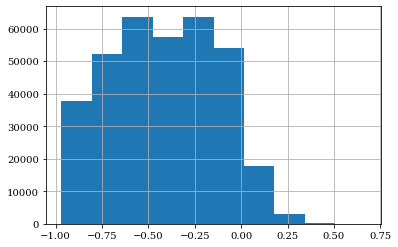

In [11]:
# includes nuisance and rda outliers
validation[(validation.outlier_clim != 0) & (validation.block == 'all')].score.hist()

<AxesSubplot:>

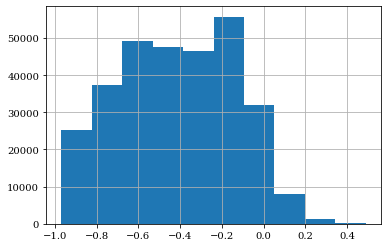

In [12]:
# excludes nuisance
mvp.subset_dataframe(
    validation[(validation.outlier_clim != 0) & (validation.block == 'all')],
    keep_nuisance=False,
    remove_rda_outliers=True
).score.hist()

<a id='bins'></a>
### make local adaptation bins and figure metadata

[top](#home)

In [13]:
# make local adaptation bins
num_bins = 3

color_map = sns.color_palette("ch:s=-.2, r=.6", n_colors=num_bins)[:-1]

validation['final_la_bin'] = np.nan
labels = []
for x in np.linspace(validation.final_la.min(), validation.final_la.max(), num_bins)[1:]:
    current_bin = round(x, 2)

    if len(labels) == 0:
        label = f'%s < LA ≤ {current_bin}' % validation.final_la.round(2).min()
    else:
        label = f'{last_bin} < LA ≤ {current_bin}'
        
    last_bin = current_bin
    
    print(label)
    
    validation.loc[(validation.final_la <= x) & (validation.final_la_bin.isnull()), 'final_la_bin'] = label
    
    mvp.boxplot_kwargs['palette'][label] = color_map[len(labels)]
    
    labels.append(label)
    
labels

0.25 < LA ≤ 0.42
0.42 < LA ≤ 0.58


['0.25 < LA ≤ 0.42', '0.42 < LA ≤ 0.58']

In [14]:
# add metadata
mvp.hue_order['final_la_bin'] = labels  #[::-1]

mvp.hue_order['final_la_bin']

['0.25 < LA ≤ 0.42', '0.42 < LA ≤ 0.58']

In [15]:
# add metadata
for label in labels:
    mvp.factor_names[label] = label

In [16]:
# add metadata
mvp.factor_names['final_la_bin'] = 'Local Adaptation (ΔSA)'

<a id='rmrda'></a>
### remove RDA outliers and nuisance data

[top](#home)

In [17]:
# save copy for exploring missing data
validation_copy = validation.copy()

In [18]:
# remove RDA outliers and nuisance data
validation = mvp.subset_dataframe(
    validation,
    keep_nuisance=False,
    remove_rda_outliers=True
)

<AxesSubplot:>

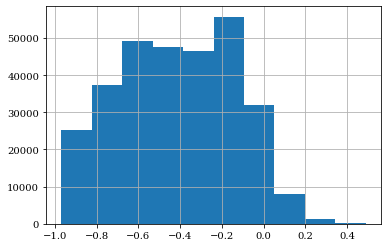

In [19]:
validation[(validation.outlier_clim != 0) & (validation.block == 'all')].score.hist()

<a id='explore'></a>
# explore missing data

[top](#home)

#### this shows that as the outlier clim gets farther from home environment, more pop sets have a single value (0) fitness and cause correlations to break (ie are given 'nan')

In [20]:
# print out the number of nan scores (due to a set of pops all having 0 fitness)
    # for marker set 'all'
for pop_block in validation_copy.block.unique():
    
    print(ColorText(pop_block).bold())
    vscores = validation_copy[
        (validation_copy.block==pop_block) &
        (validation_copy.marker_set=='all')
    ].copy()
    print(
        vscores.groupby('outlierness')['score'].apply(
            lambda scores: scores.isnull().sum() / len(scores)  # percent missing data
        )
    )


all
outlierness
0.00    0.000000
1.72    0.000000
2.35    0.000000
2.74    0.000000
3.13    0.000000
3.53    0.000393
3.92    0.023189
4.31    0.233984
4.70    0.556662
5.09    0.681908
5.48    0.865584
5.88    0.985851
Name: score, dtype: float64
northwest
outlierness
0.00    0.000000
1.72    0.000000
2.35    0.000000
2.74    0.000000
3.13    0.000000
3.53    0.001179
3.92    0.028560
4.31    0.279838
4.70    0.628193
5.09    0.715839
5.48    0.922966
5.88    0.992532
Name: score, dtype: float64
rangecenter
outlierness
0.00    0.000000
1.72    0.000000
2.35    0.001572
2.74    0.089349
3.13    0.264247
3.53    0.687410
3.92    0.756190
4.31    0.790646
4.70    0.927289
5.09    0.995284
5.48    0.999607
5.88    1.000000
Name: score, dtype: float64
southeast
outlierness
0.00    0.000000
1.72    0.002489
2.35    0.450413
2.74    0.543168
3.13    0.692519
3.53    0.818944
3.92    0.872396
4.31    0.881436
4.70    0.898598
5.09    0.965020
5.48    0.998821
5.88    1.000000
Name: score, dty

##### how much is due to given programs

In [21]:
# print out the number of nan scores (due to a set of pops all having 0 fitness)
for pop_block in validation_copy.block.unique():
   
    print(ColorText(f'\n{pop_block}').bold())
    vscores = validation_copy[validation_copy.block==pop_block].copy()
    
    for program in vscores.program.unique():
        print(ColorText(program).blue().bold())
        pscores = vscores[vscores.program==program]
        
        print(
            pscores.groupby('outlierness')['score'].apply(
                lambda scores: scores.isnull().sum() / len(scores)  # percent missing data
            )
        )


all
GF
outlierness
0.00    0.000000
1.72    0.000000
2.35    0.000000
2.74    0.000000
3.13    0.000000
3.53    0.000370
3.92    0.023704
4.31    0.231852
4.70    0.565185
5.09    0.699630
5.48    0.873333
5.88    0.986667
Name: score, dtype: float64
lfmm2
outlierness
0.00    0.000000
1.72    0.000000
2.35    0.000000
2.74    0.000000
3.13    0.000000
3.53    0.000370
3.92    0.023704
4.31    0.231852
4.70    0.565185
5.09    0.699630
5.48    0.873333
5.88    0.986667
Name: score, dtype: float64
rda-nocorr
outlierness
0.00    0.000000
1.72    0.000000
2.35    0.000000
2.74    0.000000
3.13    0.000000
3.53    0.000370
3.92    0.023704
4.31    0.231852
4.70    0.565185
5.09    0.699630
5.48    0.873333
5.88    0.986667
Name: score, dtype: float64
rda-structcorr
outlierness
0.00    0.000000
1.72    0.000000
2.35    0.000000
2.74    0.000000
3.13    0.000000
3.53    0.000370
3.92    0.023704
4.31    0.231852
4.70    0.565185
5.09    0.699630
5.48    0.873333
5.88    0.986667
Name: score,

<a id='missfigs'></a>
### make figures for missing data

[top](#home)

In [22]:
mvp.hue_order.keys()

dict_keys(['landscape', 'glevel', 'pleio', 'slevel', 'popsize', 'migration', 'noncausal_env', 'marker_set', 'program', 'demography', 'final_la_bin'])

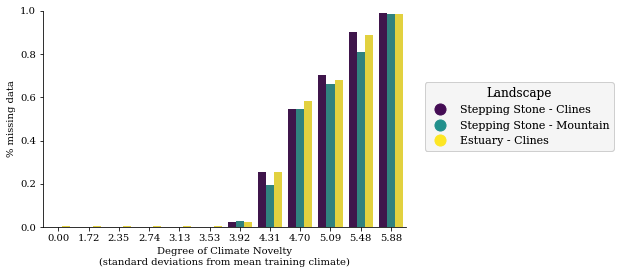

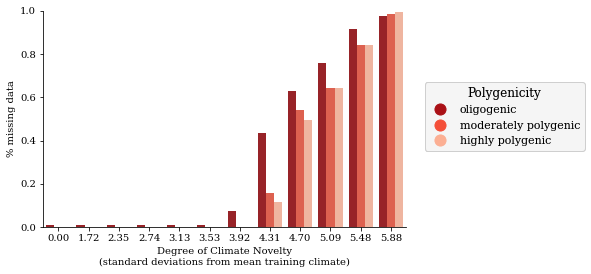

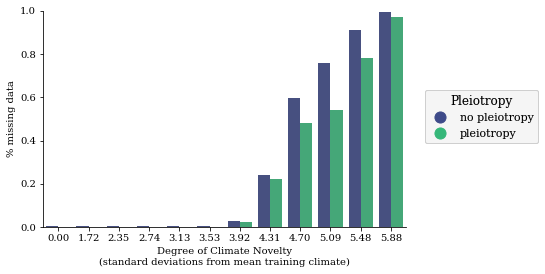

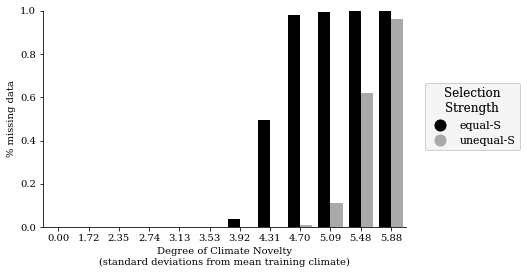

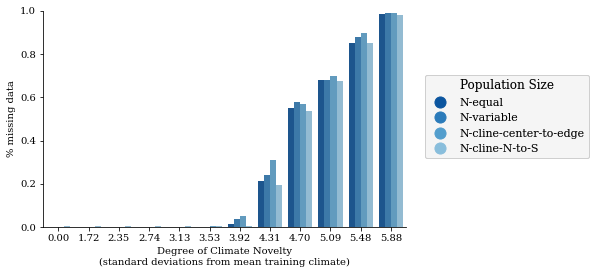

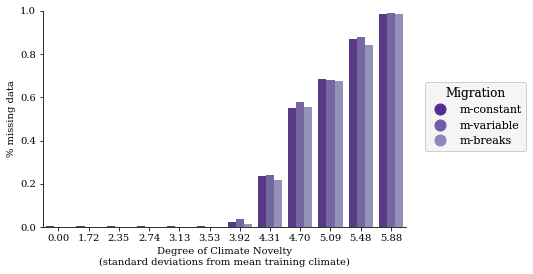

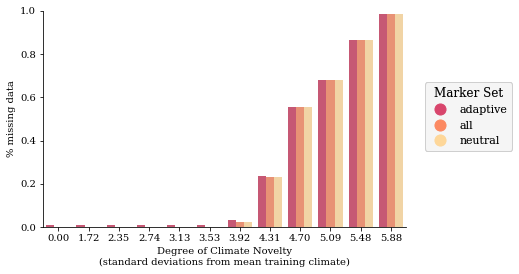

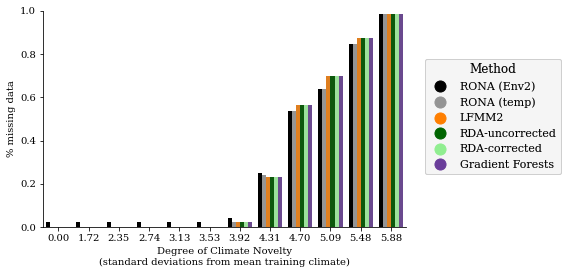

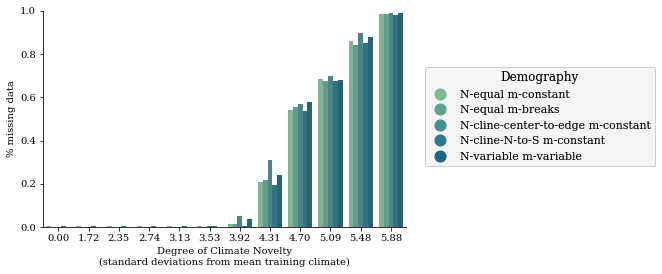

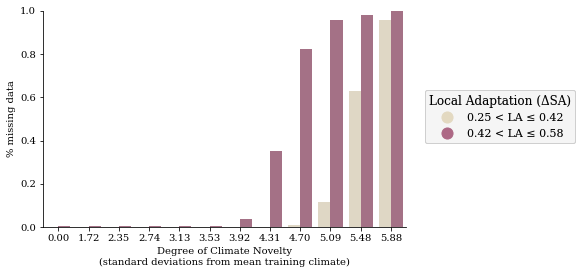

In [23]:
for hue, hue_order in mvp.hue_order.items():
    if hue in ['noncausal_env']:
        continue
    
    # subset data
    df = validation_copy[validation_copy.block=='all'].copy()

    # convert to seaborn-compatible dataframe (nest outlier_clim in hue)
    x = df.groupby(hue).apply(
        lambda hue_df: hue_df.groupby('outlier_clim')['score'].apply(
            lambda scores: scores.isnull().sum() / len(scores)
        )
    )
    x.index.name = None
    data = pd.melt(x.reset_index(), id_vars='index')
    data.columns = [hue, 'outlier_clim', '% missing data']
    
    data['outlierness'] = data.outlier_clim.map(outlierness)
    assert data.outlierness.notnull().all()
    
    # make fig
    g = sns.catplot(
        data=data,
        x='outlierness',
        order=sorted(data.outlierness.unique()),
        y='% missing data',
        hue=hue,
        hue_order=hue_order,
        palette=mvp.boxplot_kwargs['palette'],
        kind='bar',
        legend=False
    )
    
    # clean up fig
    mvp.add_legend(g.figure, color_by=hue, loc='center left', bbox_to_anchor=(1, 0.55))
    g.set(ylim=(0, 1), xlabel='Degree of Climate Novelty\n(standard deviations from mean training climate)')
    g.figure.set_size_inches((6, 3.5))
    g.axes[0][0].set_xticklabels(
        ['%.02f' % float(label.get_text()) for label in g.axes[0][0].get_xticklabels()],
    )
    
    plt.show()

In [24]:
# preview inputs to previous for-loop
display(x)

data.head()

outlier_clim,0.00,1.10,1.50,1.75,2.00,2.25,2.50,2.75,3.00,3.25,3.50,3.75
0.25 < LA ≤ 0.42,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010783,0.117412,0.627396,0.958067
0.42 < LA ≤ 0.58,0.004874,0.004874,0.004874,0.004874,0.004874,0.005459,0.039026,0.350588,0.823455,0.957497,0.981868,0.999415


,final_la_bin,outlier_clim,% missing data,outlierness
0,0.25 < LA ≤ 0.42,0.0,0.000000,0.00
1,0.42 < LA ≤ 0.58,0.0,0.004874,0.00
2,0.25 < LA ≤ 0.42,1.1,0.000000,1.72
3,0.42 < LA ≤ 0.58,1.1,0.004874,1.72
4,0.25 < LA ≤ 0.42,1.5,0.000000,2.35


In [25]:
# numbers for the figures above
for block in validation.block.unique():
    print(ColorText(block).bold())
    vscores = validation[validation.block==block].copy()
    print(vscores.groupby('outlierness')['score'].apply(lambda scores: scores.isnull().sum() / len(scores)))
    
    for outlier_clim in vscores.outlier_clim.unique():
        print(ColorText(f'\t{outlier_clim}').bold().blue())
        counts = vscores[vscores.score.isnull() & (vscores.outlier_clim == outlier_clim)].program.value_counts()
        print('\t' + '\n\t'.join(counts.__repr__().split('\n')))


all
outlierness
0.00    0.000000
1.72    0.000000
2.35    0.000000
2.74    0.000000
3.13    0.000000
3.53    0.000461
3.92    0.021417
4.31    0.239272
4.70    0.530360
5.09    0.628771
5.48    0.842481
5.88    0.983419
Name: score, dtype: float64
	0.0
	Series([], Name: program, dtype: int64)
	1.1
	Series([], Name: program, dtype: int64)
	1.5
	Series([], Name: program, dtype: int64)
	1.75
	Series([], Name: program, dtype: int64)
	2.0
	Series([], Name: program, dtype: int64)
	2.25
	GF                3
	lfmm2             3
	rda-nocorr        3
	rda-structcorr    3
	RONA-sal_opt      3
	RONA-temp_opt     3
	Name: program, dtype: int64
	2.5
	GF                147
	lfmm2             147
	rda-nocorr        147
	rda-structcorr    147
	RONA-temp_opt     147
	RONA-sal_opt      102
	Name: program, dtype: int64
	2.75
	GF                1605
	lfmm2             1605
	rda-nocorr        1605
	rda-structcorr    1605
	RONA-temp_opt     1602
	RONA-sal_opt      1329
	Name: program, dtype: int64
	3.0
	GF 

In [26]:
# what specifically is falling out?
    # early on, there are either no RDA outliers (RDA) or no adaptive markers with 
        # linear relationships with climate (RONA)
for outlierness in validation_copy.outlierness.unique():
    df = validation_copy[validation_copy.score.isnull() & 
                     (validation_copy.outlierness == outlierness) & 
                     (validation_copy.block == 'all')]
    combos = df.marker_set + '_' + df.program + '_' + df.glevel

    print(ColorText(f'\noutlierness').bold().__str__() + f' = {outlierness}')
    for combo, count in Counter(combos).items():
        print('\t', combo, count)


outlierness = 0.0
	 adaptive_RONA-sal_opt_mod-polygenic 21
	 adaptive_RONA-sal_opt_oligogenic 129

outlierness = 1.72
	 adaptive_RONA-sal_opt_mod-polygenic 21
	 adaptive_RONA-sal_opt_oligogenic 129

outlierness = 2.35
	 adaptive_RONA-sal_opt_mod-polygenic 21
	 adaptive_RONA-sal_opt_oligogenic 129

outlierness = 2.74
	 adaptive_RONA-sal_opt_mod-polygenic 21
	 adaptive_RONA-sal_opt_oligogenic 129

outlierness = 3.13
	 adaptive_RONA-sal_opt_mod-polygenic 21
	 adaptive_RONA-sal_opt_oligogenic 129

outlierness = 3.53
	 adaptive_RONA-sal_opt_mod-polygenic 21
	 adaptive_RONA-sal_opt_oligogenic 130
	 adaptive_GF_oligogenic 1
	 all_GF_oligogenic 1
	 neutral_GF_oligogenic 1
	 adaptive_lfmm2_oligogenic 1
	 all_lfmm2_oligogenic 1
	 neutral_lfmm2_oligogenic 1
	 adaptive_rda-nocorr_oligogenic 1
	 adaptive_rda-structcorr_oligogenic 1
	 all_rda-nocorr_oligogenic 1
	 all_rda-structcorr_oligogenic 1
	 neutral_rda-nocorr_oligogenic 1
	 neutral_rda-structcorr_oligogenic 1
	 all_RONA-sal_opt_oligogenic 1


<a id='fillna'></a>
### fill in na values with 0

I end up filling in NA with 0 within the `generic_fig` function below (on a copy of `validation`)

[top](#home)

In [27]:
validation.score.isnull().sum()

817254

<a id='mainfigs'></a>
# make figures for effects

these figs replace NA scores as 0 (see missing data figs above)

[top](#home)

In [28]:
def cleanup_fig(g, axes=None, catplot=True, ncol='auto', hue=None, fontsize=9, 
                ylabel="Performance (Kendall's $\\tau$)"):
    """Make a fig look rull nice."""
    if axes is None:
        axes = list(g.axes)
    adjust_box_widths(axes, 0.8)       
    mvp.jitter_fliers(axes=[axes])

    if hue is not None:
        bbox_to_anchor = (0.55, 1.15) if hue != 'program' else (0.55, 1.22)
        mvp.add_legend(g.figure, color_by=hue, loc='upper center', bbox_to_anchor=bbox_to_anchor, ncol=ncol,
                       fontsize=fontsize)
    
    for ax in [axes]:
        ax.axhline(0, linestyle='--', color='gainsboro', linewidth=1, zorder=0)
        ax.set_xlabel('Degree of Climate Novelty\n(standard deviations from mean training climate)', fontsize=12)
        ax.set_ylabel(ylabel, fontsize=12)
        ax.set_ylim((1.1, -1.1))
    
    pass

In [49]:
figcounter = 0
def generic_fig(hue=None, hue_order=None, program=None, color=None, pdf=None, figsize=(12, 4), block=['all'],
                remove_RONA=False, ntraits='all-traits', **kwargs):
    """Make a generic fig where the range center is separated from the climate scenarios."""

    fig, axes = plt.subplots(ncols=2, figsize=figsize, sharey=True,
                             gridspec_kw={'width_ratios': [1, len(validation.outlier_clim.unique())]})

    for i, ax in enumerate(axes):
        # filter data
        if i == 0:  # range-center data
            data = validation[(validation.block.isin(block)) & (validation.outlier_clim == 0.0)].copy()
        else:  # climate outlier scenarios
            data = validation[(validation.block.isin(block)) & (validation.outlier_clim != 0.0)].copy()
            
#         print(f'1 - {nrow(data)}')
            
        if program is not None:
            data = data[data.program == program]
        if remove_RONA is True:
            data = data[~data.program.str.contains('RONA')]
            
#         print(f'2 - {nrow(data)}')
            
        if ntraits != 'all-traits':  # eg 1-trait or 2-trait
            assert ntraits in ['1-trait', '2-trait']
#             print(data.plevel.unique())
            data = data[data.plevel == ntraits]
            
#         print(f'3 - {nrow(data)}')
            
        data.score.fillna(0, inplace=True)  # set NA vals to 0
            
        # make a fig
        g = sns.boxplot(data=data,
                        x='outlierness',
                        y='score',
                        order=sorted(data.outlierness.unique()),
                        hue=hue,
                        hue_order=hue_order,
                        color=color,
                        ax=ax,
                        **kwargs
                       )

        # clean up fig
        try:
            g.axes.get_legend().remove()
        except:
            pass

        cleanup_fig(g, axes=g.axes, catplot=False, hue=None if i == 0 else hue, fontsize=12)

        if i == 0:
            g.axes.set_xticklabels(['climate\ncenter'])
            g.axes.set_xlabel('')
        else:
            g.axes.set_ylabel(None)
            g.axes.set_title(program if program is None else mvp.factor_names[program])
            g.axes.set_xticklabels(
                    ['%.02f' % float(label.get_text()) for label in g.axes.get_xticklabels()],
                )

    plt.tight_layout()

    sns.despine()

    if pdf is not None:
        save_pdf(pdf)

    plt.show()
    
    globals()['figcounter'] += 1
    
    pass

<a id='la_figs'></a>
### local adaptation without RONA

[top](#home)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/final_la_bin_all-block_no-RONA.pdf


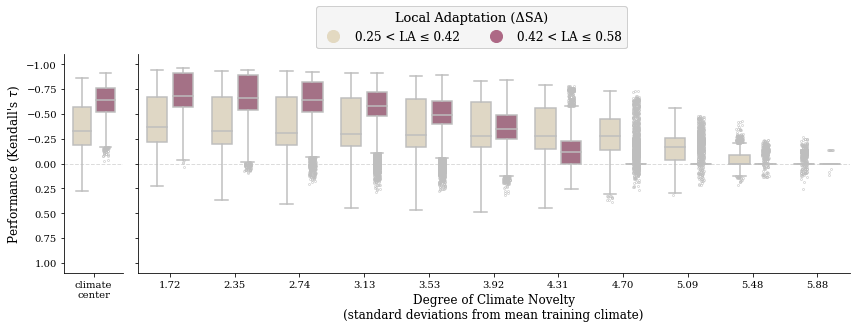

In [50]:
hue = 'final_la_bin'
generic_fig(hue=hue, hue_order=mvp.hue_order[hue], pdf=f'{figdir}/{hue}_all-block_no-RONA.pdf', remove_RONA=True,
            **mvp.boxplot_kwargs)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/final_la_bin_all-block_no-RONA_1-trait.pdf


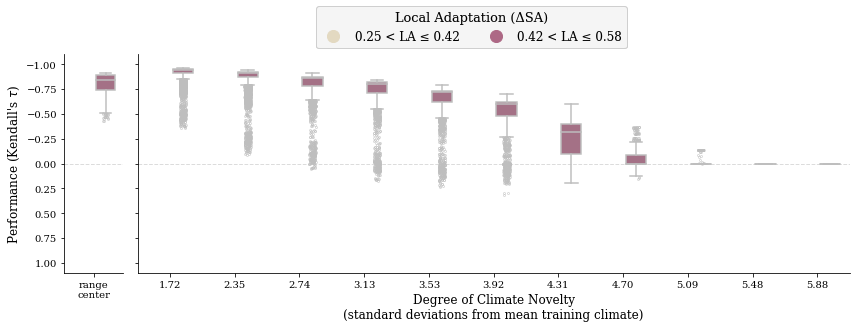

In [31]:
hue = 'final_la_bin'
generic_fig(hue=hue, hue_order=mvp.hue_order[hue], pdf=f'{figdir}/{hue}_all-block_no-RONA_1-trait.pdf',
            remove_RONA=True, ntraits='1-trait',
            **mvp.boxplot_kwargs)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/final_la_bin_all-block_no-RONA_na-filled_2-trait.pdf


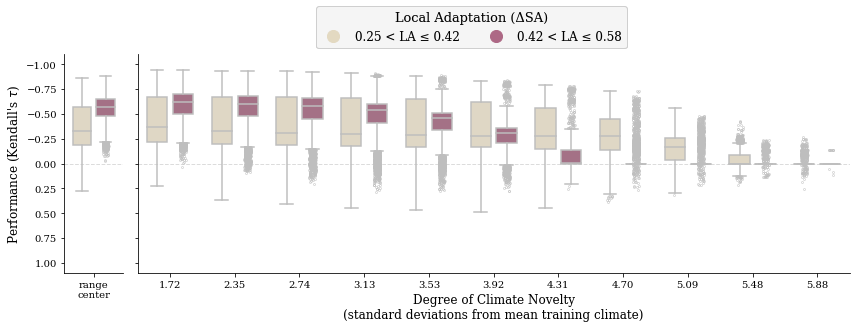

In [32]:
hue = 'final_la_bin'
generic_fig(hue=hue, hue_order=mvp.hue_order[hue], pdf=f'{figdir}/{hue}_all-block_no-RONA_na-filled_2-trait.pdf',
            remove_RONA=True, ntraits='2-trait',
            **mvp.boxplot_kwargs)

<a id='by_hue'></a>
### by simulation params

[top](#home)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/landscape_all-block.pdf


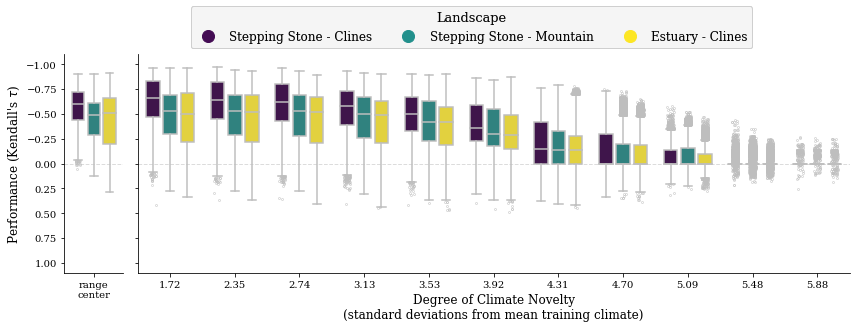

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/glevel_all-block.pdf


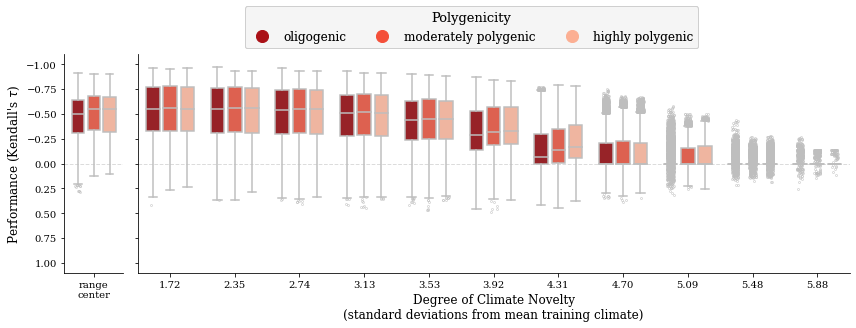

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/pleio_all-block.pdf


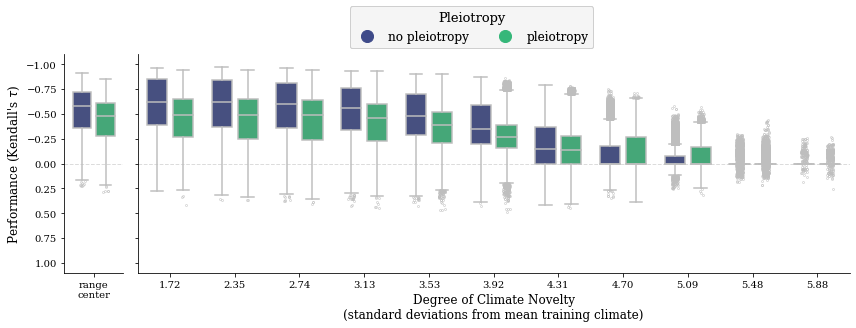

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/slevel_all-block.pdf


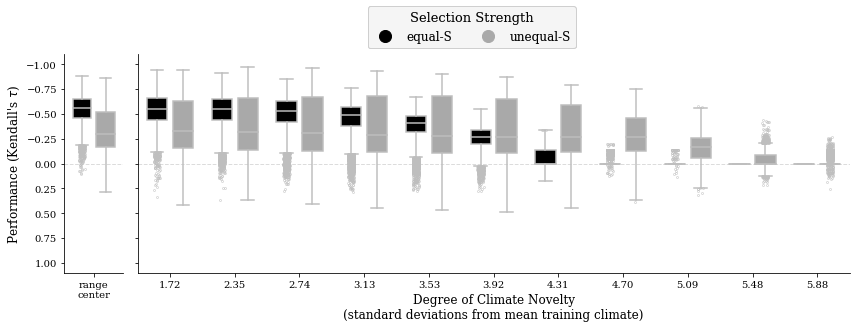

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/popsize_all-block.pdf


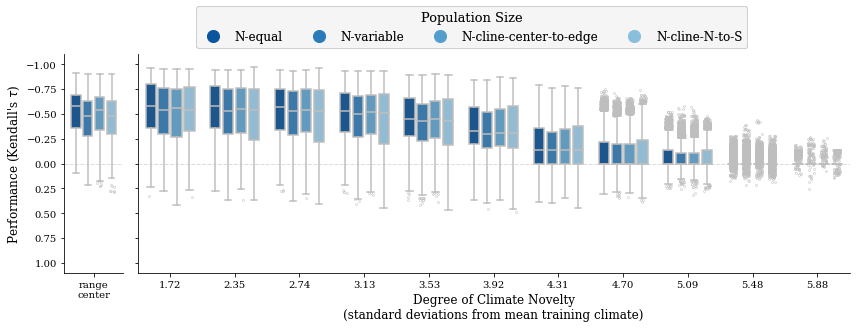

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/migration_all-block.pdf


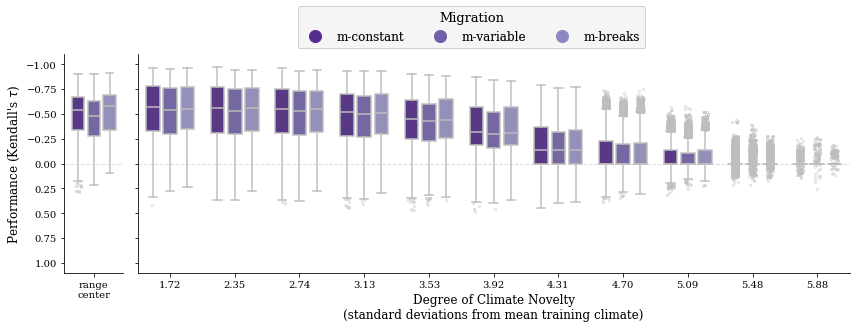

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/marker_set_all-block.pdf


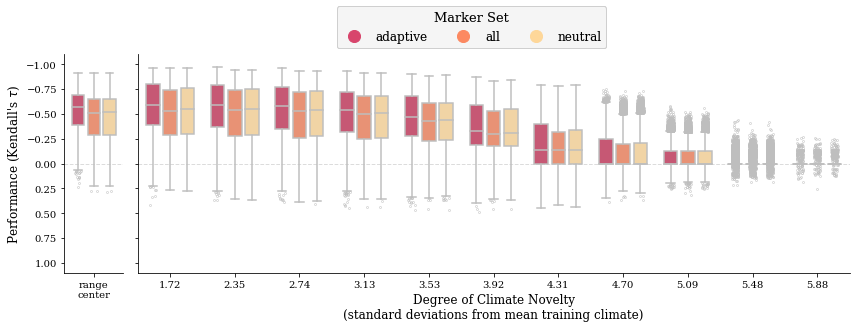

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/program_all-block.pdf


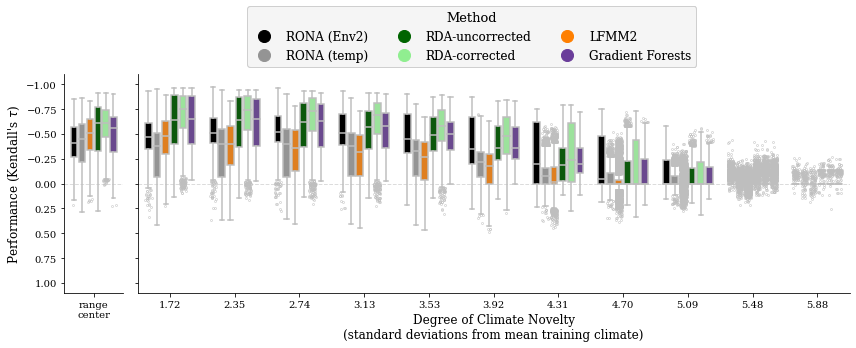

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/demography_all-block.pdf


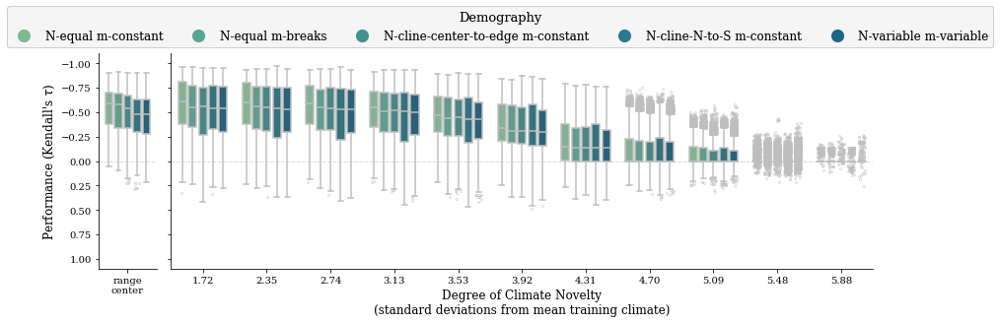

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/final_la_bin_all-block.pdf


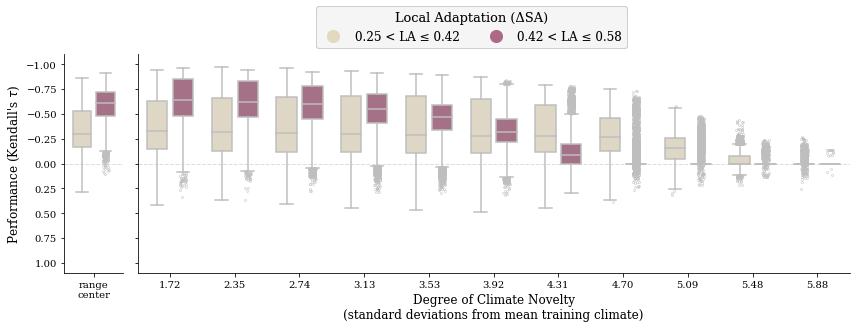

In [33]:
# 1- and 2-trait combined
for hue, horder in mvp.hue_order.items():
    if hue == 'noncausal_env':
        continue
        
    generic_fig(hue=hue, hue_order=horder, pdf=f'{figdir}/{hue}_all-block.pdf', **mvp.boxplot_kwargs)


Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/landscape_all-block_1-trait.pdf


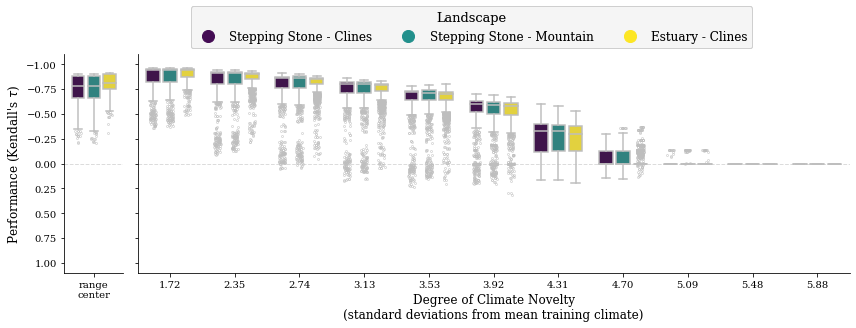

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/glevel_all-block_1-trait.pdf


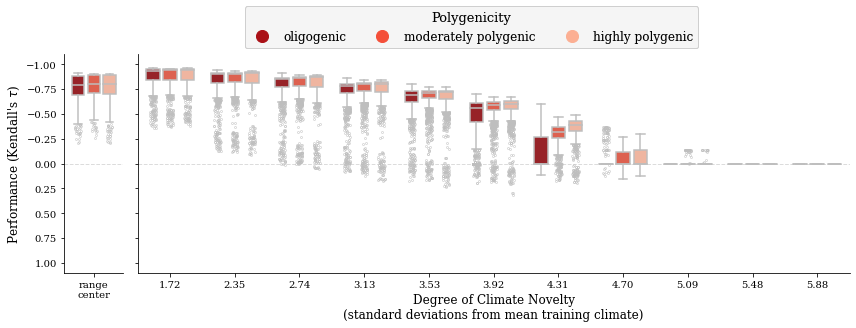

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/popsize_all-block_1-trait.pdf


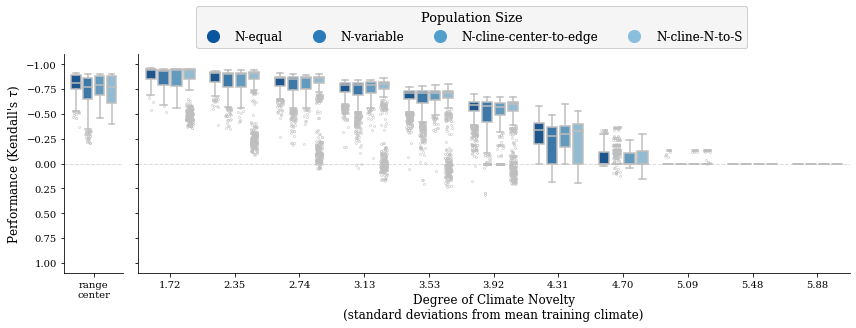

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/migration_all-block_1-trait.pdf


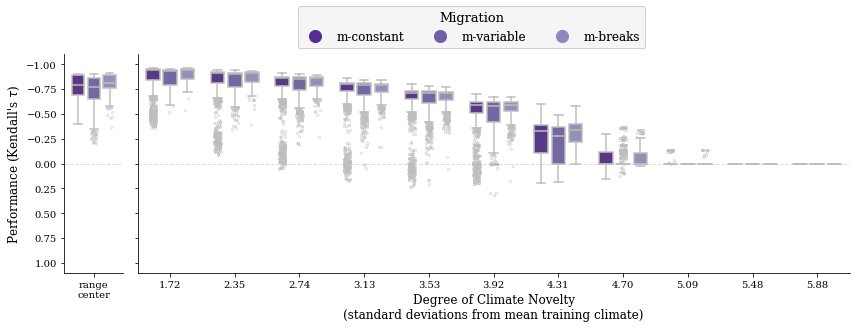

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/marker_set_all-block_1-trait.pdf


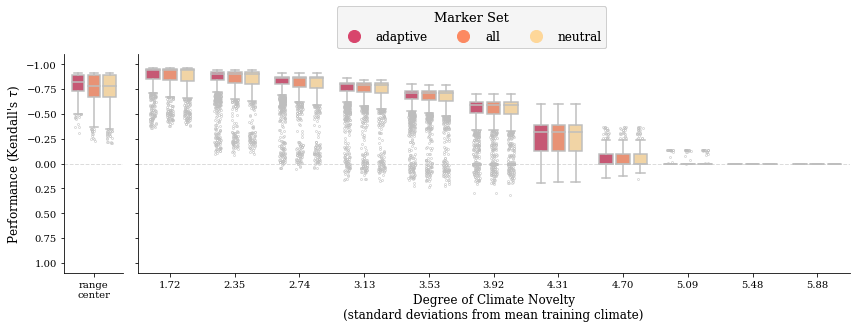

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/program_all-block_1-trait.pdf


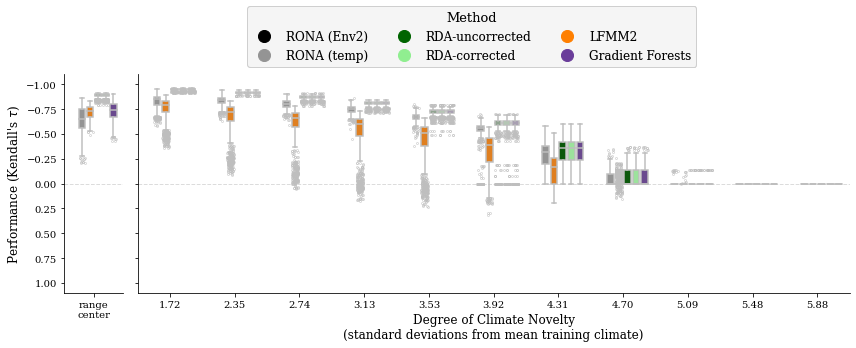

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/demography_all-block_1-trait.pdf


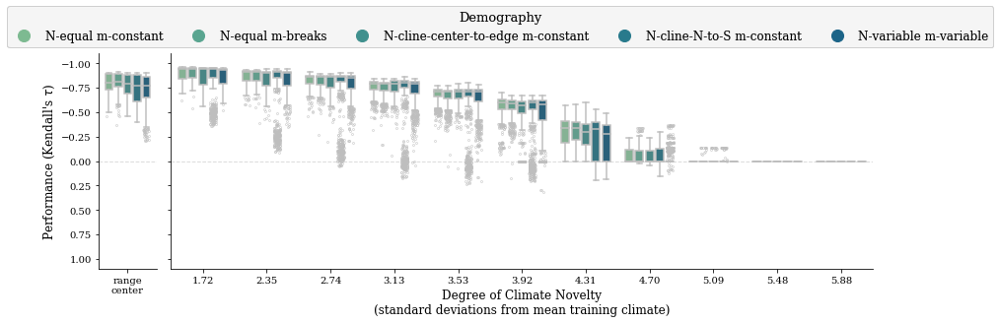

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/final_la_bin_all-block_1-trait.pdf


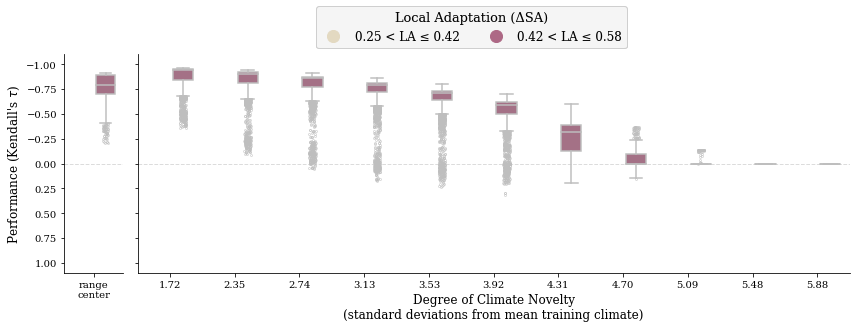

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/landscape_all-block_2-trait.pdf


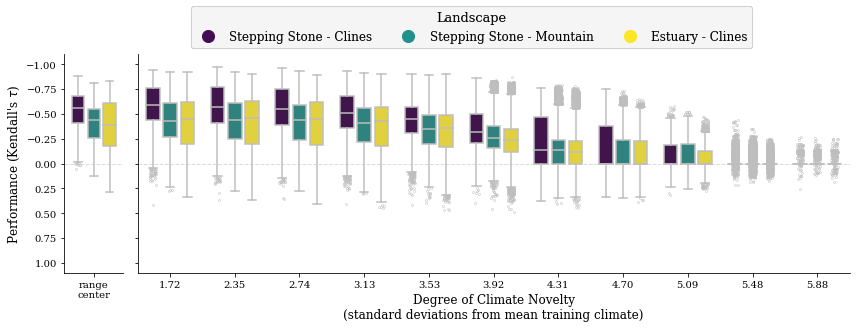

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/glevel_all-block_2-trait.pdf


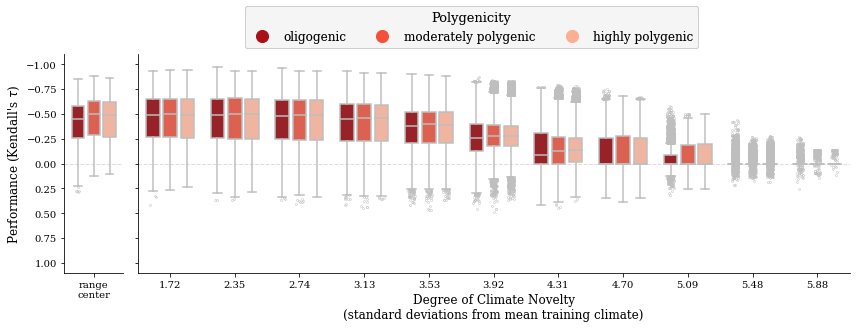

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/pleio_all-block_2-trait.pdf


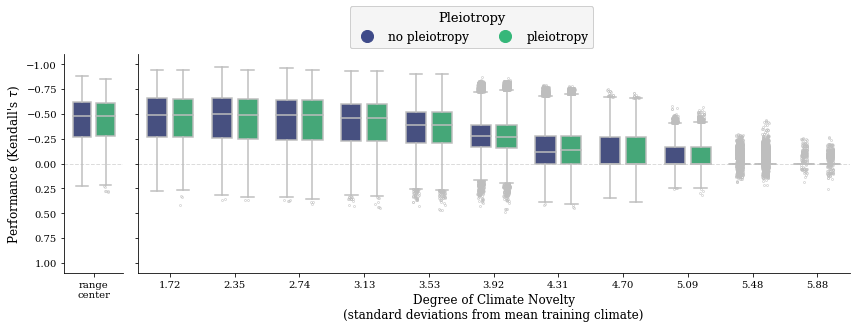

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/slevel_all-block_2-trait.pdf


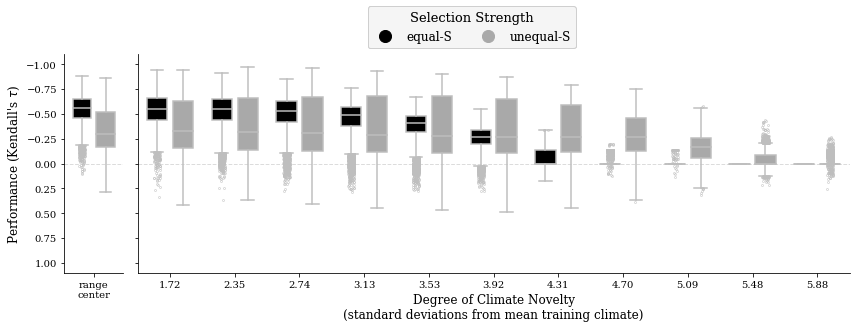

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/popsize_all-block_2-trait.pdf


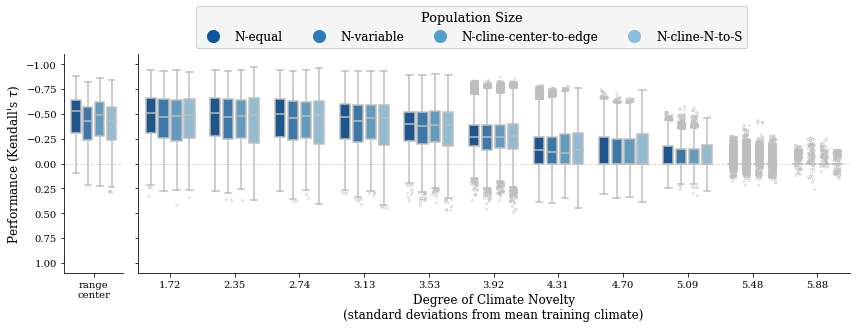

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/migration_all-block_2-trait.pdf


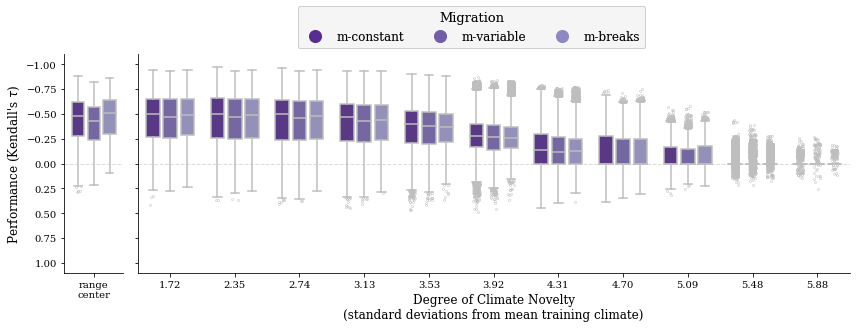

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/marker_set_all-block_2-trait.pdf


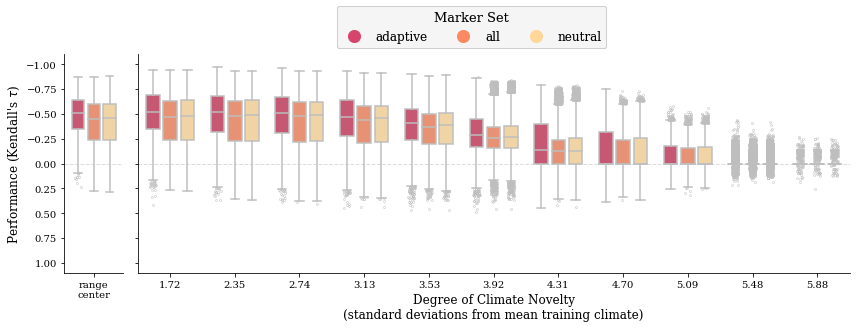

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/program_all-block_2-trait.pdf


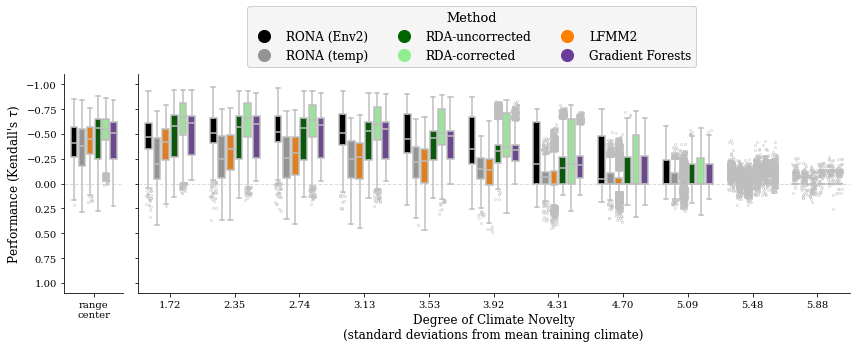

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/demography_all-block_2-trait.pdf


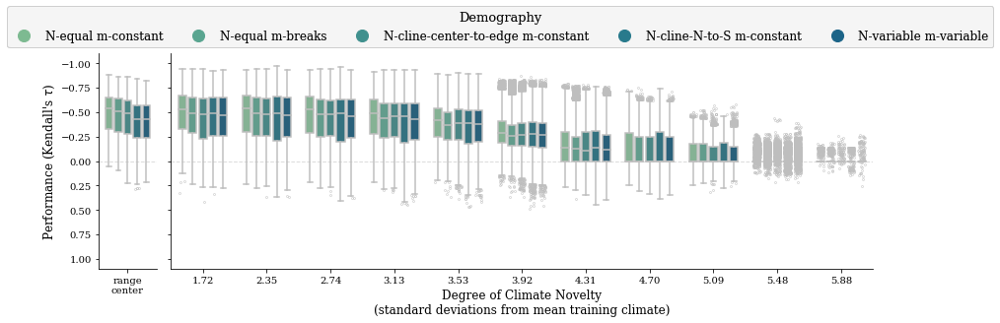

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/final_la_bin_all-block_2-trait.pdf


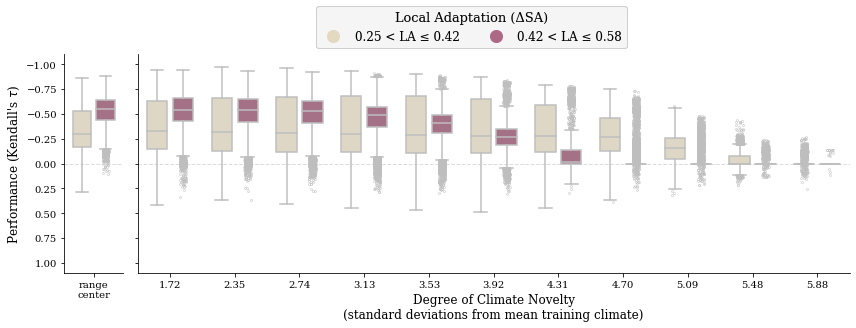

In [34]:
for ntraits in ['1-trait', '2-trait']:
    
    for hue, horder in mvp.hue_order.items():
        if hue == 'noncausal_env':
            continue
            
        if ntraits == '1-trait' and hue in ['slevel', 'pleio']:
            continue

        generic_fig(hue=hue, hue_order=horder, pdf=f'{figdir}/{hue}_all-block_{ntraits}.pdf',
                    ntraits=ntraits, **mvp.boxplot_kwargs)


<a id='by_prog'></a>
### separate programs

[top](#home)

In [35]:
box_kwargs = mvp.boxplot_kwargs.copy()
_ = box_kwargs.pop('palette')

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_all-block.pdf


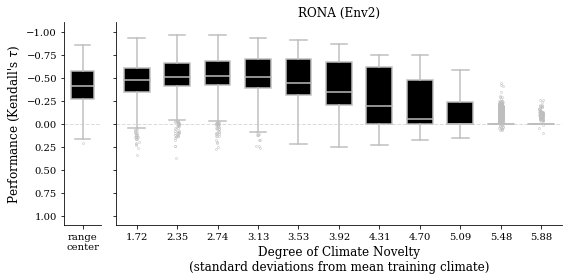

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_all-block.pdf


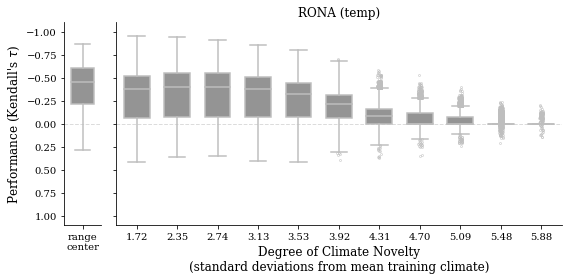

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_all-block.pdf


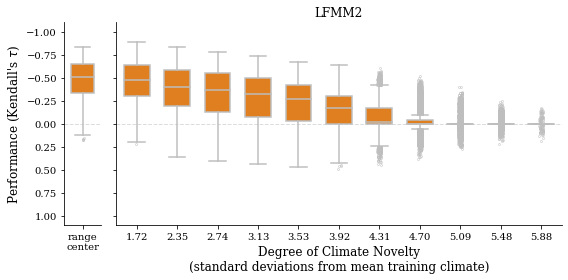

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_all-block.pdf


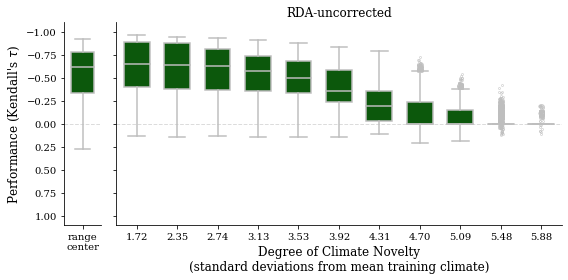

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_all-block.pdf


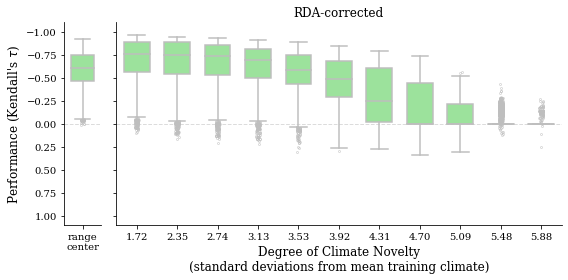

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_all-block.pdf


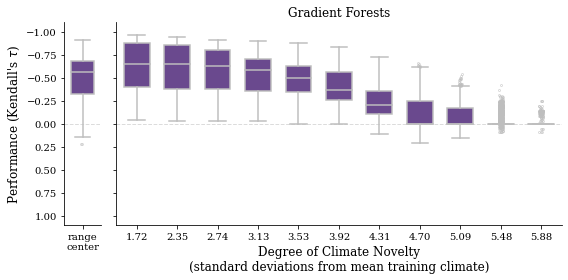

In [36]:
# 1- and 2-trait combined
for program in mvp.hue_order['program']:
    
    generic_fig(program=program,
                color=mvp.boxplot_kwargs['palette'][program],
                pdf=f'{figdir}/{program}_all-block.pdf',
                figsize=(8, 4),
                **box_kwargs
               )

### by hue for each program

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_landscape_all-block.pdf


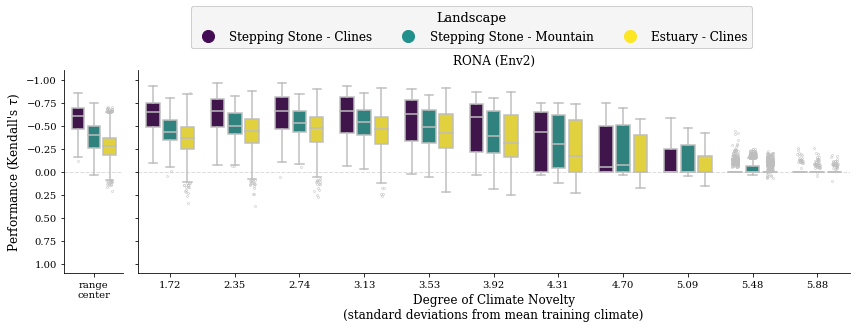

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_landscape_all-block.pdf


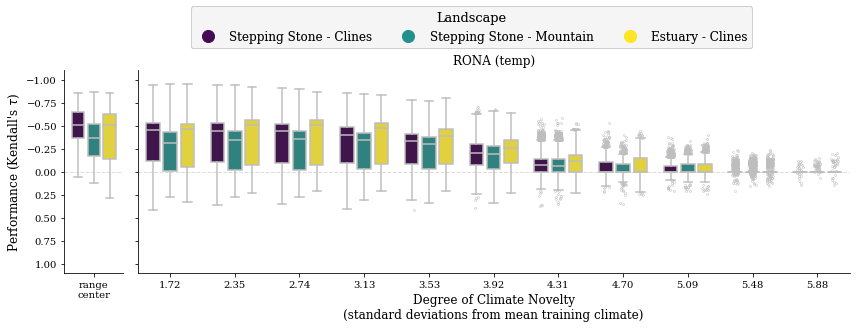

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_landscape_all-block.pdf


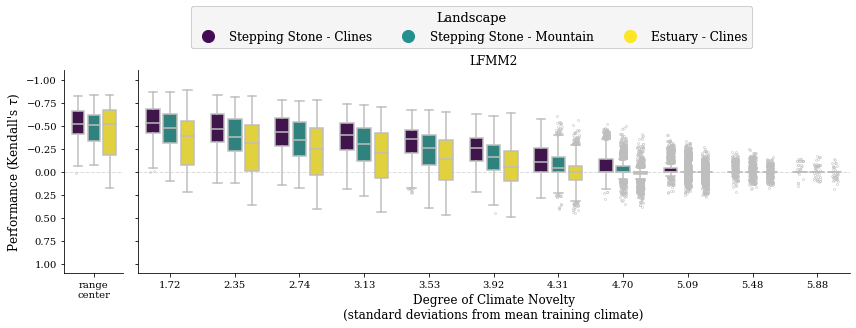

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_landscape_all-block.pdf


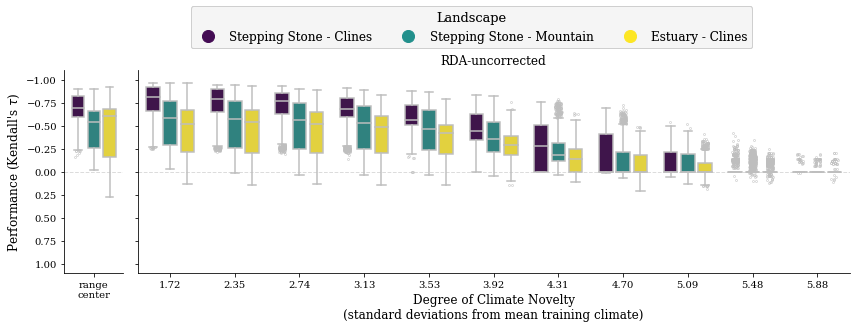

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_landscape_all-block.pdf


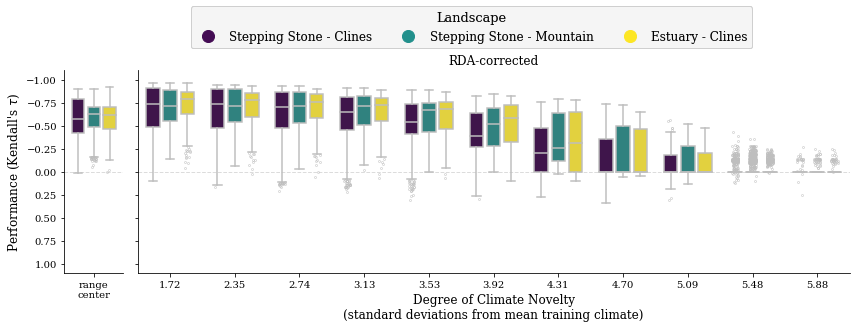

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_landscape_all-block.pdf


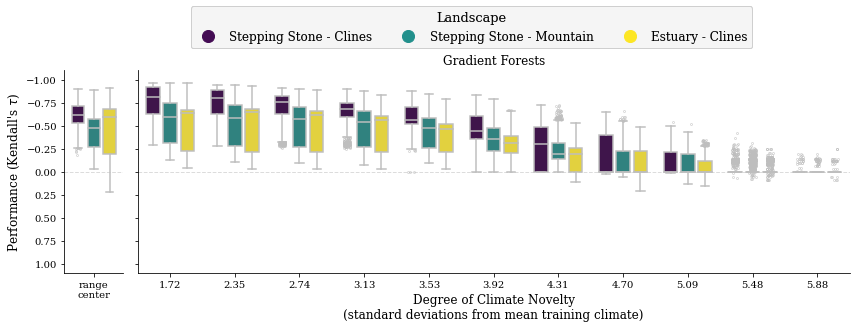

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_glevel_all-block.pdf


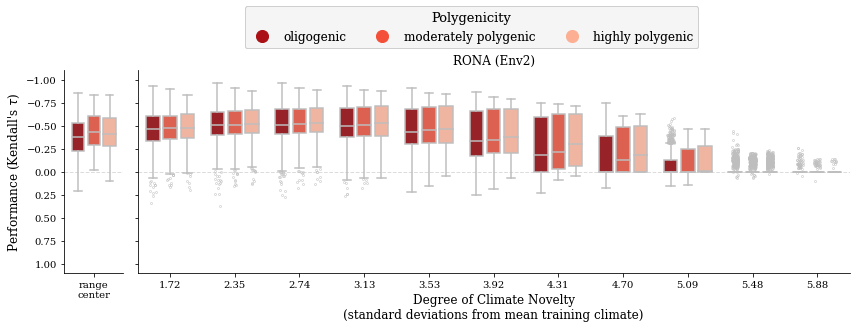

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_glevel_all-block.pdf


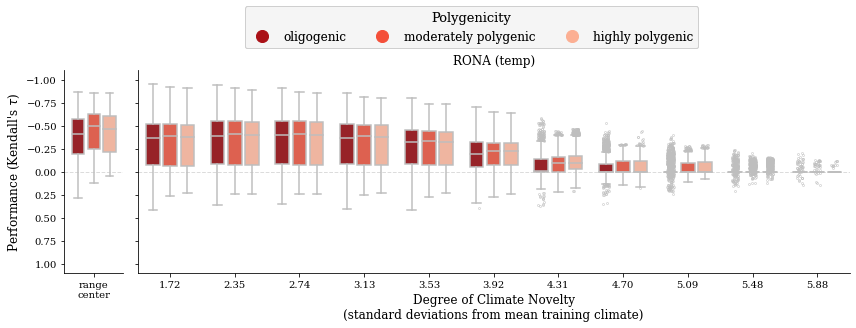

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_glevel_all-block.pdf


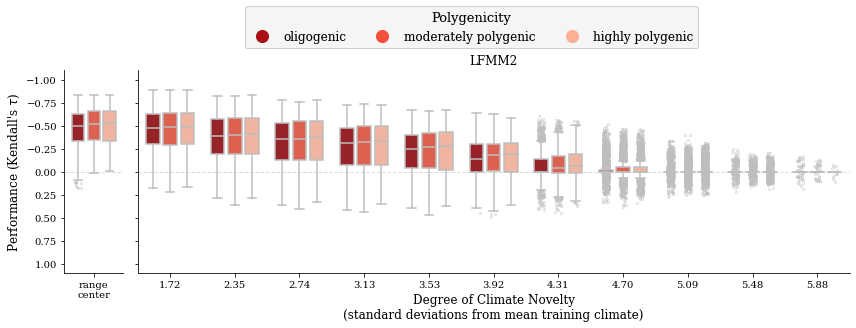

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_glevel_all-block.pdf


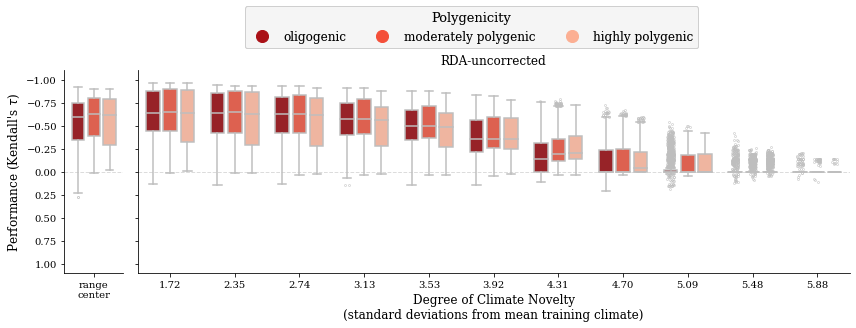

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_glevel_all-block.pdf


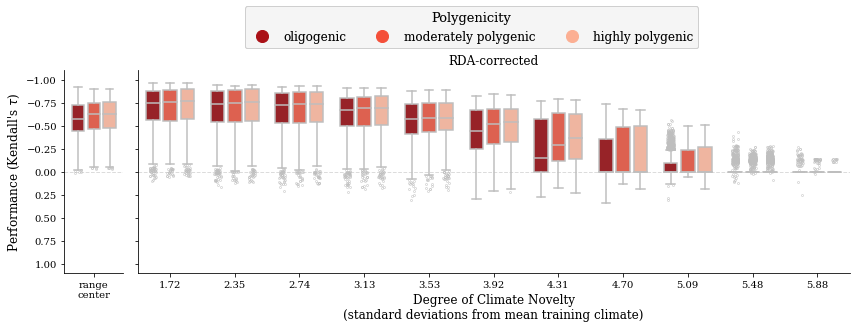

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_glevel_all-block.pdf


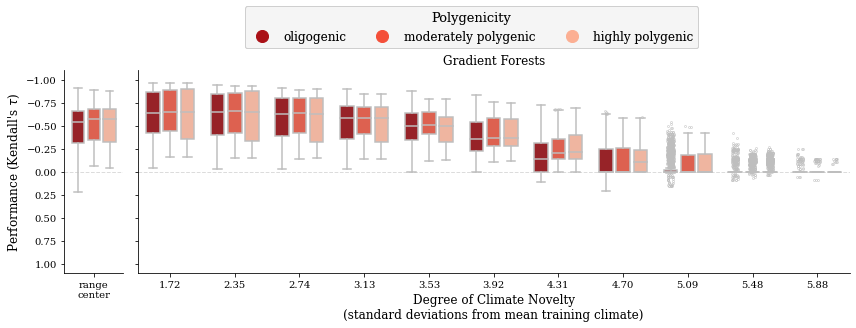

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_pleio_all-block.pdf


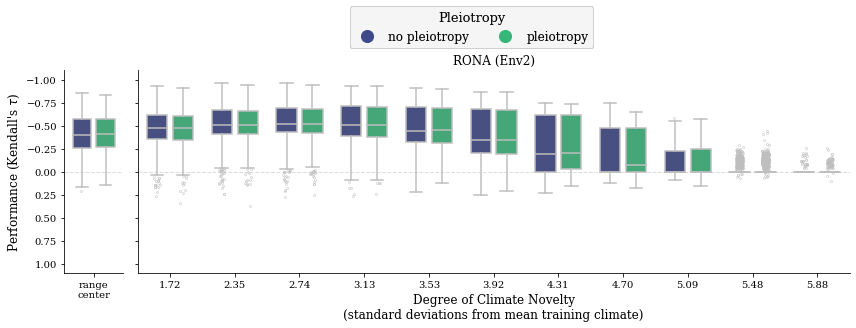

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_pleio_all-block.pdf


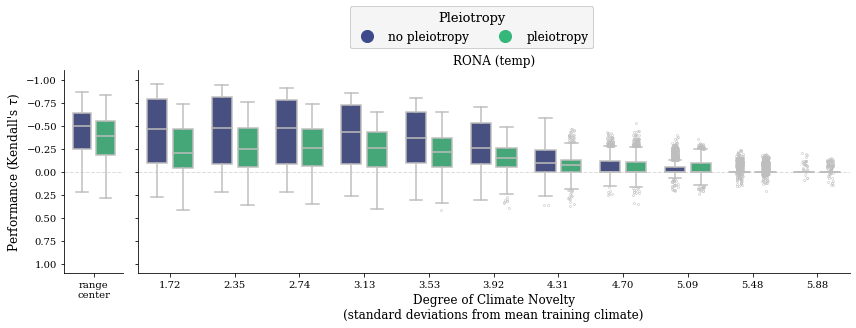

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_pleio_all-block.pdf


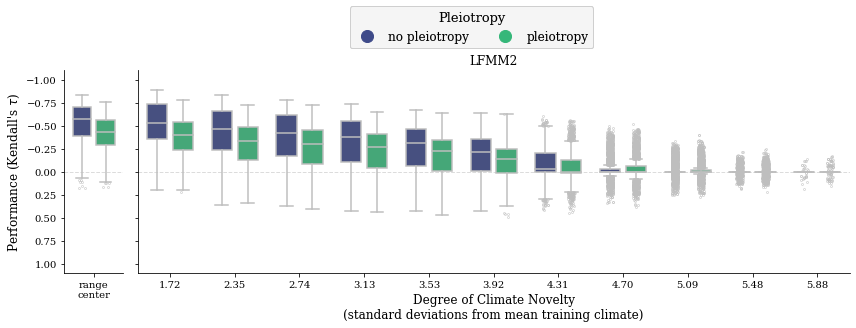

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_pleio_all-block.pdf


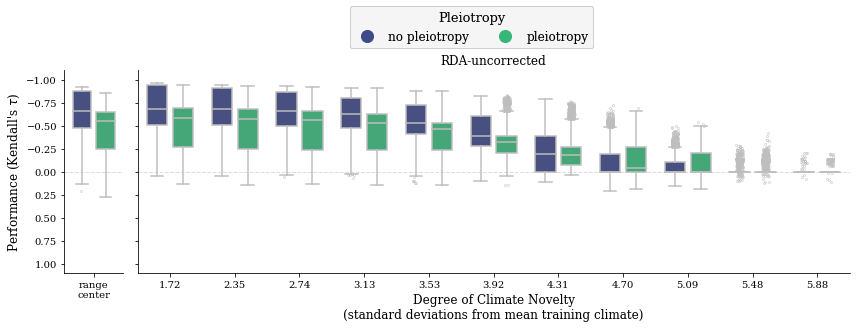

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_pleio_all-block.pdf


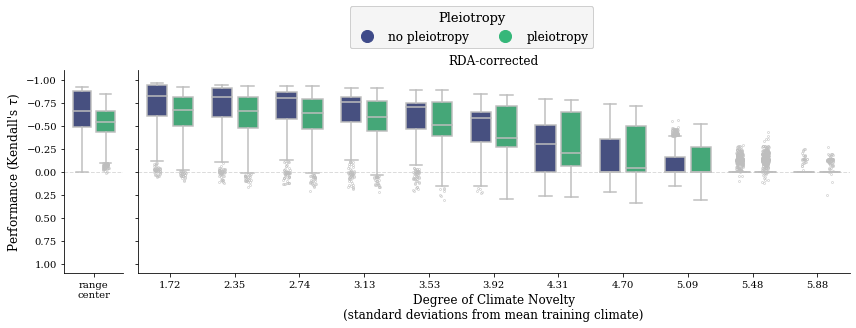

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_pleio_all-block.pdf


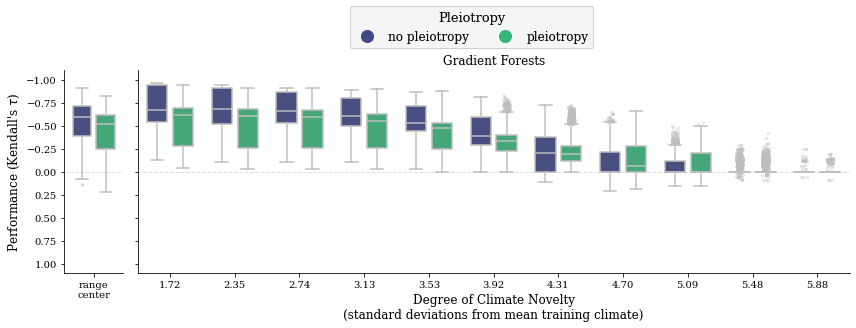

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_slevel_all-block.pdf


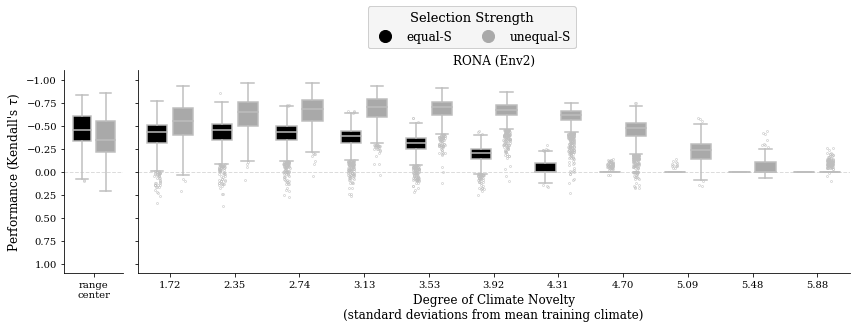

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_slevel_all-block.pdf


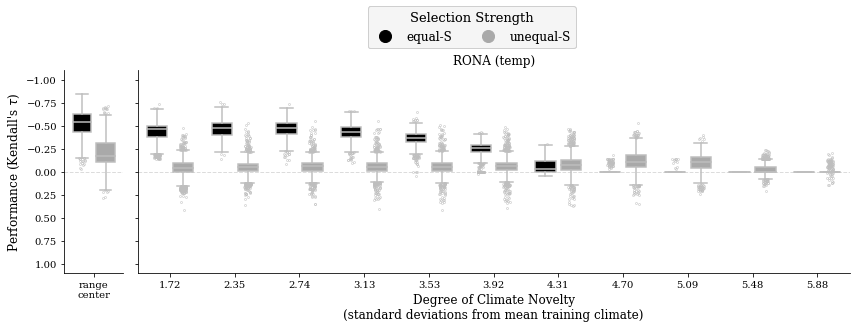

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_slevel_all-block.pdf


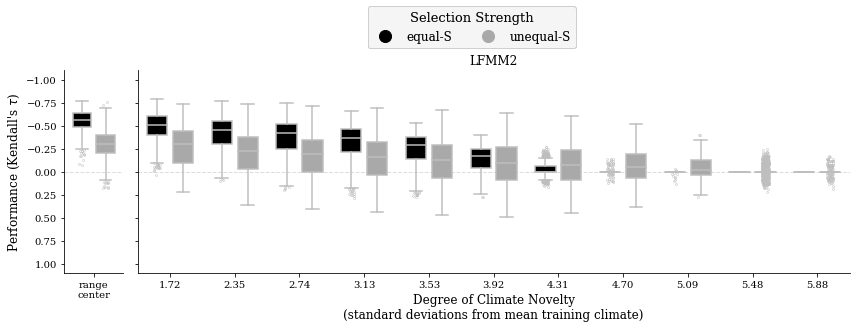

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_slevel_all-block.pdf


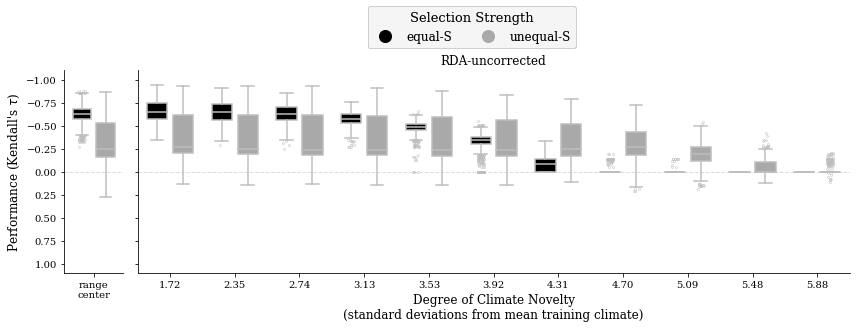

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_slevel_all-block.pdf


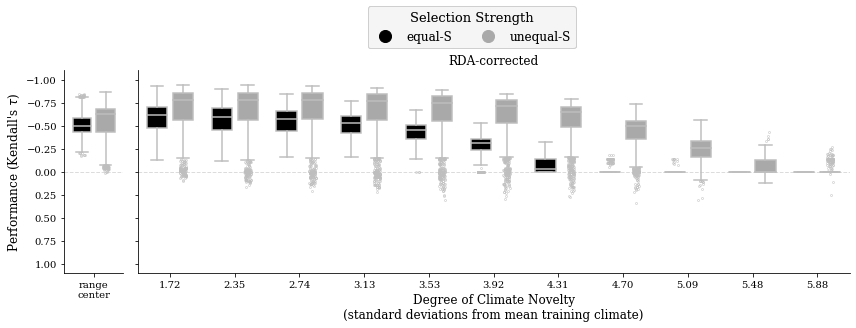

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_slevel_all-block.pdf


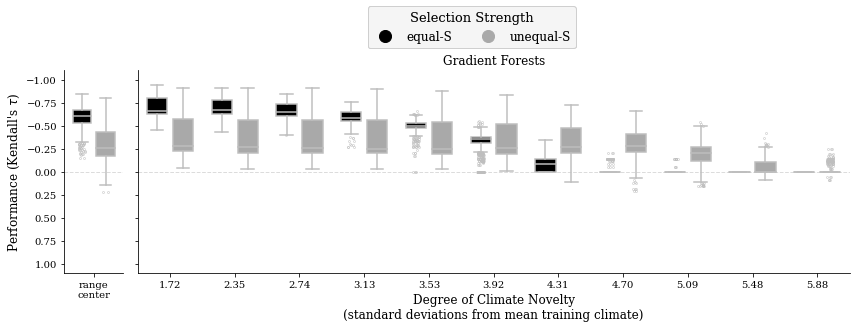

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_popsize_all-block.pdf


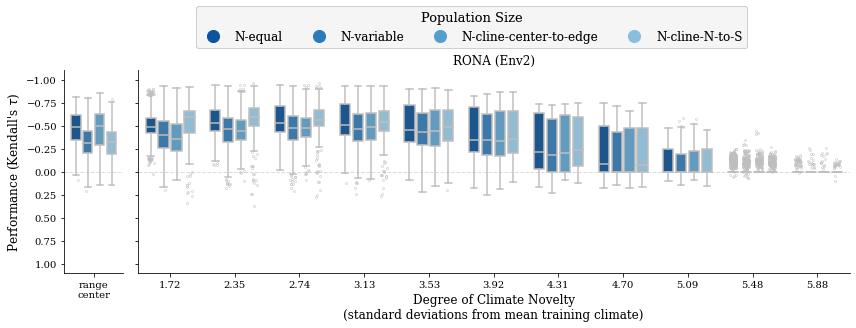

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_popsize_all-block.pdf


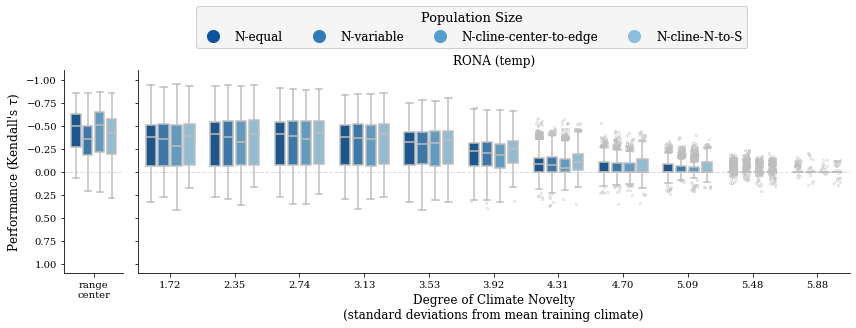

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_popsize_all-block.pdf


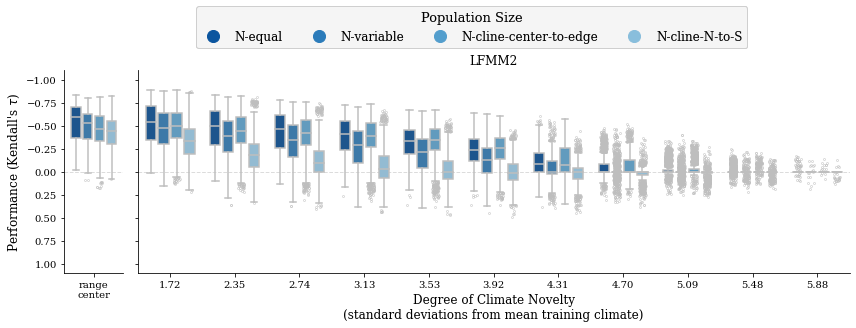

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_popsize_all-block.pdf


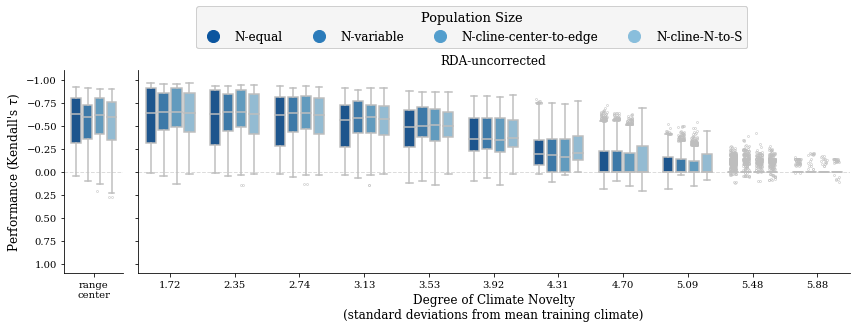

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_popsize_all-block.pdf


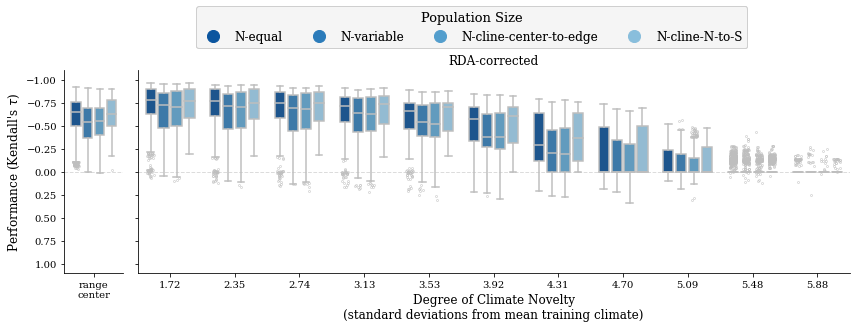

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_popsize_all-block.pdf


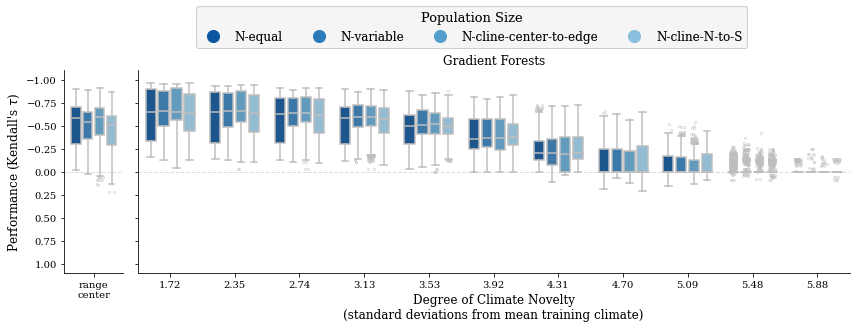

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_migration_all-block.pdf


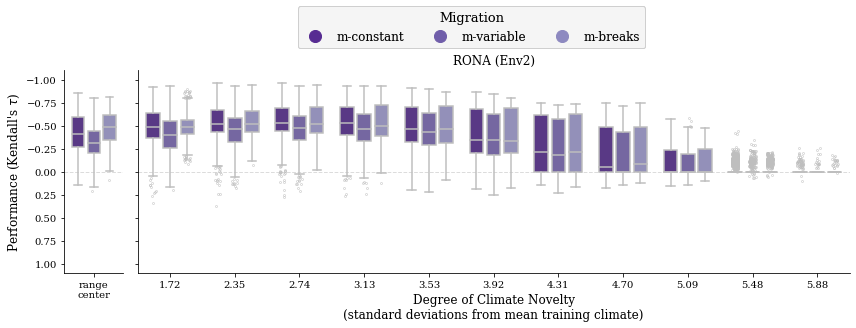

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_migration_all-block.pdf


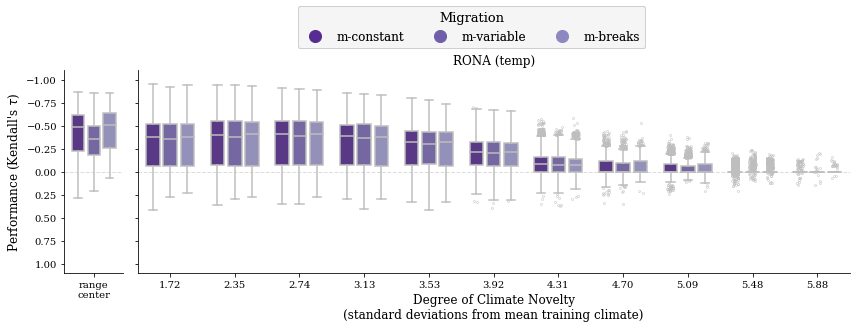

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_migration_all-block.pdf


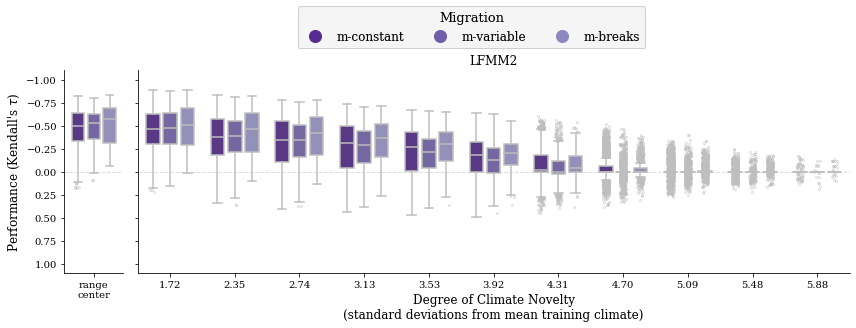

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_migration_all-block.pdf


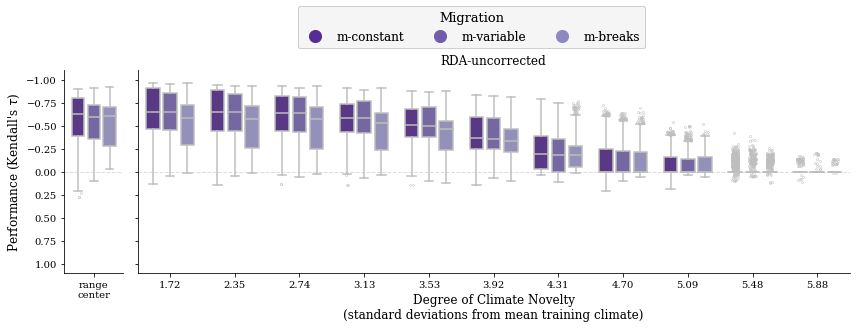

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_migration_all-block.pdf


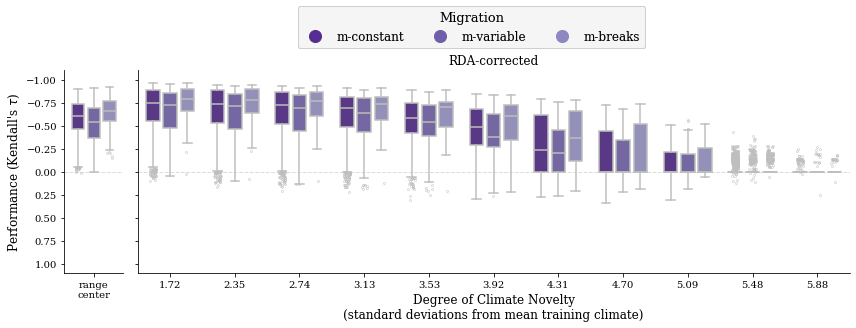

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_migration_all-block.pdf


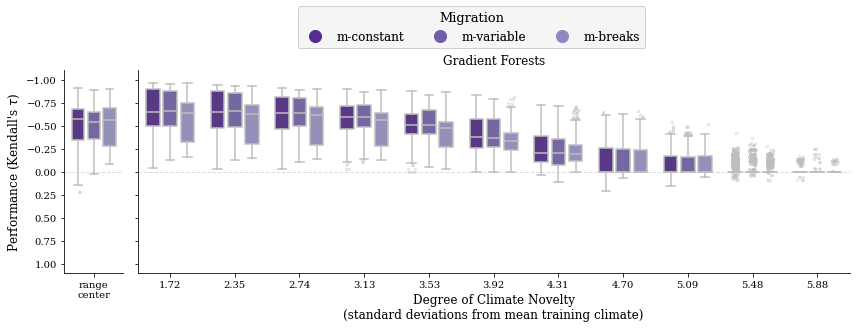

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_marker_set_all-block.pdf


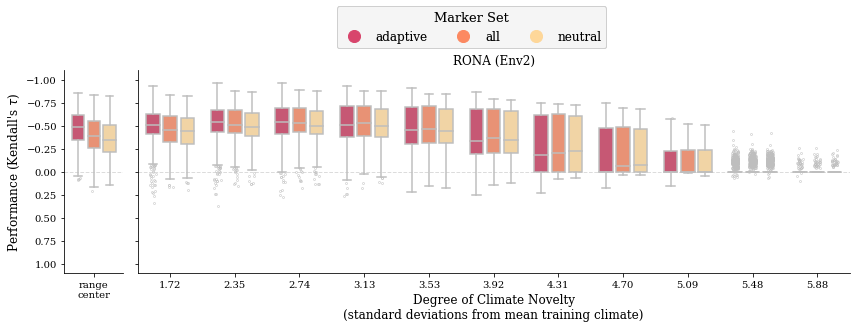

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_marker_set_all-block.pdf


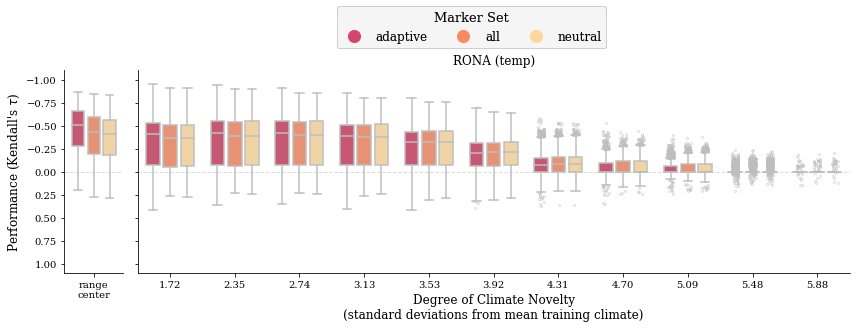

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_marker_set_all-block.pdf


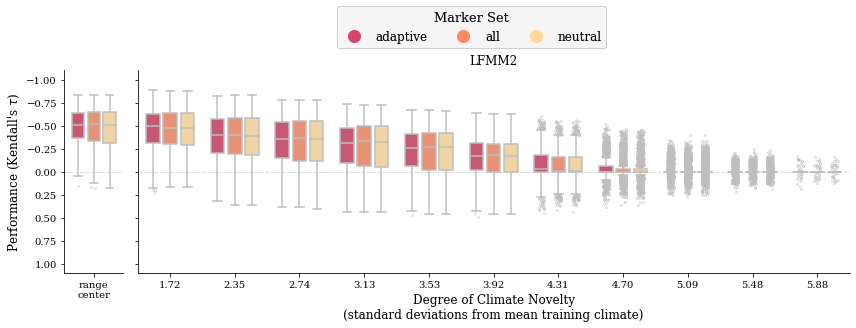

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_marker_set_all-block.pdf


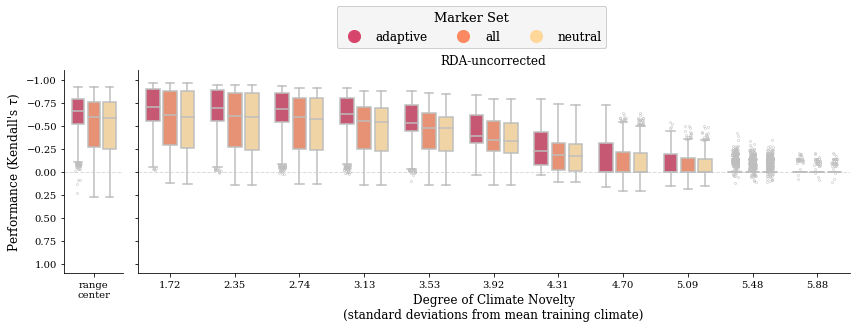

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_marker_set_all-block.pdf


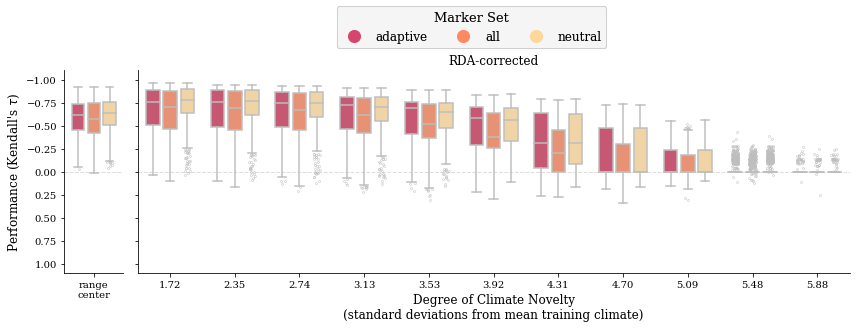

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_marker_set_all-block.pdf


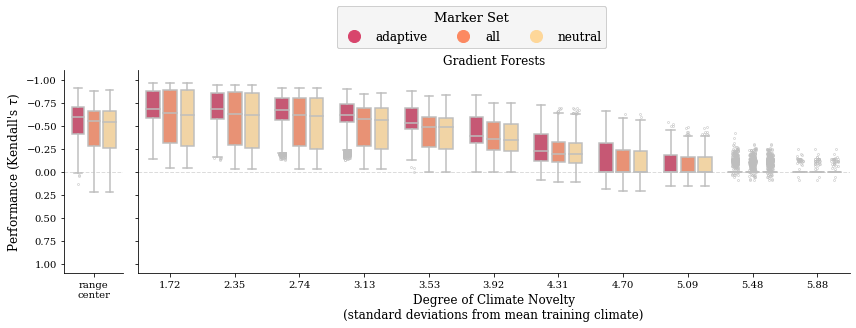

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_demography_all-block.pdf


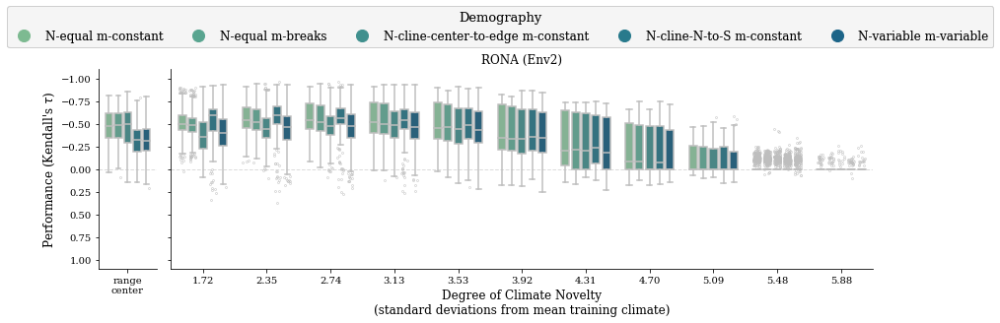

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_demography_all-block.pdf


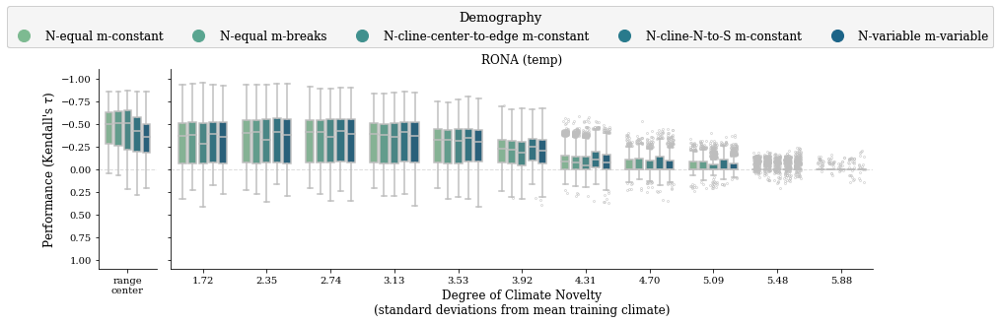

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_demography_all-block.pdf


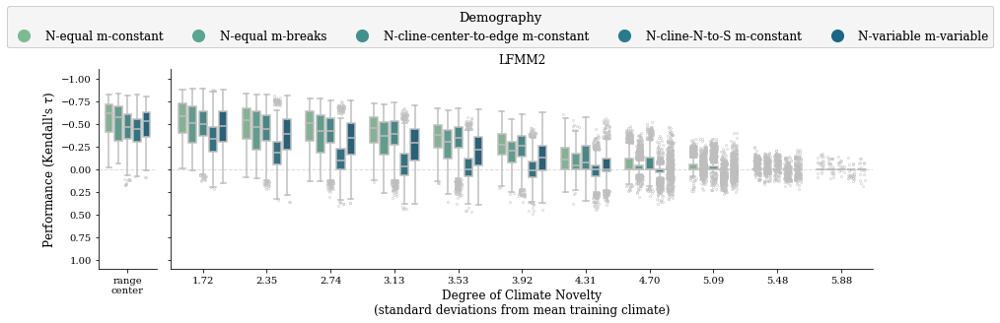

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_demography_all-block.pdf


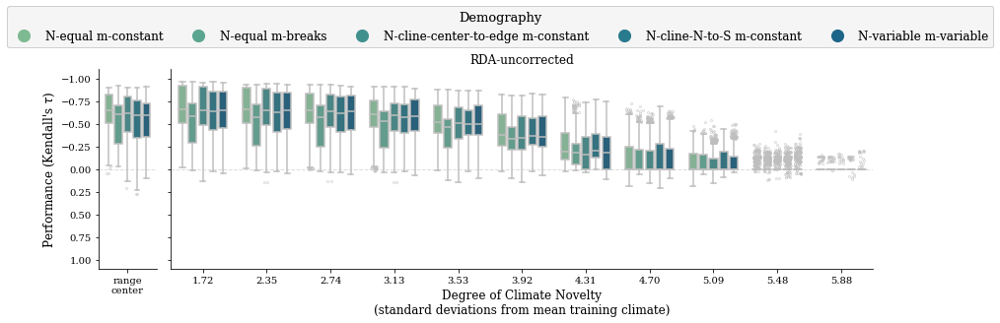

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_demography_all-block.pdf


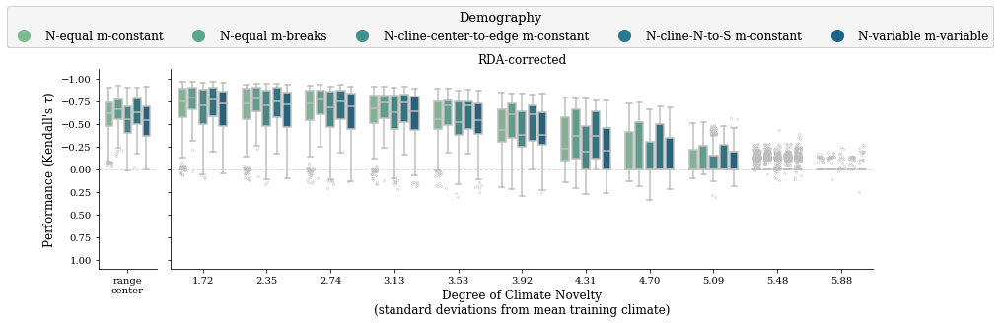

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_demography_all-block.pdf


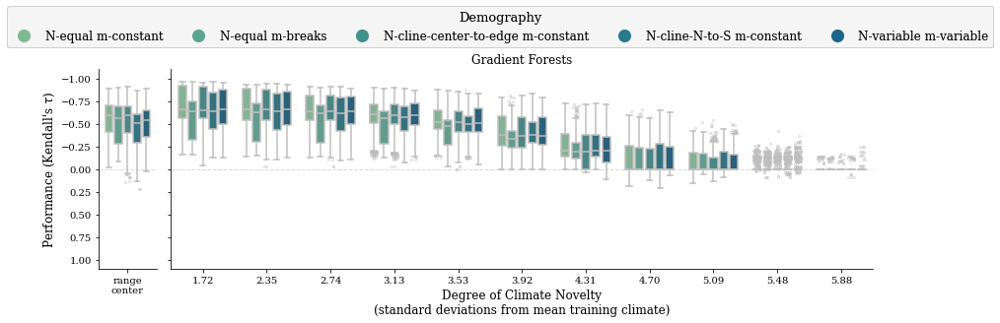

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_final_la_bin_all-block.pdf


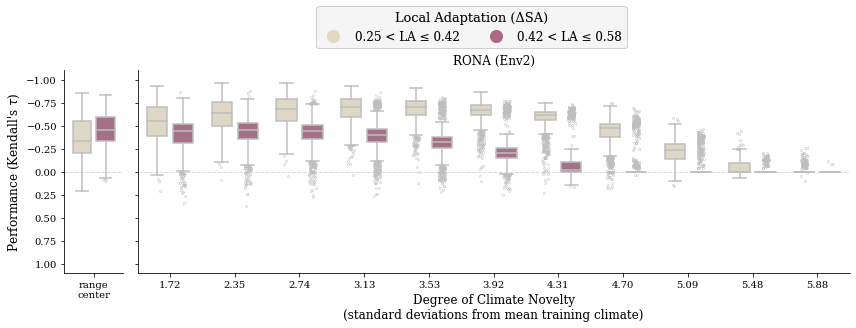

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_final_la_bin_all-block.pdf


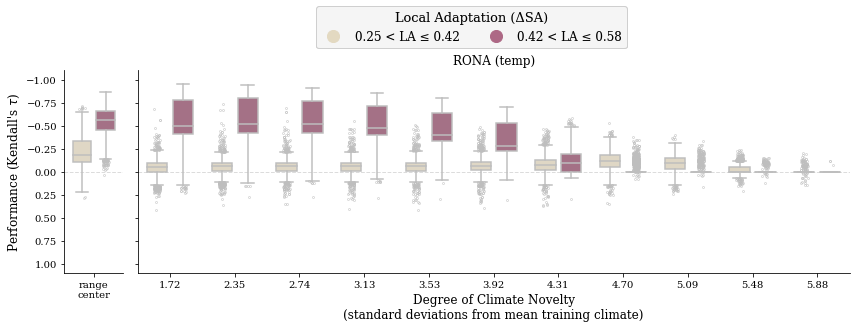

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_final_la_bin_all-block.pdf


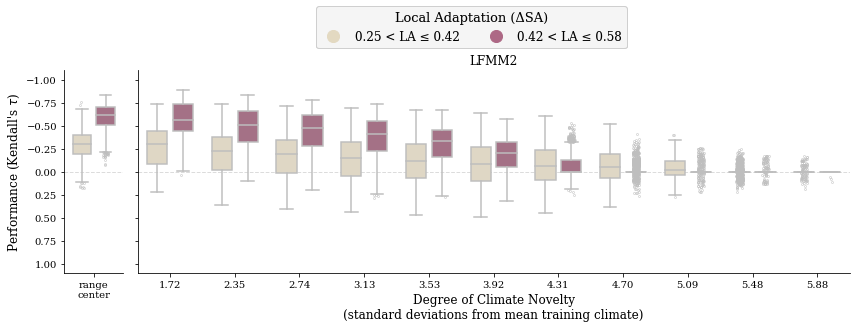

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_final_la_bin_all-block.pdf


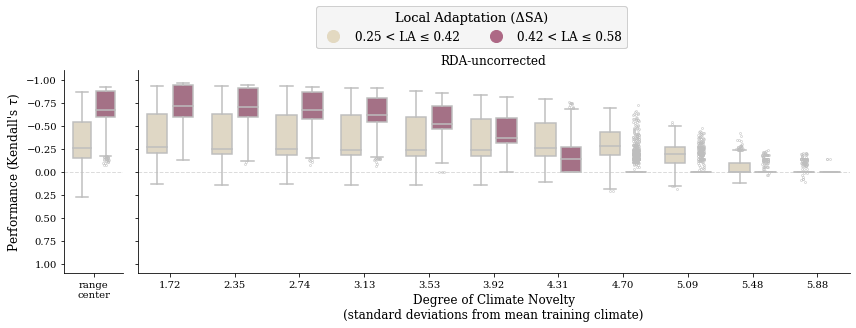

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_final_la_bin_all-block.pdf


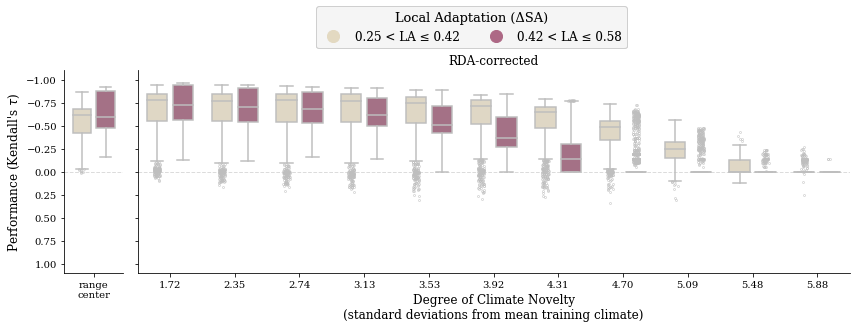

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_final_la_bin_all-block.pdf


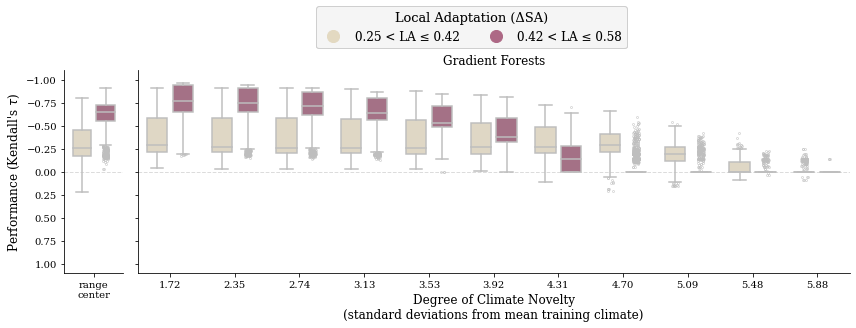

In [37]:
for hue, hue_order in mvp.hue_order.items():
    if hue in ['program', 'noncausal_env']:
        continue
        
    for program in mvp.hue_order['program']:
        
        generic_fig(hue=hue,
                    hue_order=hue_order,
                    program=program,
                    pdf=f'{figdir}/{program}_by_{hue}_all-block.pdf',
                    **mvp.boxplot_kwargs
                   )

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_landscape_all-block_1-trait.pdf


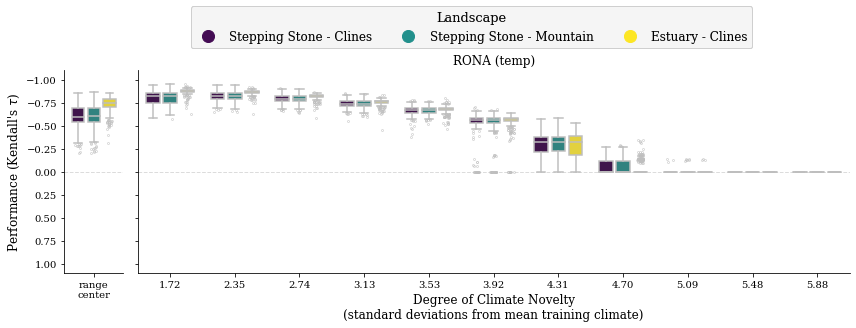

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_landscape_all-block_1-trait.pdf


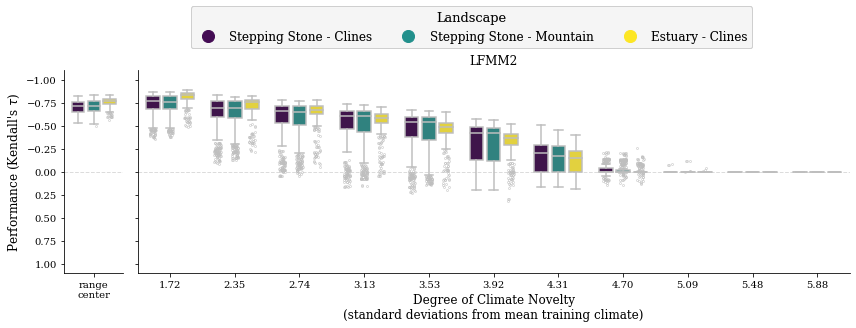

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_landscape_all-block_1-trait.pdf


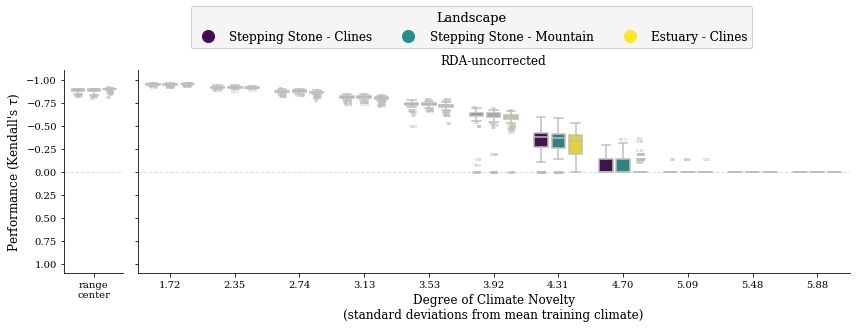

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_landscape_all-block_1-trait.pdf


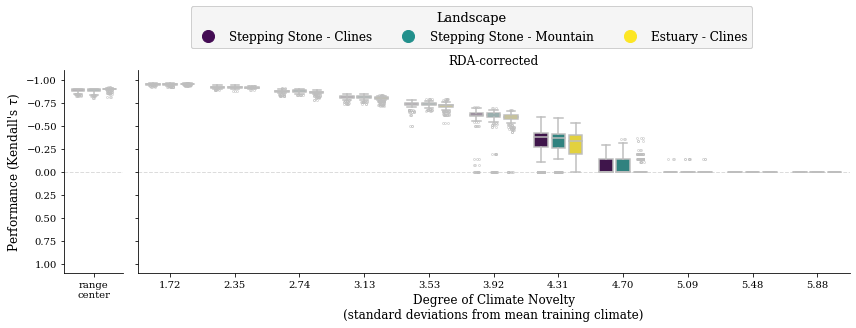

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_landscape_all-block_1-trait.pdf


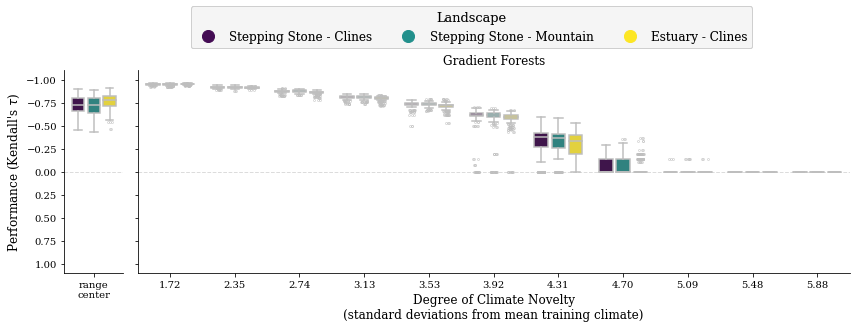

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_glevel_all-block_1-trait.pdf


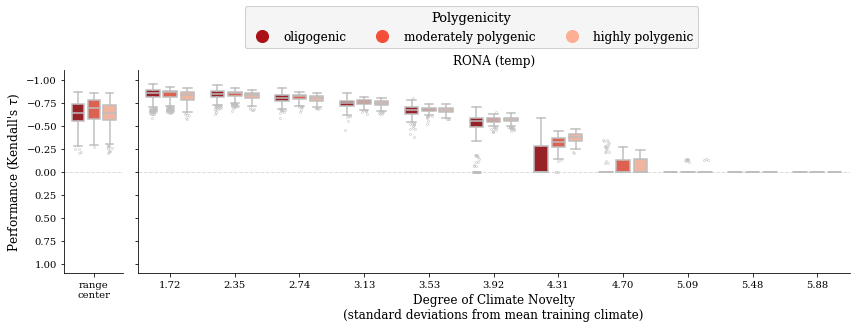

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_glevel_all-block_1-trait.pdf


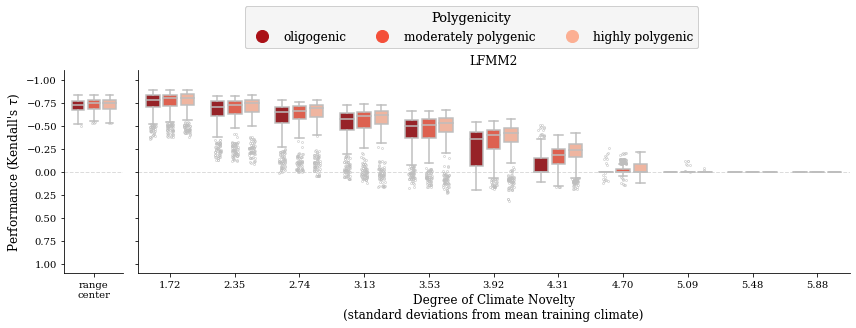

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_glevel_all-block_1-trait.pdf


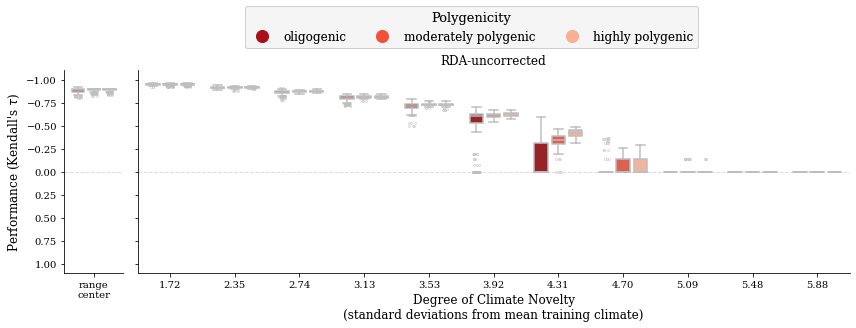

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_glevel_all-block_1-trait.pdf


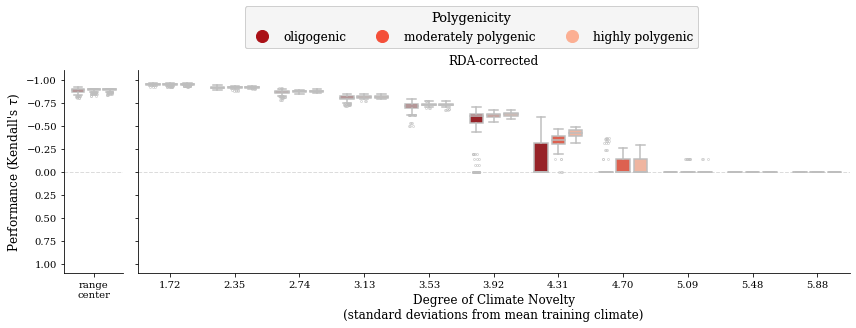

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_glevel_all-block_1-trait.pdf


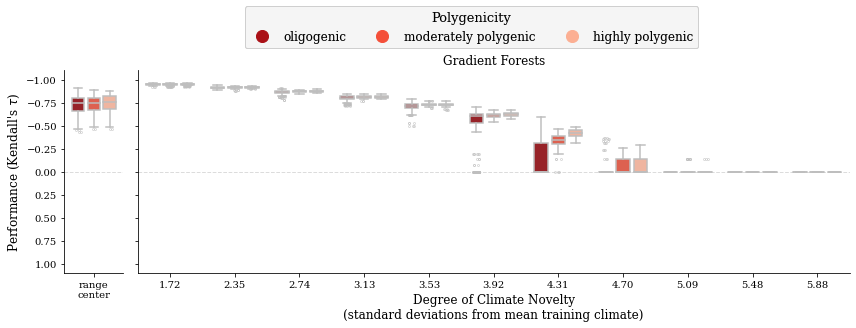

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_popsize_all-block_1-trait.pdf


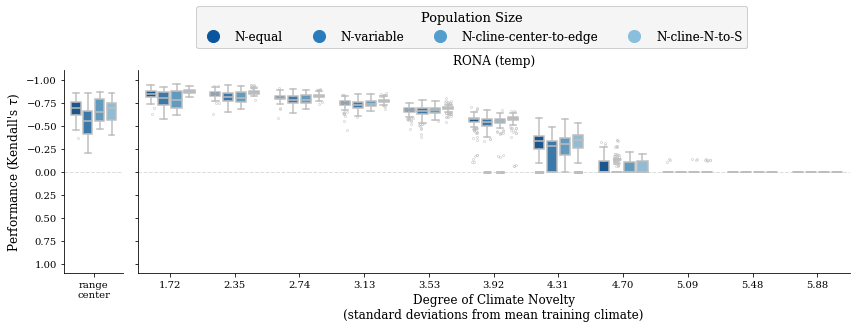

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_popsize_all-block_1-trait.pdf


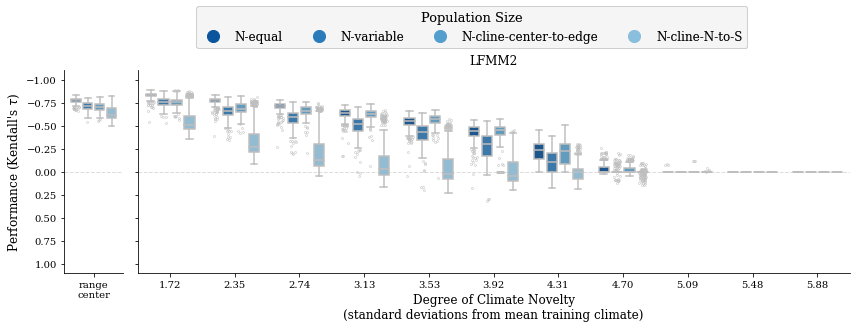

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_popsize_all-block_1-trait.pdf


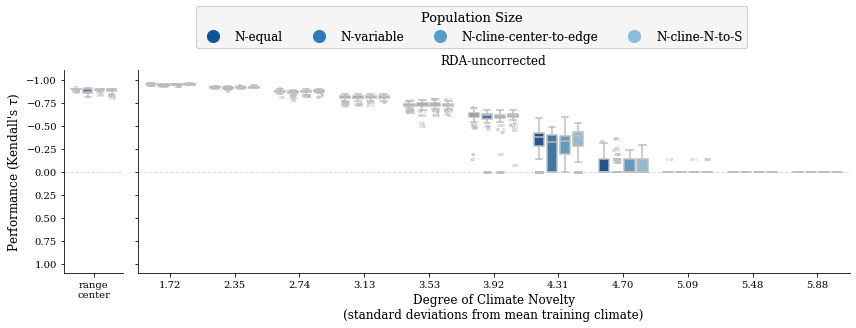

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_popsize_all-block_1-trait.pdf


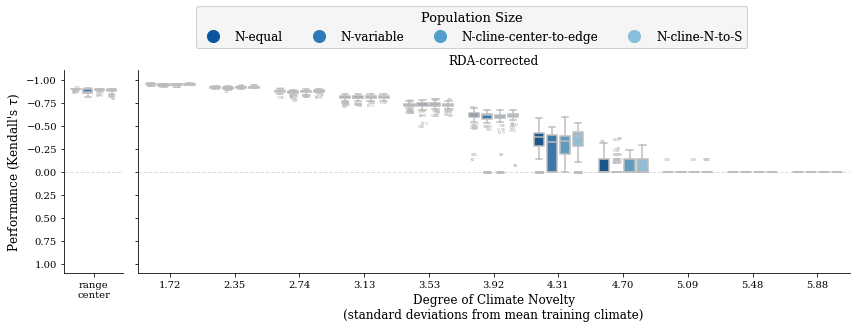

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_popsize_all-block_1-trait.pdf


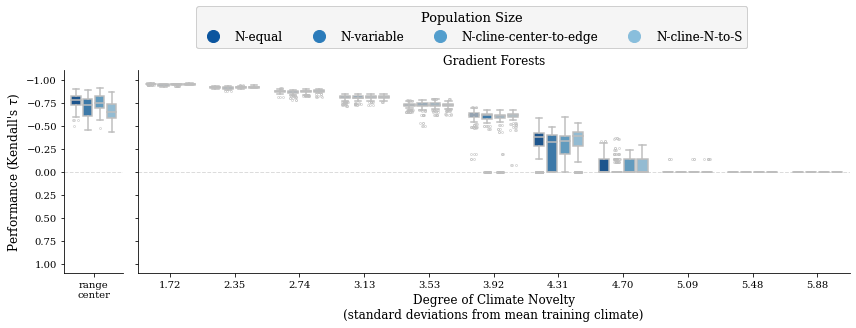

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_migration_all-block_1-trait.pdf


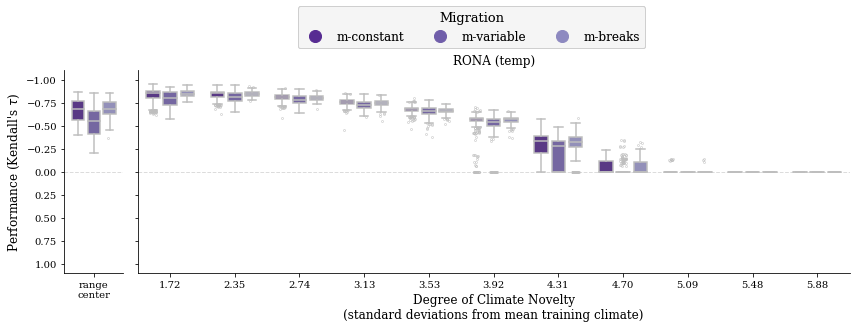

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_migration_all-block_1-trait.pdf


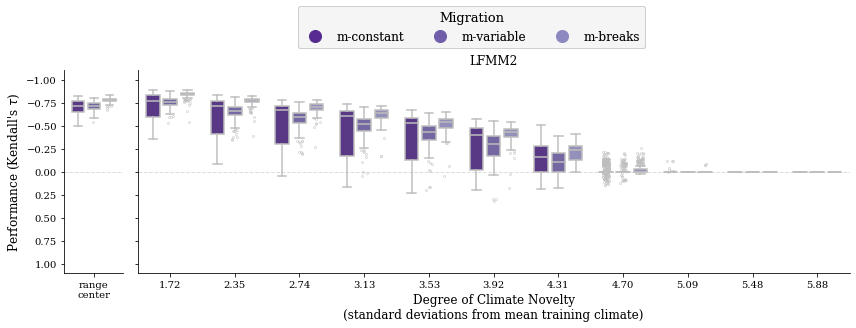

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_migration_all-block_1-trait.pdf


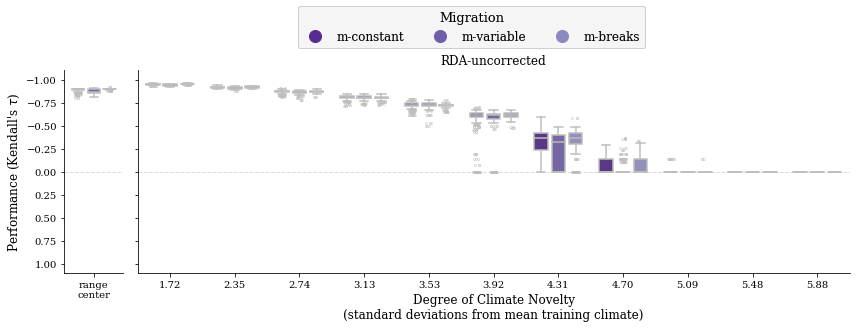

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_migration_all-block_1-trait.pdf


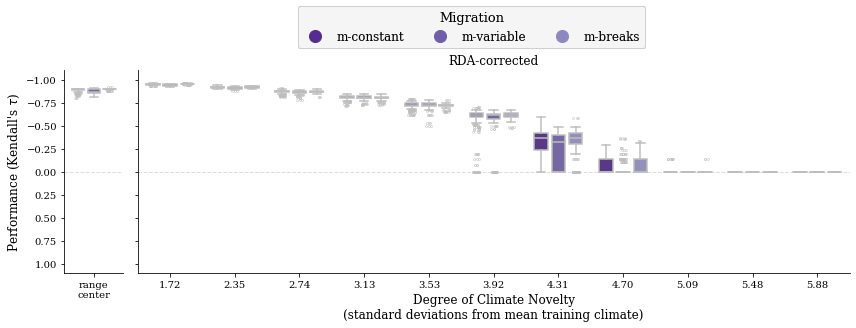

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_migration_all-block_1-trait.pdf


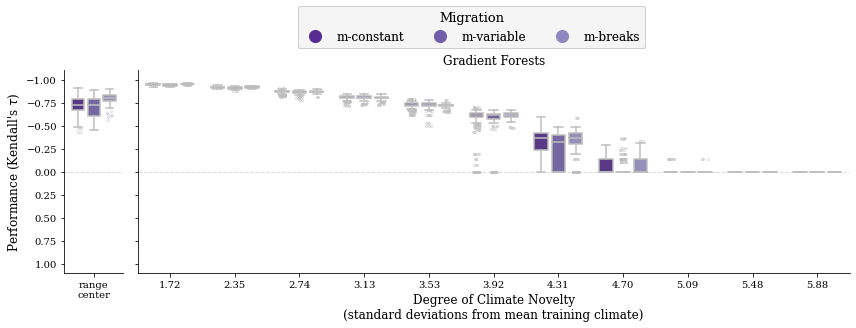

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_marker_set_all-block_1-trait.pdf


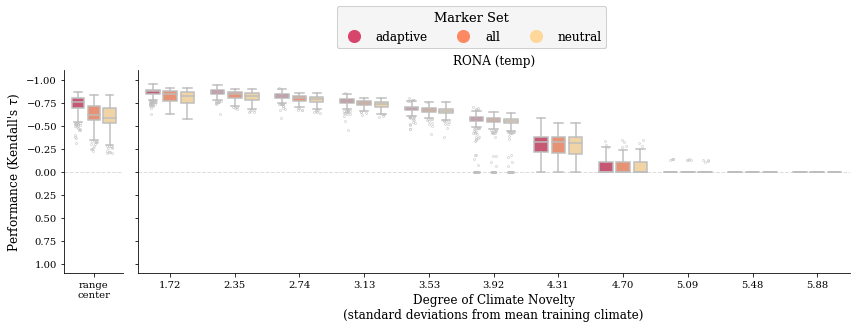

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_marker_set_all-block_1-trait.pdf


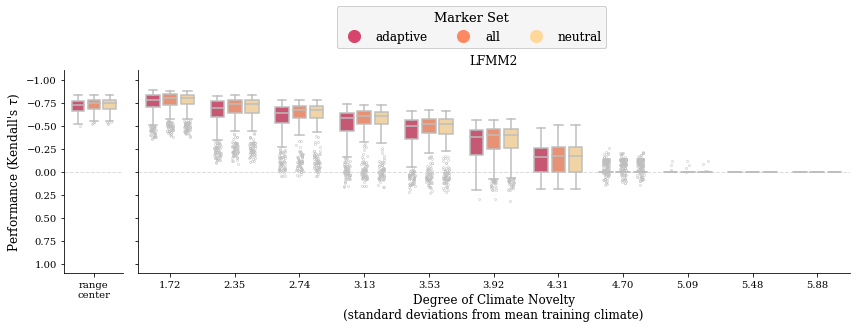

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_marker_set_all-block_1-trait.pdf


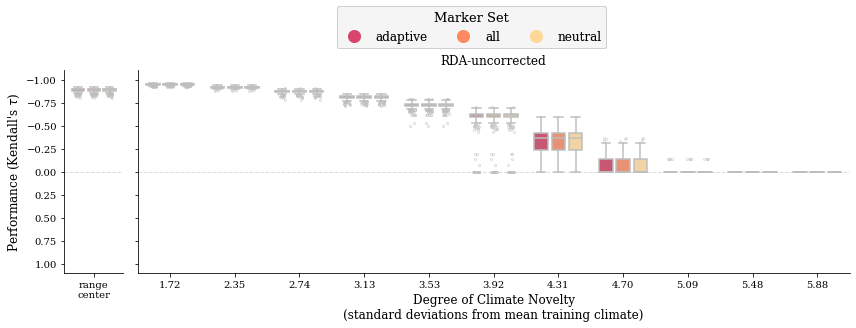

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_marker_set_all-block_1-trait.pdf


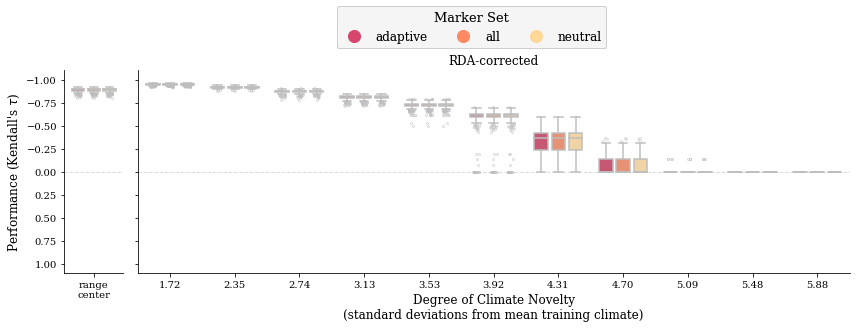

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_marker_set_all-block_1-trait.pdf


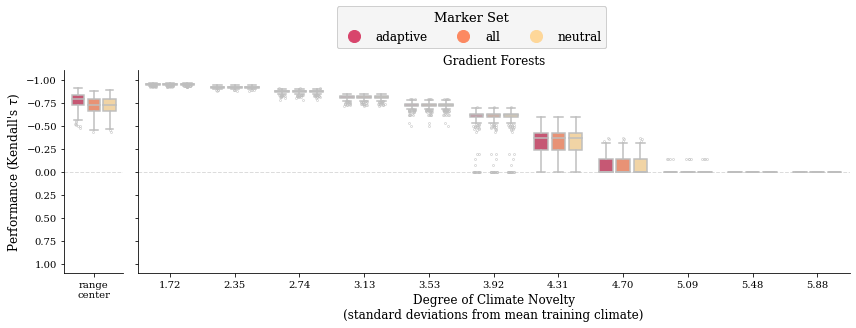

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_demography_all-block_1-trait.pdf


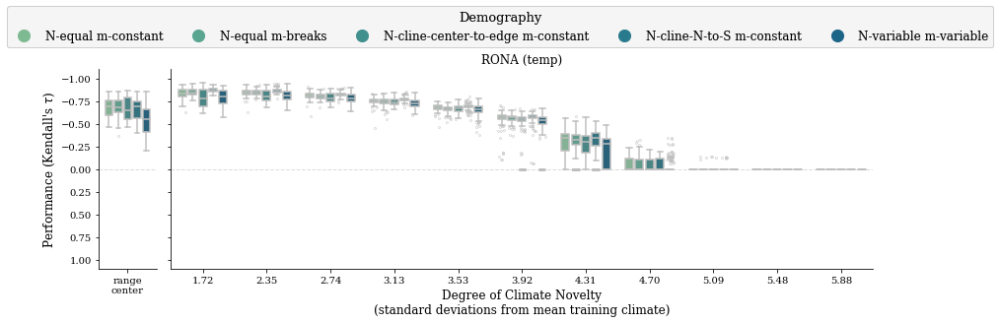

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_demography_all-block_1-trait.pdf


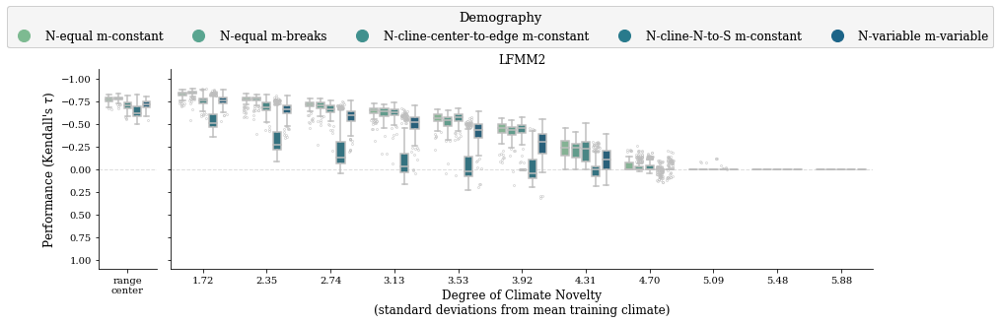

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_demography_all-block_1-trait.pdf


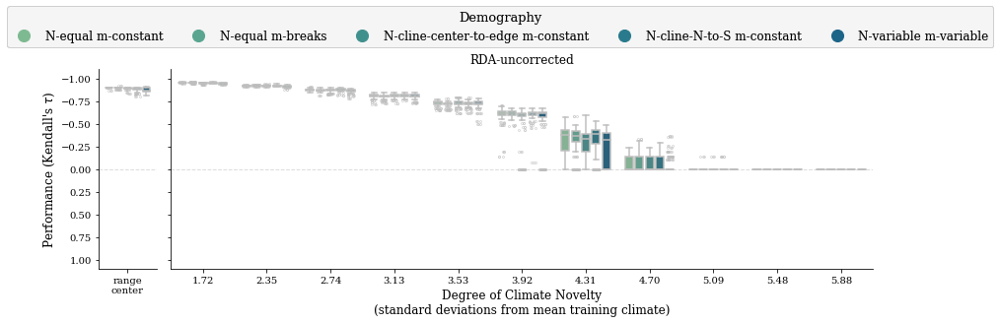

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_demography_all-block_1-trait.pdf


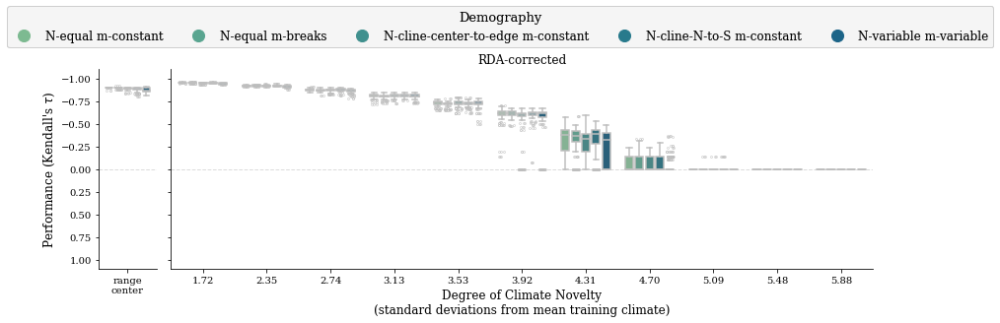

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_demography_all-block_1-trait.pdf


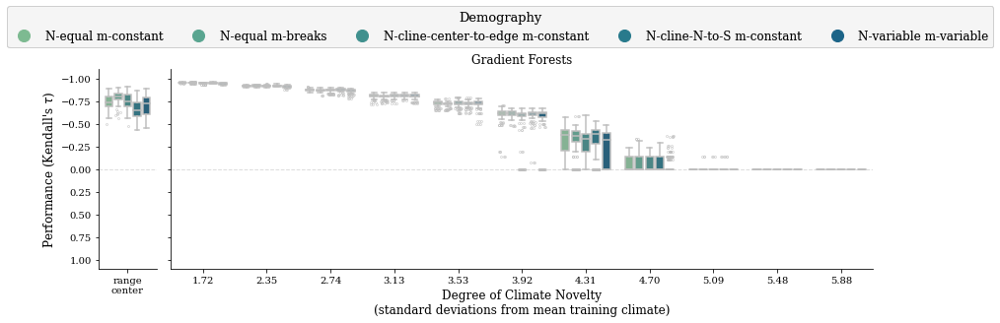

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_final_la_bin_all-block_1-trait.pdf


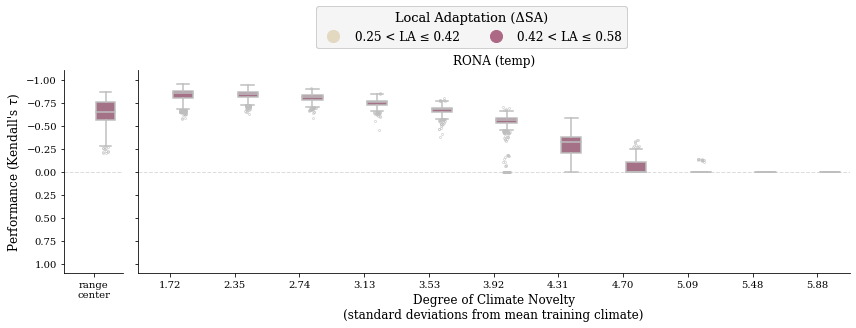

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_final_la_bin_all-block_1-trait.pdf


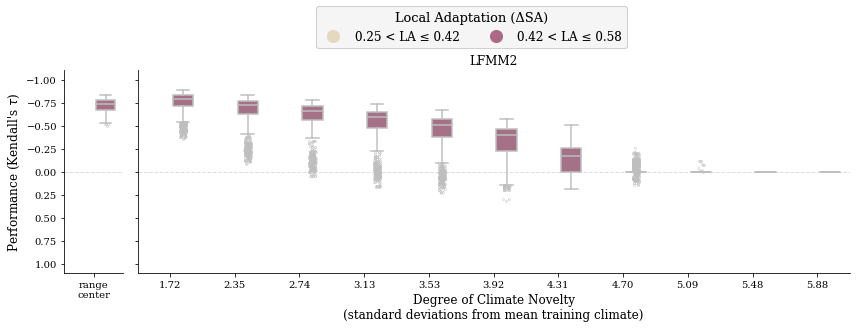

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_final_la_bin_all-block_1-trait.pdf


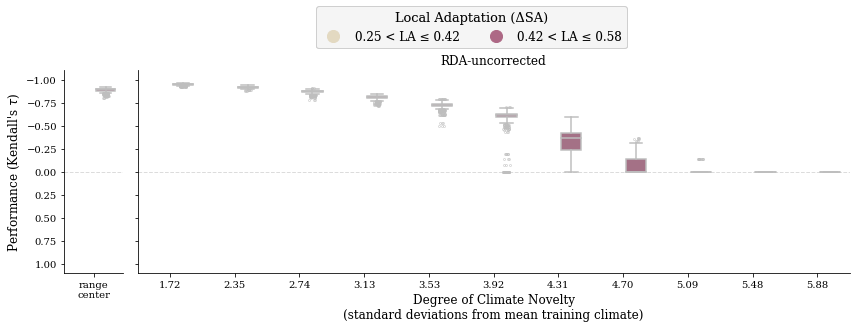

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_final_la_bin_all-block_1-trait.pdf


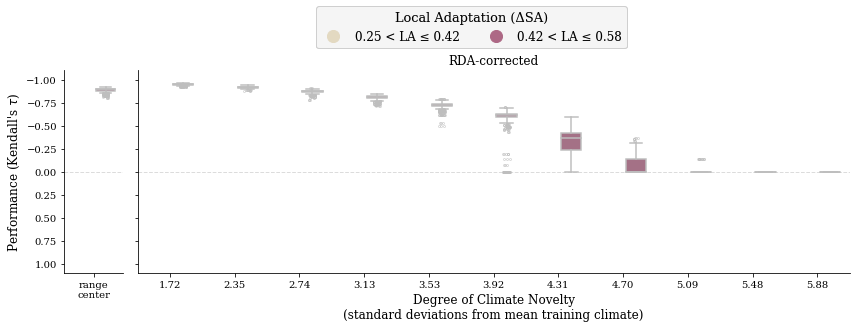

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_final_la_bin_all-block_1-trait.pdf


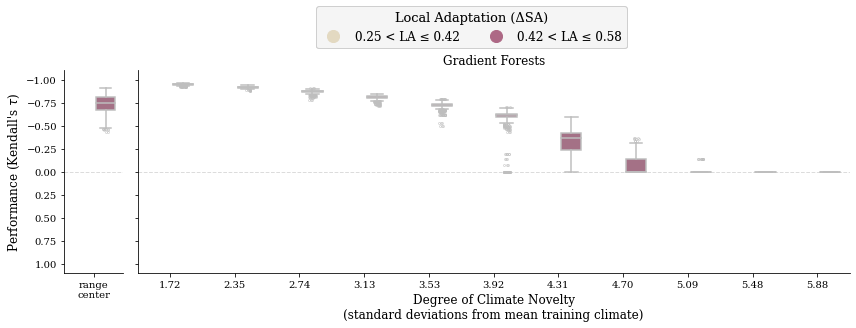

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_landscape_all-block_2-trait.pdf


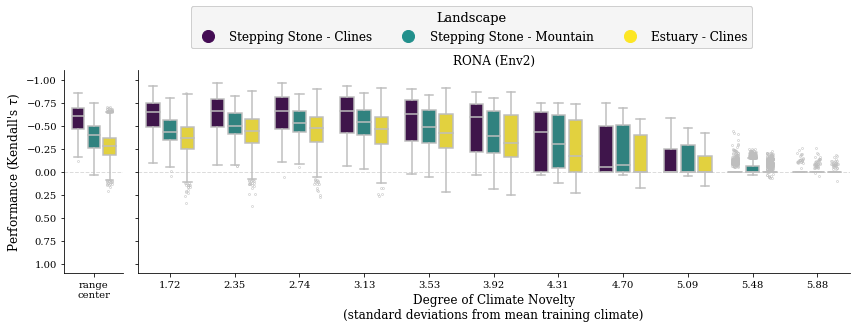

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_landscape_all-block_2-trait.pdf


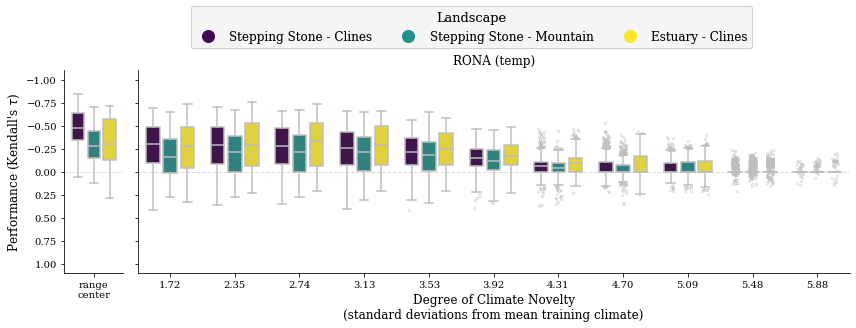

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_landscape_all-block_2-trait.pdf


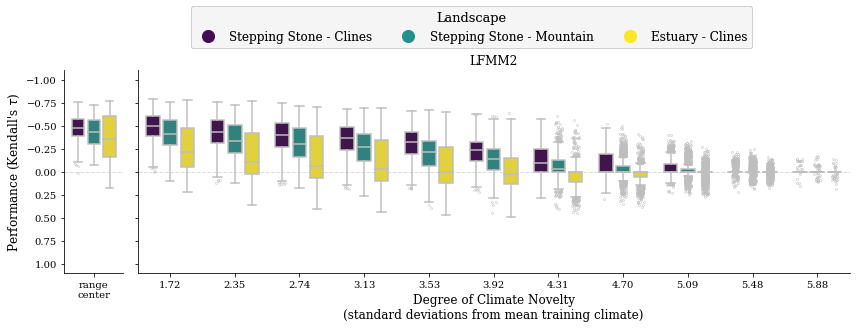

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_landscape_all-block_2-trait.pdf


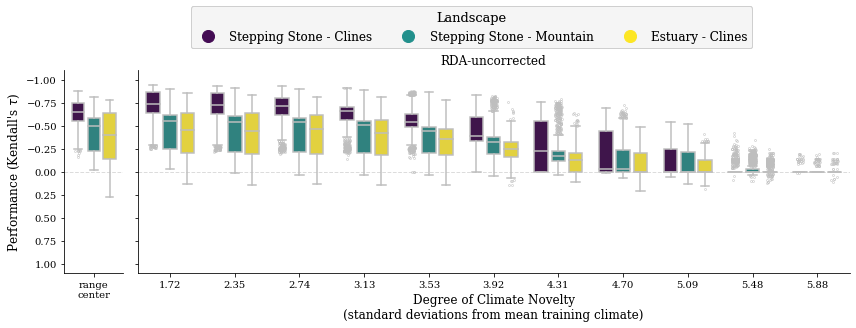

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_landscape_all-block_2-trait.pdf


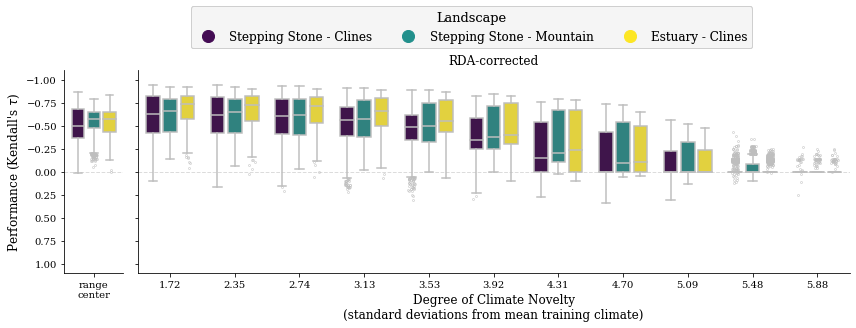

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_landscape_all-block_2-trait.pdf


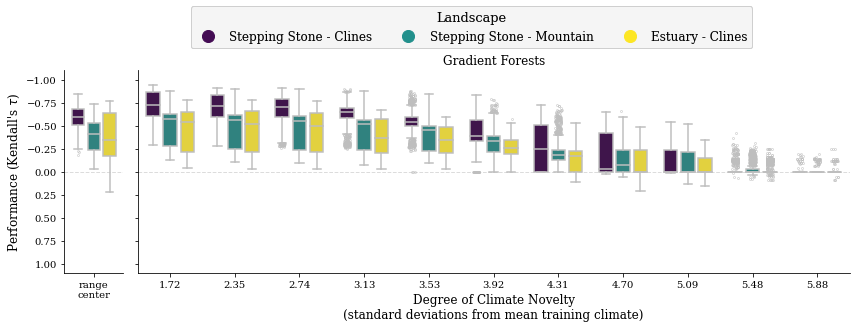

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_glevel_all-block_2-trait.pdf


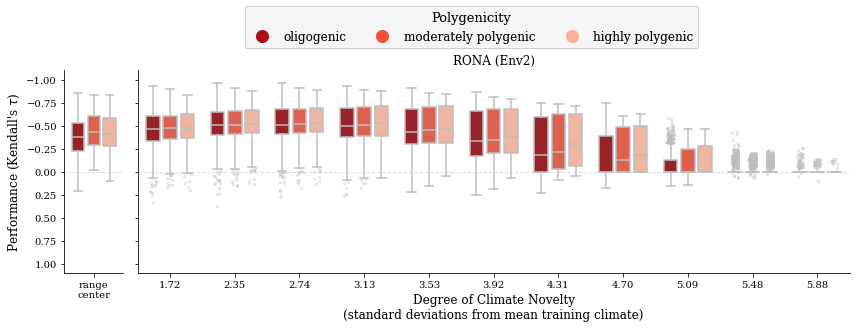

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_glevel_all-block_2-trait.pdf


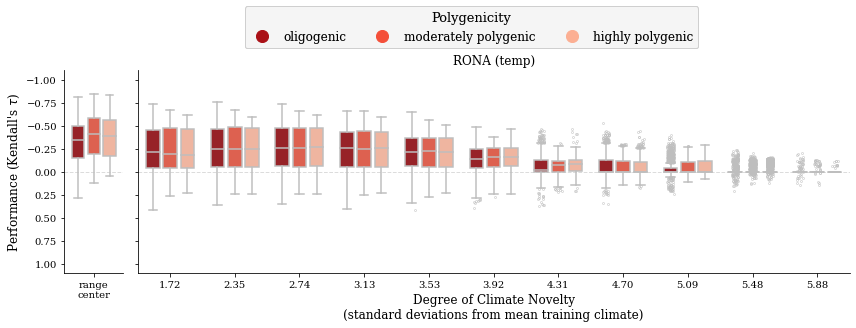

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_glevel_all-block_2-trait.pdf


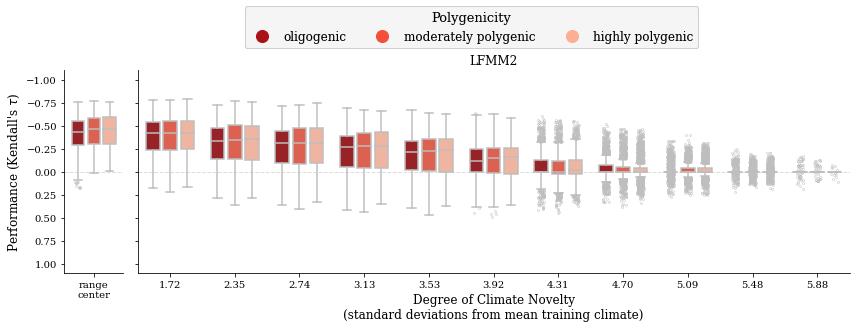

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_glevel_all-block_2-trait.pdf


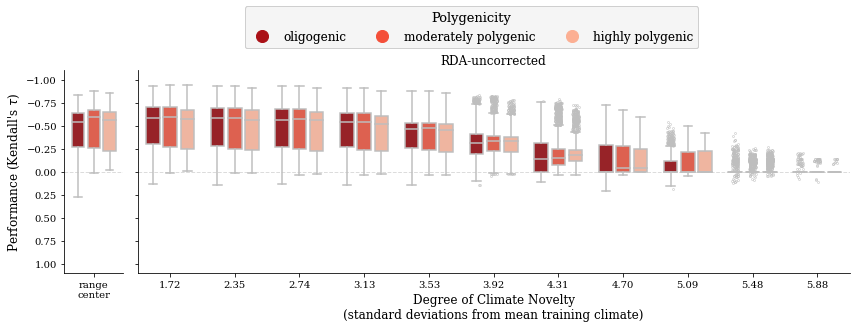

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_glevel_all-block_2-trait.pdf


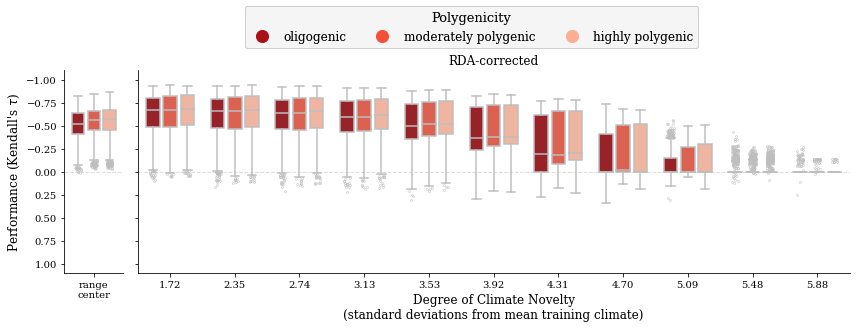

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_glevel_all-block_2-trait.pdf


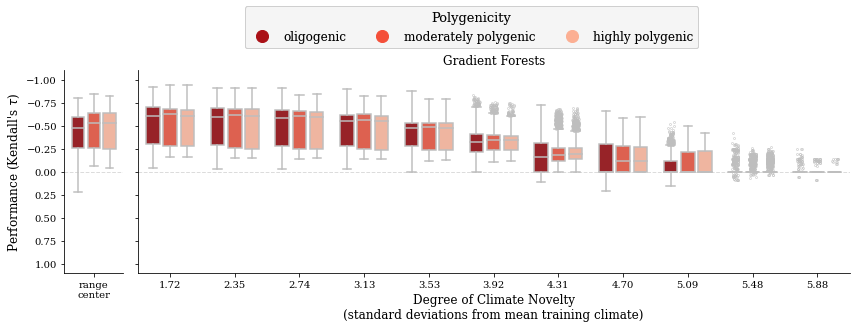

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_pleio_all-block_2-trait.pdf


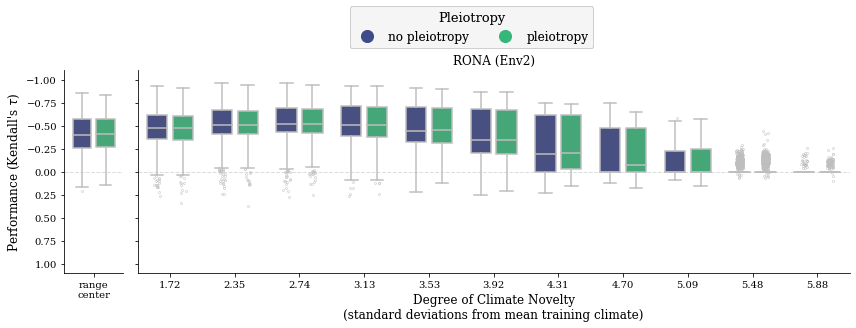

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_pleio_all-block_2-trait.pdf


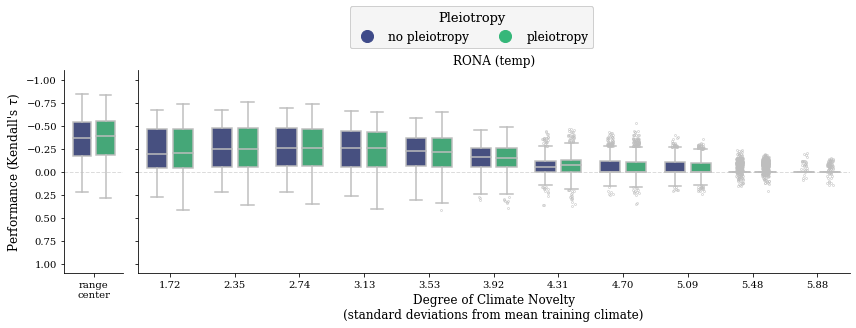

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_pleio_all-block_2-trait.pdf


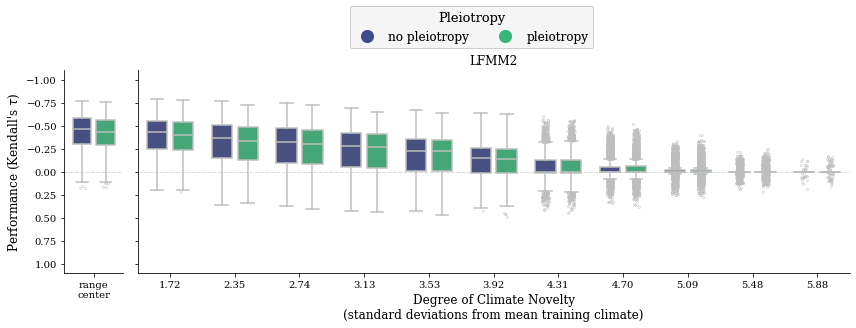

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_pleio_all-block_2-trait.pdf


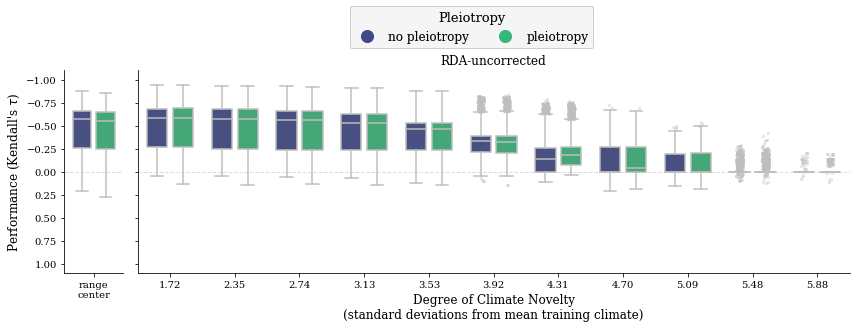

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_pleio_all-block_2-trait.pdf


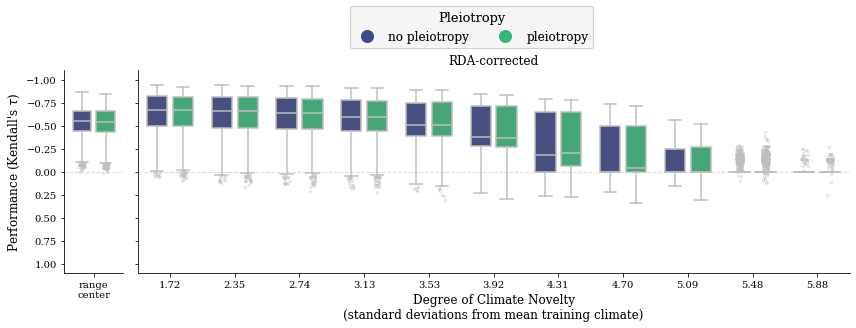

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_pleio_all-block_2-trait.pdf


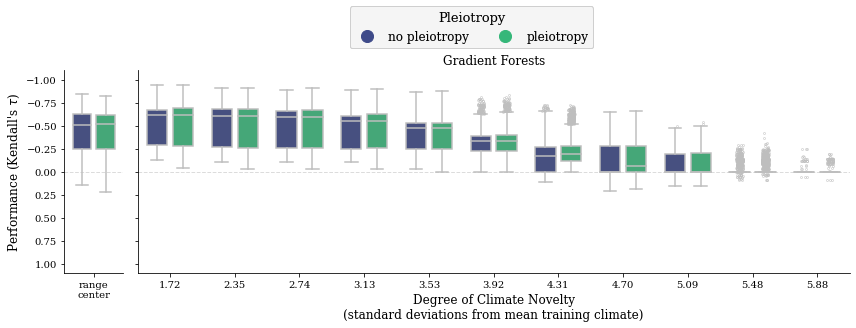

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_slevel_all-block_2-trait.pdf


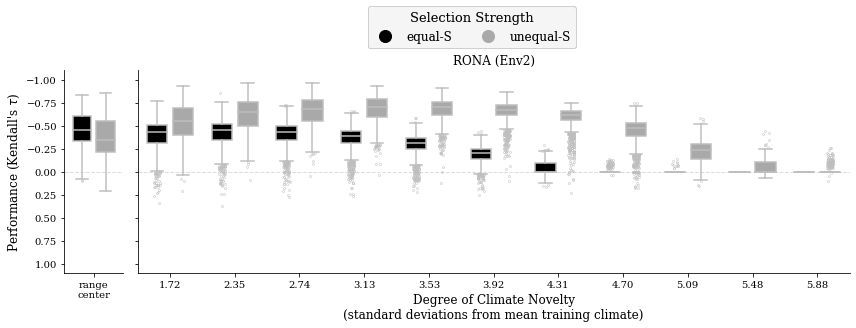

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_slevel_all-block_2-trait.pdf


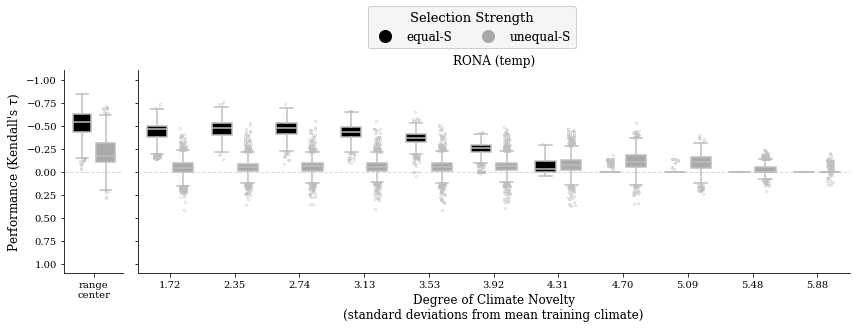

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_slevel_all-block_2-trait.pdf


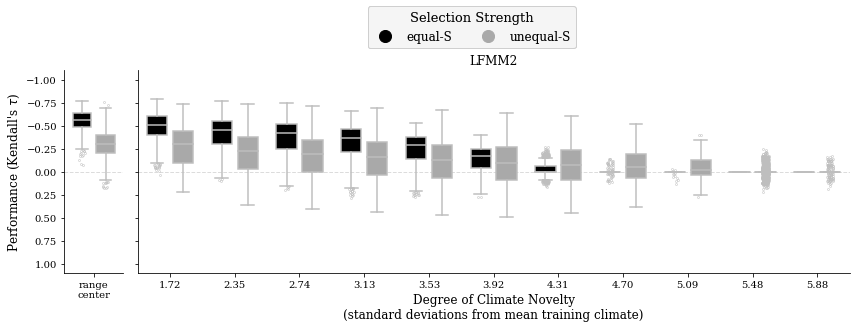

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_slevel_all-block_2-trait.pdf


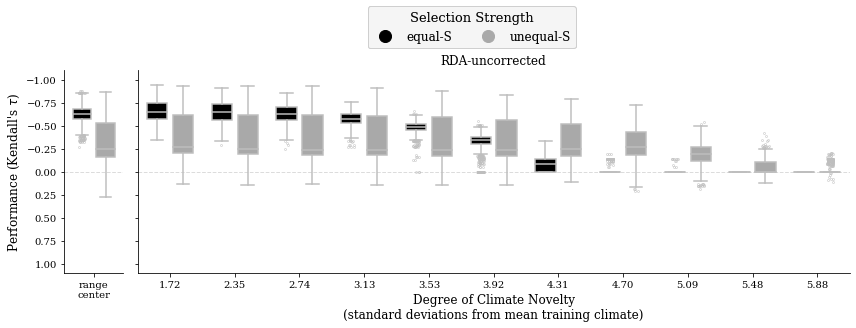

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_slevel_all-block_2-trait.pdf


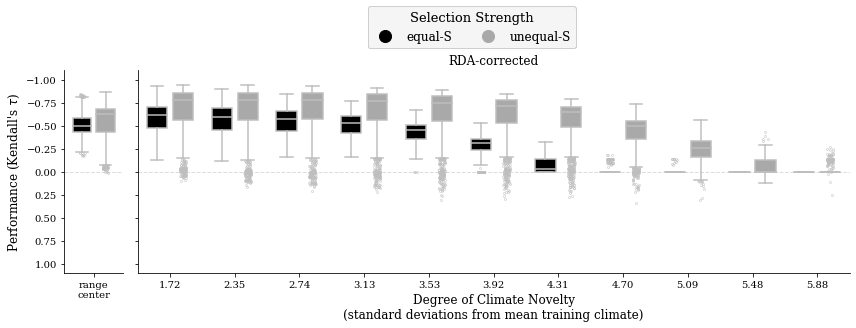

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_slevel_all-block_2-trait.pdf


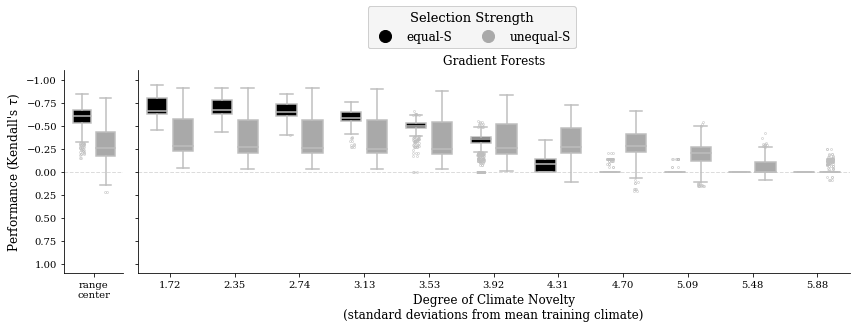

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_popsize_all-block_2-trait.pdf


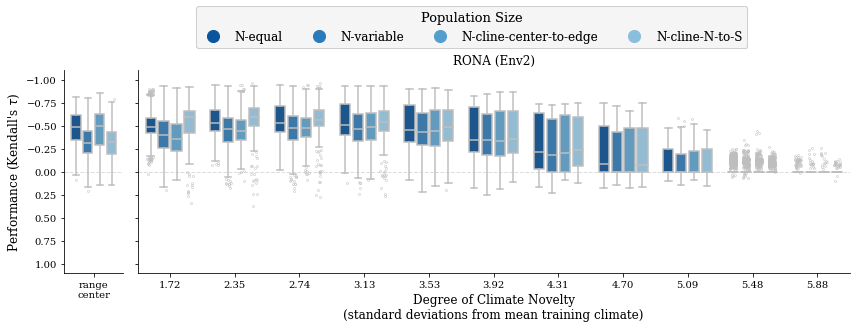

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_popsize_all-block_2-trait.pdf


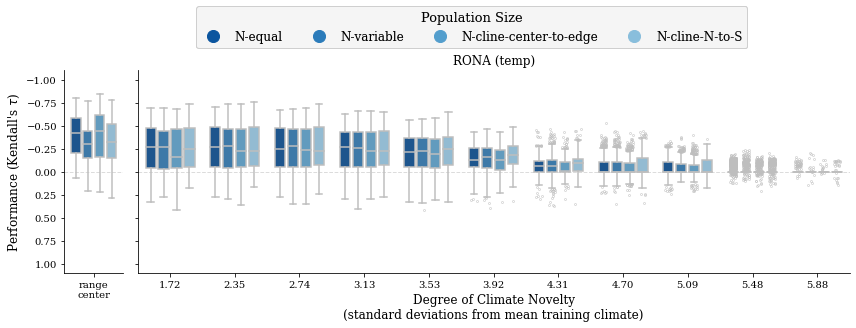

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_popsize_all-block_2-trait.pdf


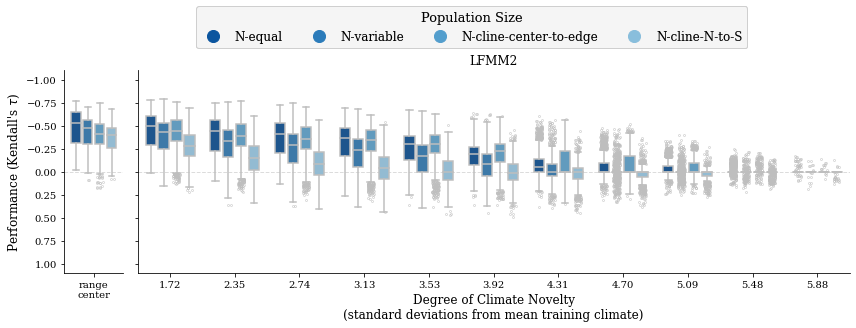

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_popsize_all-block_2-trait.pdf


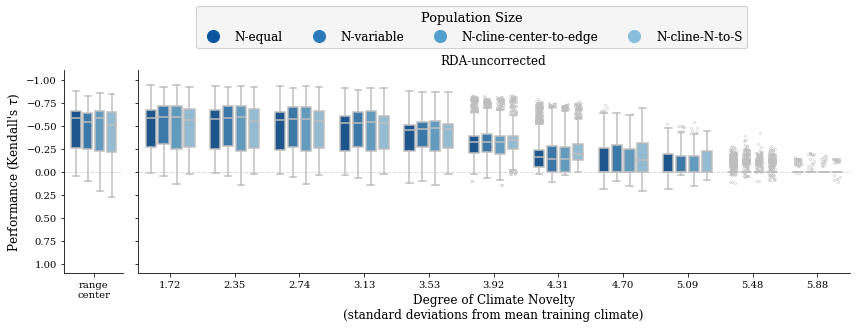

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_popsize_all-block_2-trait.pdf


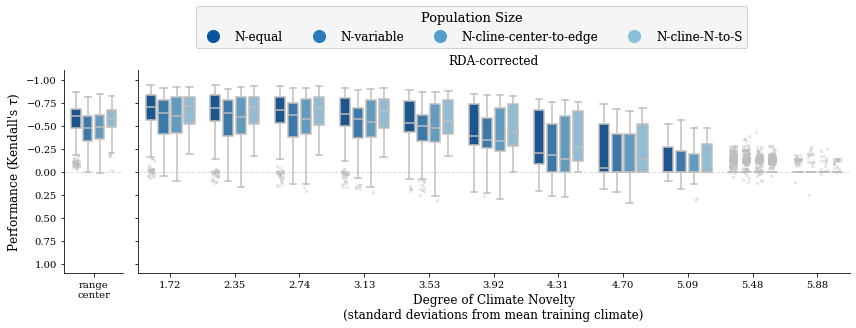

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_popsize_all-block_2-trait.pdf


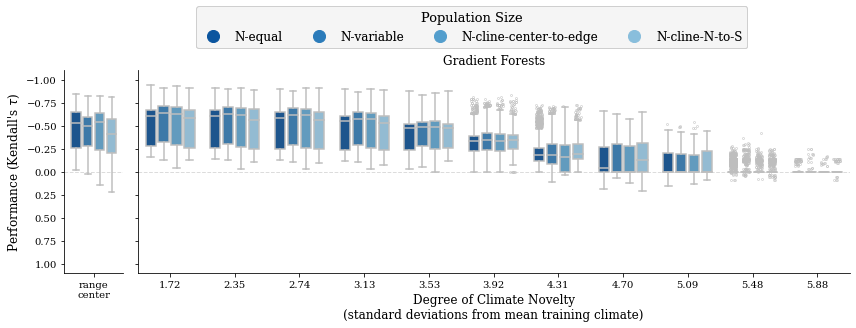

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_migration_all-block_2-trait.pdf


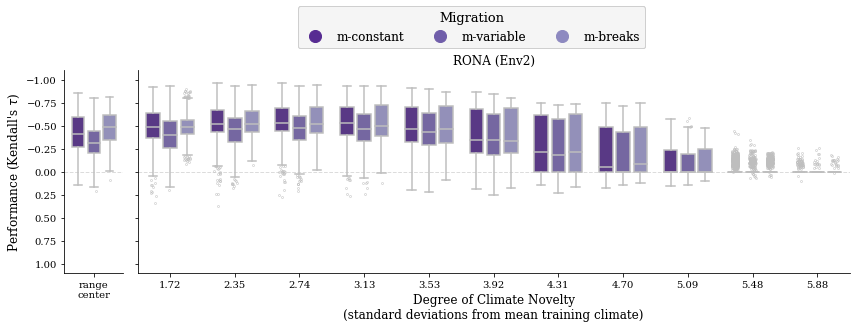

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_migration_all-block_2-trait.pdf


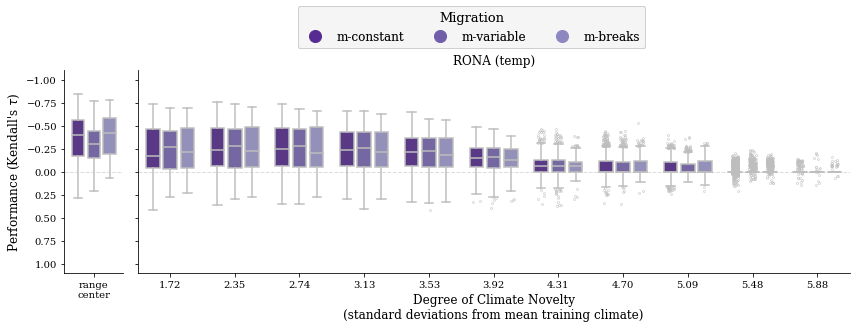

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_migration_all-block_2-trait.pdf


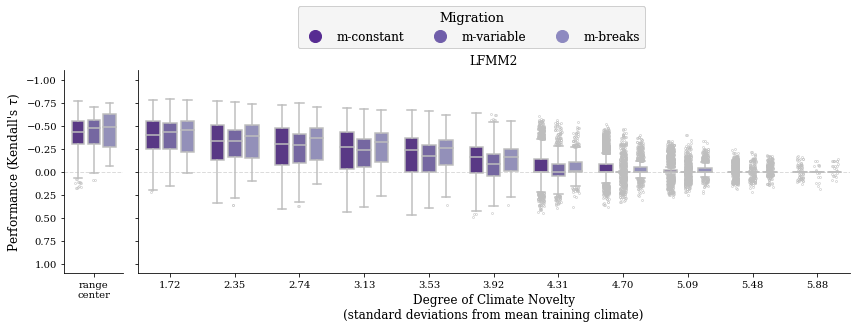

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_migration_all-block_2-trait.pdf


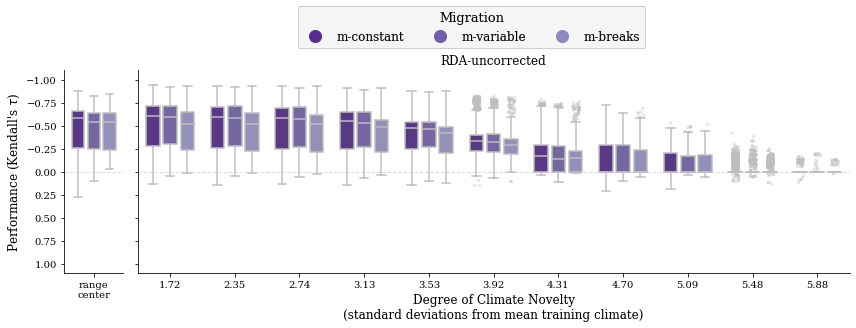

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_migration_all-block_2-trait.pdf


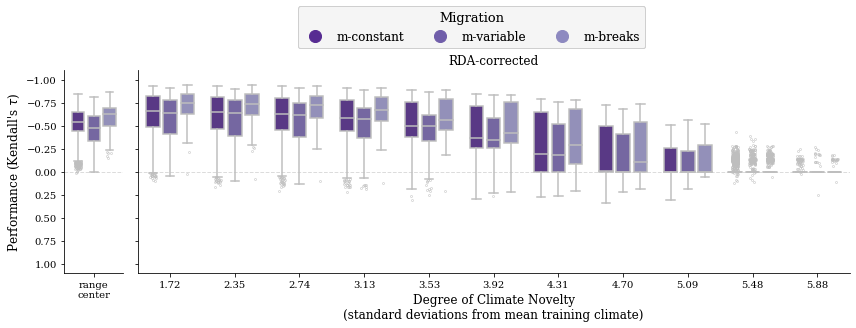

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_migration_all-block_2-trait.pdf


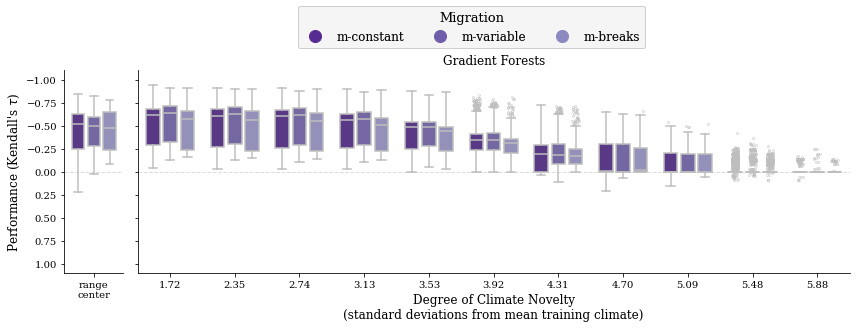

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_marker_set_all-block_2-trait.pdf


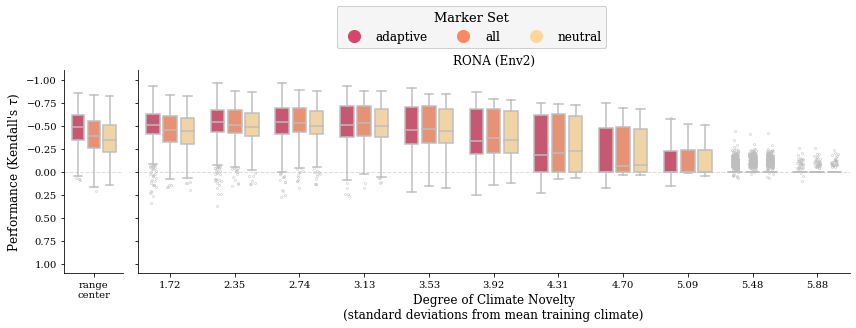

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_marker_set_all-block_2-trait.pdf


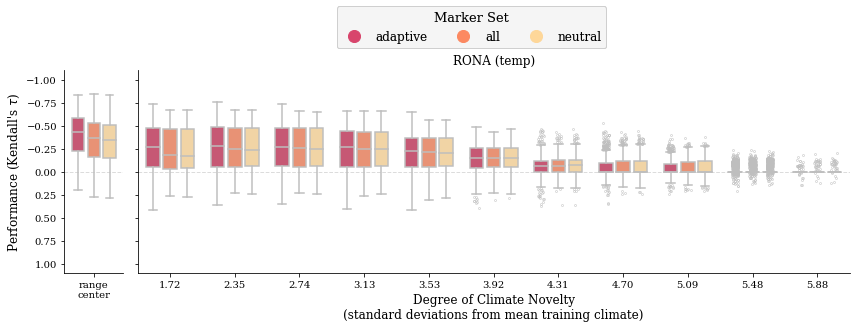

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_marker_set_all-block_2-trait.pdf


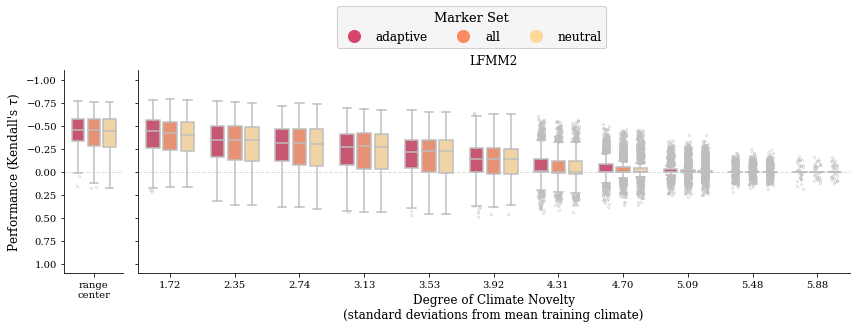

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_marker_set_all-block_2-trait.pdf


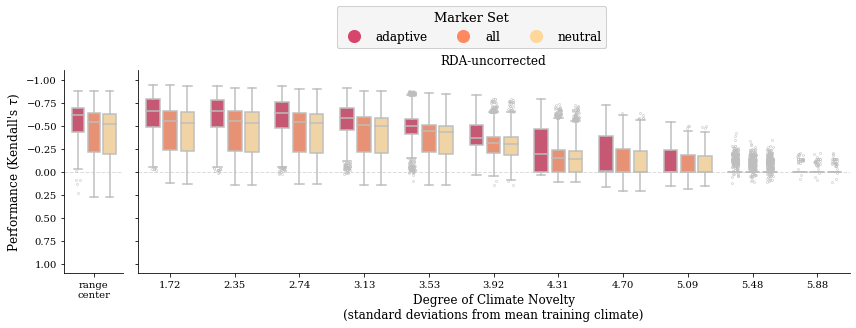

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_marker_set_all-block_2-trait.pdf


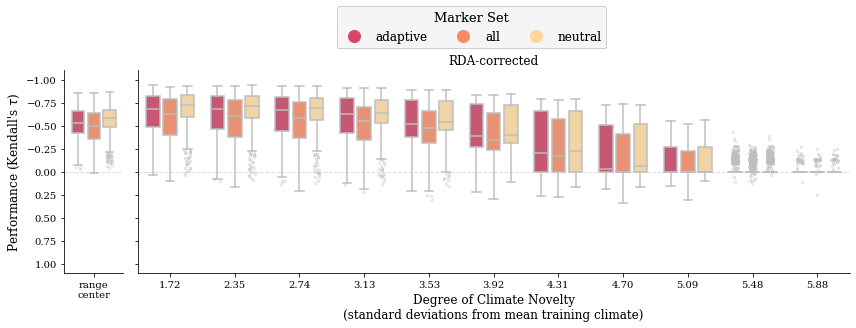

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_marker_set_all-block_2-trait.pdf


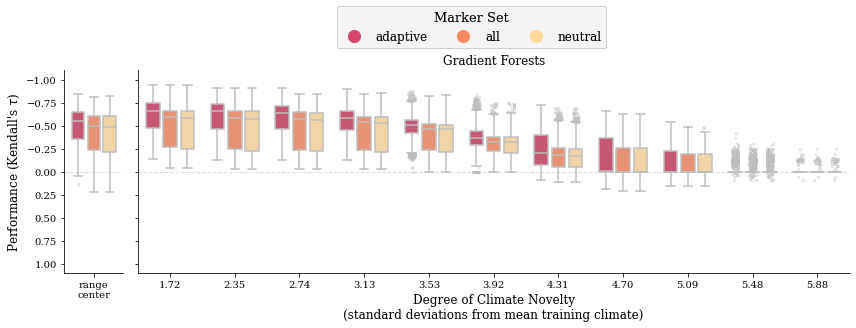

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_demography_all-block_2-trait.pdf


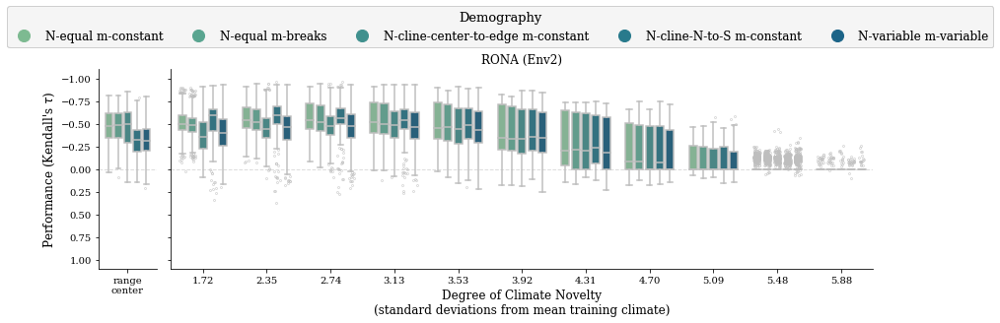

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_demography_all-block_2-trait.pdf


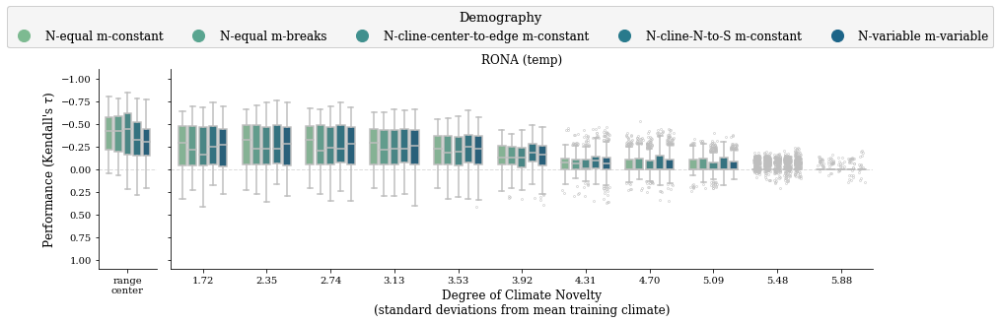

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_demography_all-block_2-trait.pdf


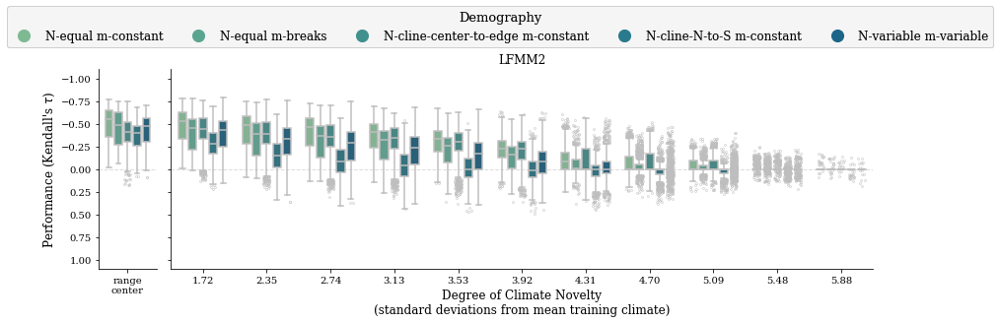

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_demography_all-block_2-trait.pdf


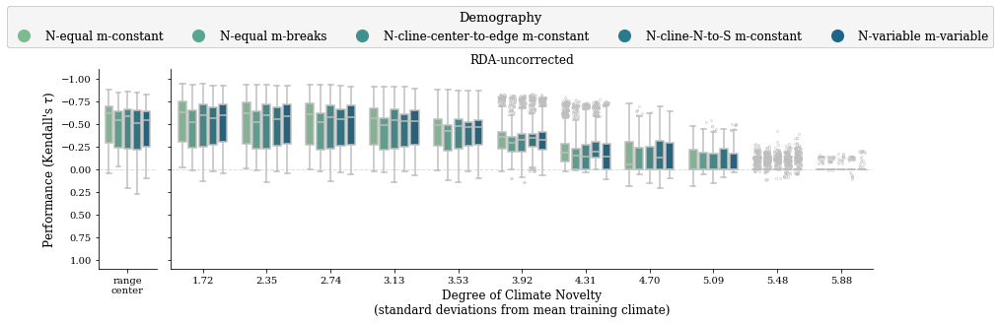

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_demography_all-block_2-trait.pdf


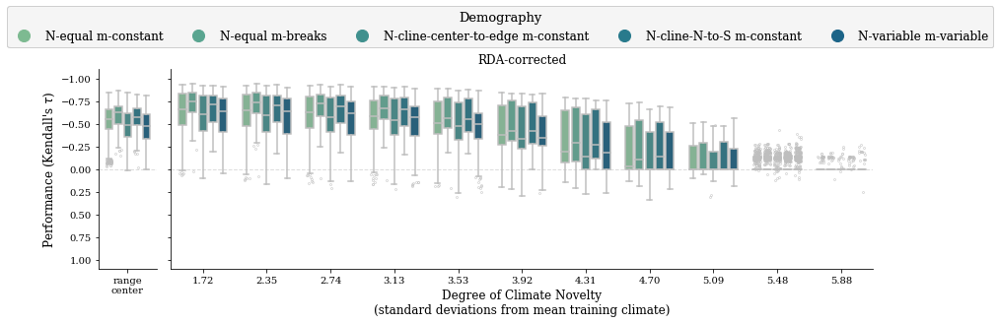

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_demography_all-block_2-trait.pdf


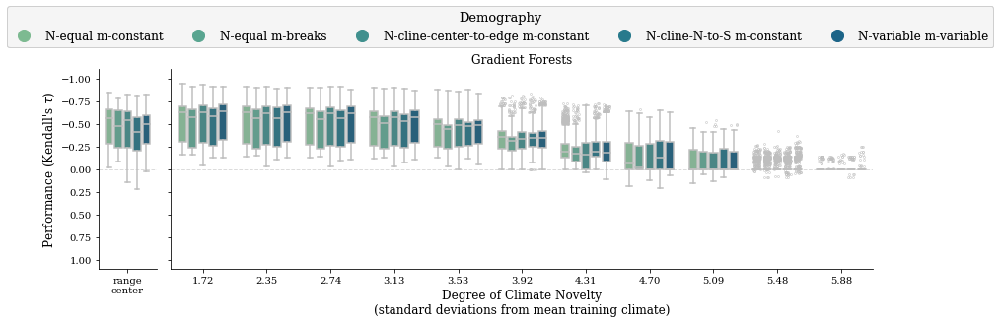

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by_final_la_bin_all-block_2-trait.pdf


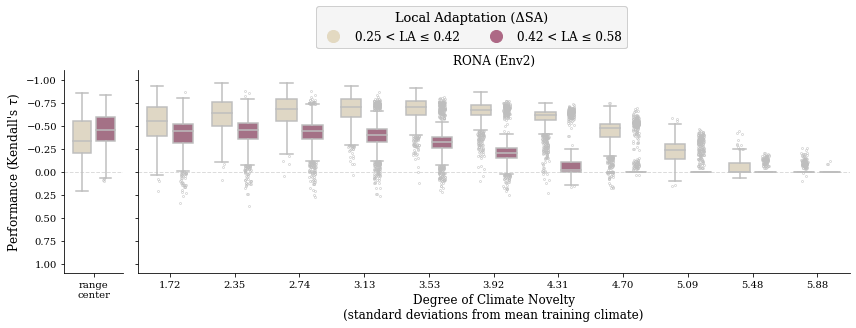

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by_final_la_bin_all-block_2-trait.pdf


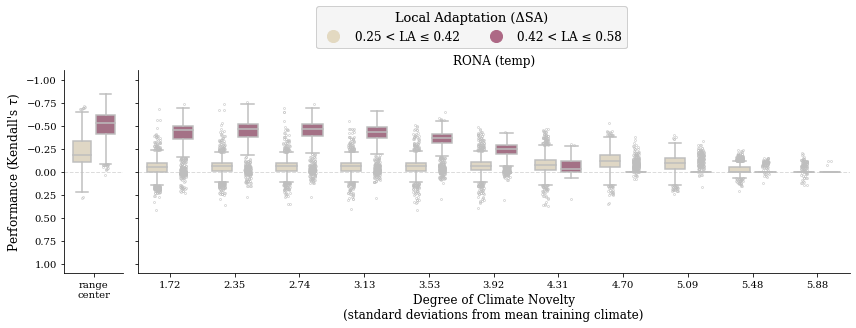

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by_final_la_bin_all-block_2-trait.pdf


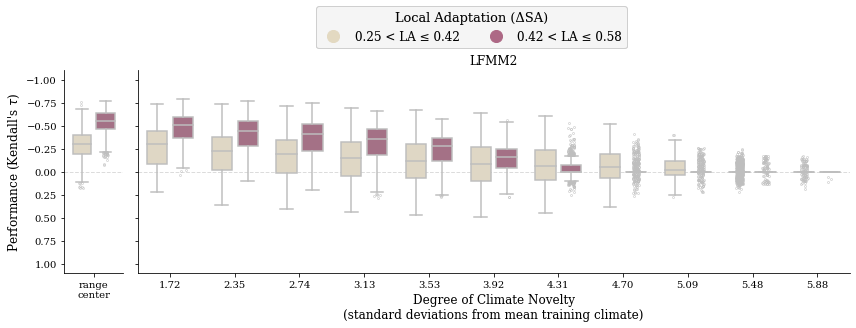

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by_final_la_bin_all-block_2-trait.pdf


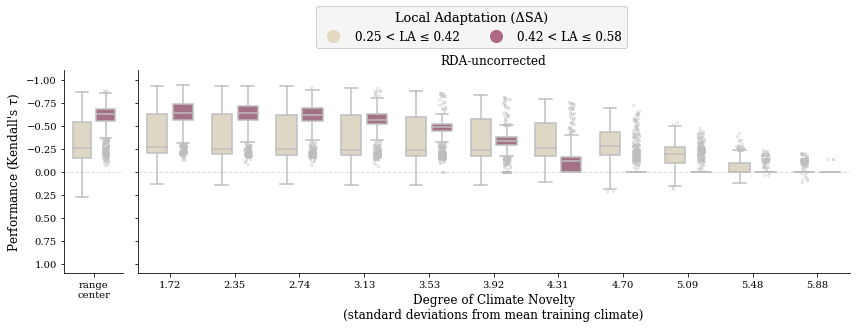

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by_final_la_bin_all-block_2-trait.pdf


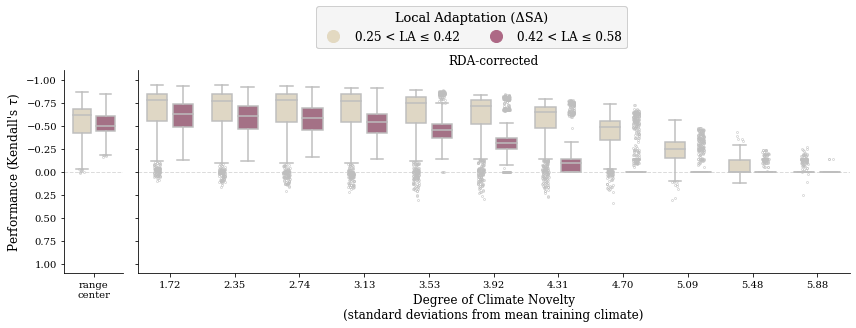

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by_final_la_bin_all-block_2-trait.pdf


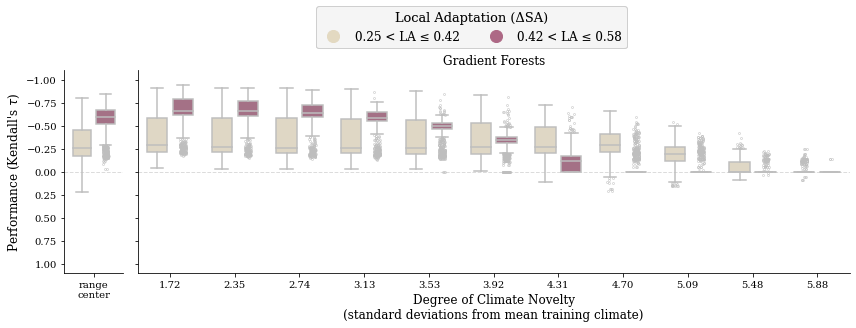

In [38]:
# separate 1- and 2-trait sims by program
for ntraits in ['1-trait' , '2-trait']:
    for hue, hue_order in mvp.hue_order.items():
        if hue in ['program', 'noncausal_env']:
            continue
            
        if ntraits == '1-trait' and hue in ['slevel', 'pleio']:
            continue

        for program in mvp.hue_order['program']:
            
            if program == 'RONA-sal_opt' and ntraits == '1-trait':
                # this would have been 1-trait 1-nuisance, so it's not in dataframe
                continue

            generic_fig(hue=hue,
                        hue_order=hue_order,
                        program=program,
                        pdf=f'{figdir}/{program}_by_{hue}_all-block_{ntraits}.pdf',
                        ntraits=ntraits,
                        **mvp.boxplot_kwargs
                       )

<a id='by_block'></a>
### all programs together, by population blocks

[top](#home)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/by-block.pdf


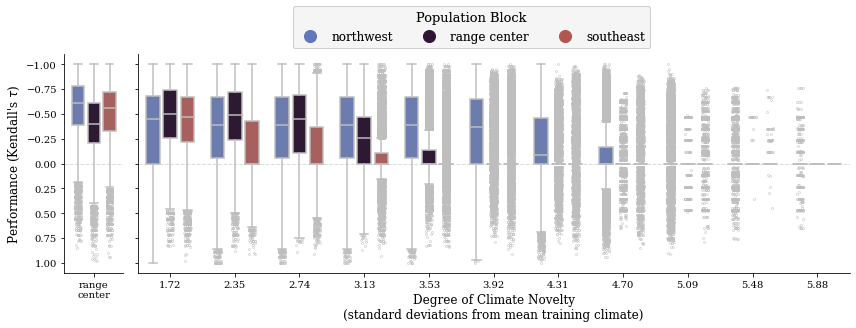

In [39]:
generic_fig(hue='block',
            hue_order=['northwest', 'rangecenter', 'southeast'],
            pdf=f'{figdir}/by-block.pdf',
            block=['northwest', 'rangecenter', 'southeast'],
            **mvp.boxplot_kwargs
           )

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/by-block_without-RONA.pdf


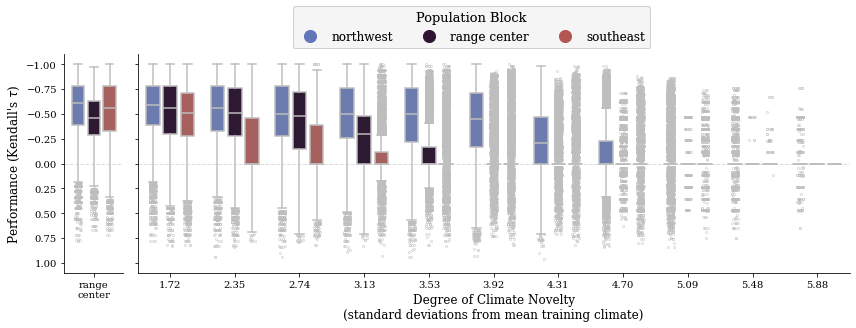

In [40]:
generic_fig(hue='block',
            hue_order=['northwest', 'rangecenter', 'southeast'],
            pdf=f'{figdir}/by-block_without-RONA.pdf',
            block=['northwest', 'rangecenter', 'southeast'],
            remove_RONA=True,
            **mvp.boxplot_kwargs
           )

### separate programs

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by-block.pdf


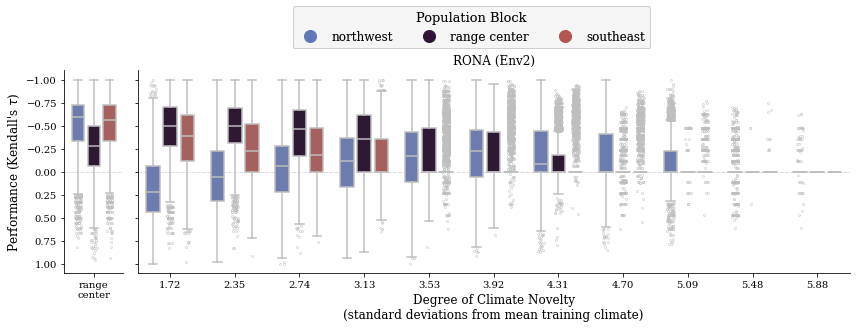

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by-block.pdf


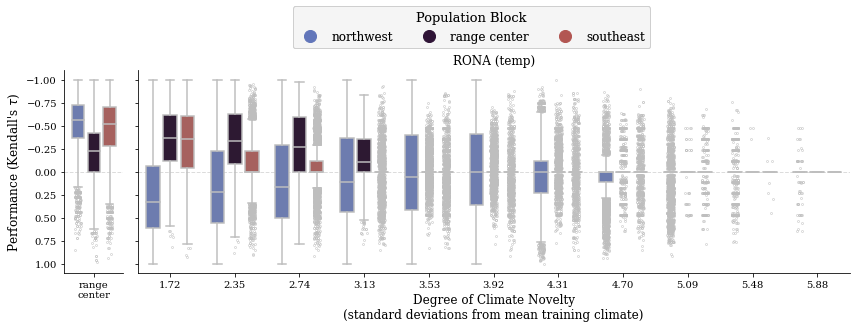

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by-block.pdf


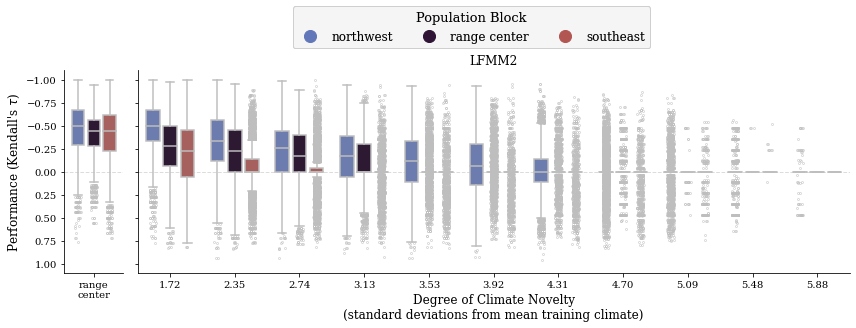

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by-block.pdf


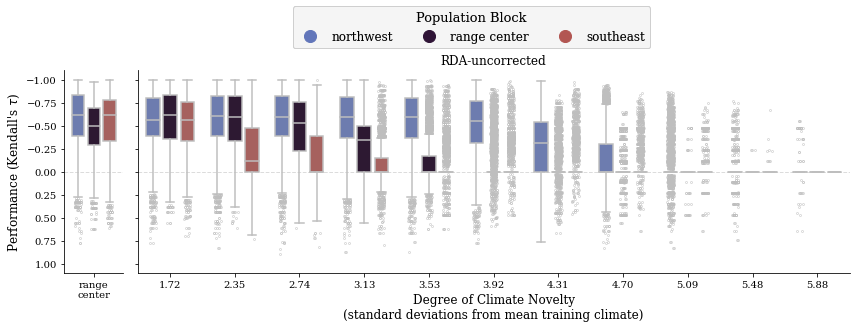

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by-block.pdf


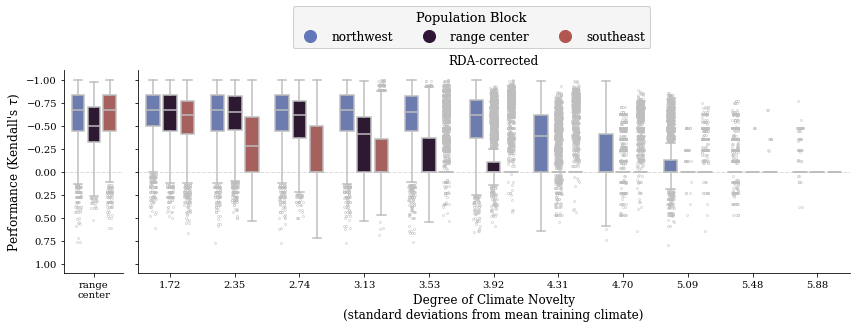

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by-block.pdf


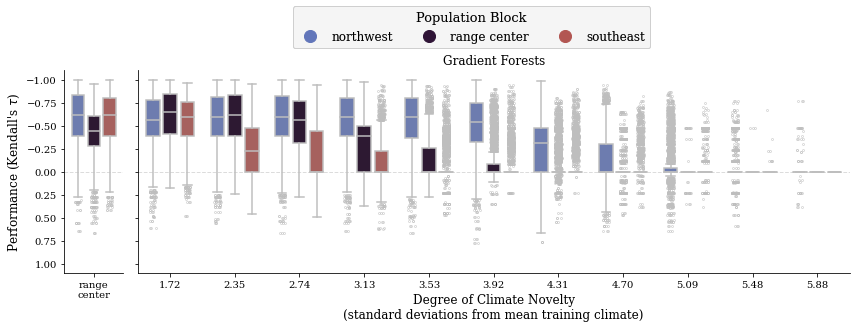

In [41]:
for program in mvp.hue_order['program']:
    
    generic_fig(hue='block',
                hue_order=['northwest', 'rangecenter', 'southeast'],
                pdf=f'{figdir}/{program}_by-block.pdf',
                program=program,
                block=['northwest', 'rangecenter', 'southeast'],
                **mvp.boxplot_kwargs
               )

# make figures for marker sets

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_by-marker_set.pdf


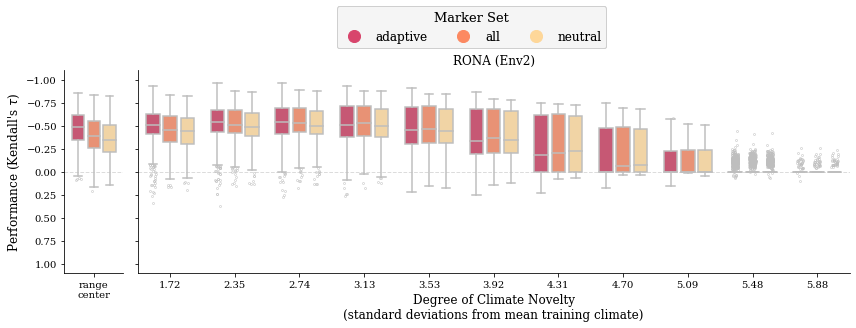

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_by-marker_set.pdf


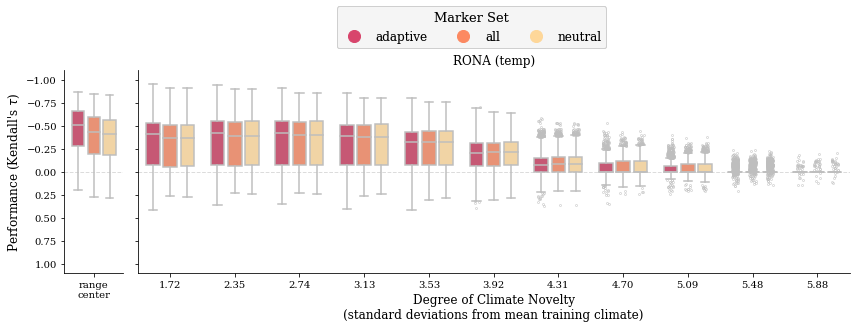

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_by-marker_set.pdf


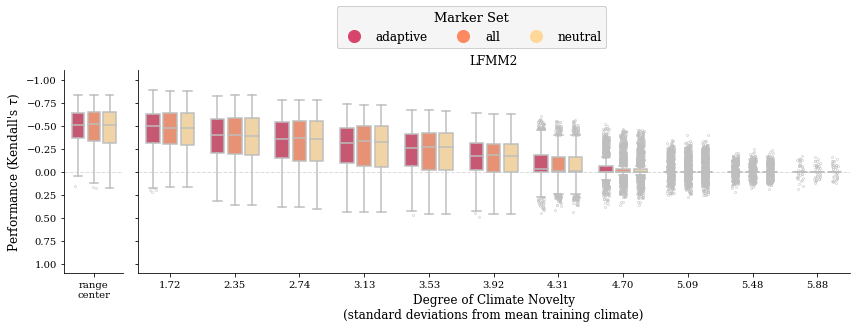

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_by-marker_set.pdf


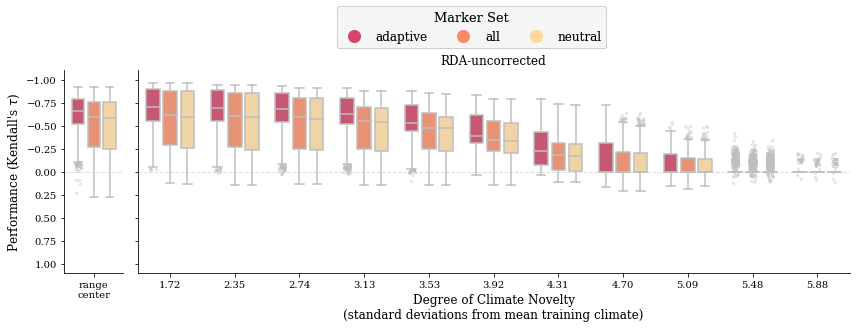

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_by-marker_set.pdf


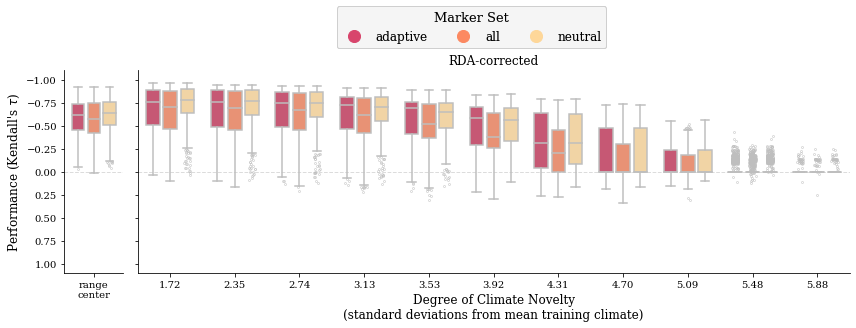

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_by-marker_set.pdf


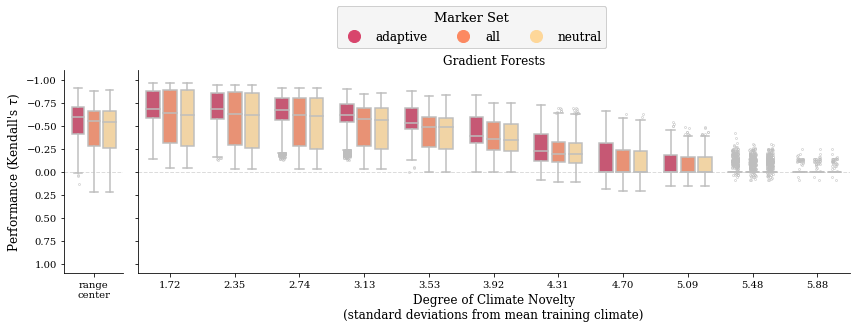

In [42]:
for program in mvp.hue_order['program']:
    
    generic_fig(hue='marker_set',
                hue_order=mvp.hue_order['marker_set'],
                pdf=f'{figdir}/{program}_by-marker_set.pdf',
                program=program,
                block=['all'],
                **mvp.boxplot_kwargs
               )

### pairwise comparisons of marker sets

these figures DO NOT set NA scores to 0

In [43]:
def make_fig(i_data, j_data, marker_set_i, marker_set_j, level=None, exclude_RONA=False):
    """Make a 2dscatter plot comparing marker set performances."""
    # make 2d scatter
    perc = round(
        100 * (sum(i_data.score <= j_data.score) / nrow(i_data)),
        2
    )

    title = f'{mvp.factor_names[level]}\n' if level is not None else ''
    title = f'{title}{perc}% of $\it{marker_set_i}$ scores are ≤ $\it{marker_set_j}$ scores'

    # fig, ax = plt.subplots()
    g = scatter2d(x=i_data.score,
                  y=j_data.score,
                  ylim=(-1, 1),
                  xlim=(-1, 1),
                  title=title,
                  cmap='magma', #plt.cm.get_cmap("magma", lut=6),
                  marginal_kws={'color' : 'gray'},
                  title_kws={'x' : 0.5},
                  bins=50,
                 )

    draw_xy(g.ax_joint)

    g.ax_joint.invert_xaxis()
    g.ax_joint.invert_yaxis()

    # draw lines at x=0 and y=0
    g.ax_joint.axhline(0, linestyle='--', color='gainsboro', linewidth=1, zorder=0)
    g.ax_joint.axvline(0, linestyle='--', color='gainsboro', linewidth=1, zorder=0)

    g.ax_joint.set_xlabel(f"$\it{marker_set_i}$ performance (Kendall's $\\tau$)")
    g.ax_joint.set_ylabel(f"$\it{marker_set_j}$ performance (Kendall's $\\tau$)")

    
    if exclude_RONA is True:
        file_filler = 'without_RONA'
    else:
        file_filler = 'with_RONA'
        
    if level is not None:
        save_pdf(f'{figdir}/{level}_{marker_set_i}_{marker_set_j}_{file_filler}_2dhist.pdf')
    else:
        save_pdf(f'{figdir}/alldata_{marker_set_i}_{marker_set_j}_{file_filler}_2dhist.pdf')

    plt.show()
    
    pass


def make_diff_figs(diffs, hue, exclude_RONA):
    """Make a 3-panelled figure for pairwise differences in marker set performance."""
    
    for level in diffs:
        fig, axes = plt.subplots(ncols=3, figsize=(8, 3), sharey=True)
        
        for i, marker_combo in enumerate(['adaptive all', 'adaptive neutral', 'all neutral']):
            marker_set_i, marker_set_j = marker_combo.split()

#             diff = diffs[level][marker_combo]

            ax = axes[i]

            ax_box, ax_hist = histo_box(
                data=diffs[level][marker_combo],
                xlim=(-1, 1),
                xticks_by=0.5,
                title=f'$\it{marker_set_i}$ - $\it{marker_set_j}$',
                histbins=20,
                ax=ax,
                ticksize=8,
                boxplot_kws={'flierprops' : {'marker' : '.'}},
                markersize=3
            )

            mvp.jitter_fliers(axes=[ax_box], jitter_axis='y', jit=0.3)
            
        if exclude_RONA is True:
            file_filler = '_without_RONA'
        else:
            file_filler = '_with_RONA'

        if hue == 'program':
            file_filler = ''
        
        file_filler += '' if hue is None else f'_{level}'
        fig.supxlabel('Performance difference', y=0.05)
        plt.tight_layout()
        save_pdf(f'{figdir}/histo_diffs{file_filler}.pdf')
        plt.show()

            
    pass


def make_marker_figs(hue=None, validation_block='all', exclude_RONA=False):
    """Wrapper for `make_fig` and `make_diff_figs`."""
    val_df = validation[(validation.block == validation_block) & (validation.outlier_clim != 0)].copy()
    
    if exclude_RONA is True:
        val_df = val_df[~val_df.program.str.contains('RONA')]

    diffs = wrap_defaultdict(dict, 3)
    for marker_set_i, marker_set_j in it.combinations(mvp.hue_order['marker_set'], r=2):
        i_data = val_df[val_df.marker_set == marker_set_i].copy().reset_index(drop=True)
        j_data = val_df[val_df.marker_set == marker_set_j].copy().reset_index(drop=True)

        if hue is not None:
            for level in mvp.hue_order[hue]:
                level_i = i_data[i_data[hue] == level].copy().reset_index(drop=True)
                level_j = j_data[j_data[hue] == level].copy().reset_index(drop=True)
                
                make_fig(level_i, level_j, marker_set_i, marker_set_j, level, exclude_RONA)
                
                diffs[level][f'{marker_set_i} {marker_set_j}'] = level_i.score - level_j.score

        else:
            make_fig(i_data, j_data, marker_set_i, marker_set_j, exclude_RONA=exclude_RONA)
            diffs[None][f'{marker_set_i} {marker_set_j}'] = i_data.score - j_data.score
            
    make_diff_figs(diffs, hue, exclude_RONA)
        
    pass

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/alldata_adaptive_all_without_RONA_2dhist.pdf


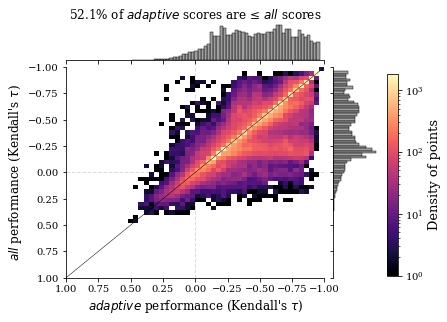

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/alldata_adaptive_neutral_without_RONA_2dhist.pdf


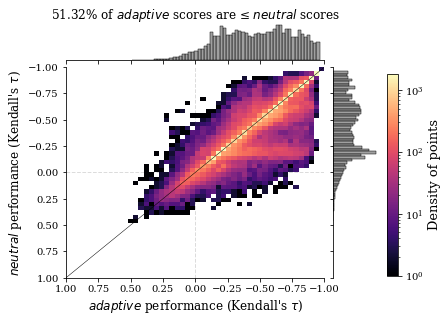

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/alldata_all_neutral_without_RONA_2dhist.pdf


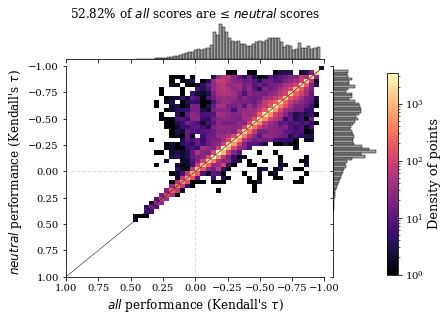

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/histo_diffs_without_RONA.pdf


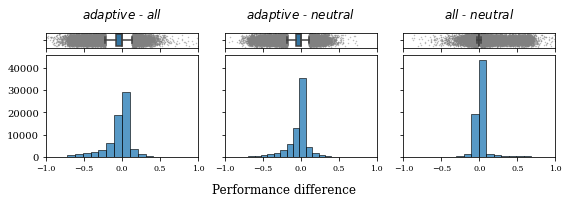

In [44]:
# programs all together except RONA
make_marker_figs(exclude_RONA=True)

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/alldata_adaptive_all_with_RONA_2dhist.pdf


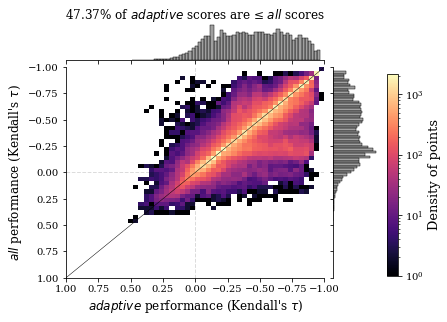

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/alldata_adaptive_neutral_with_RONA_2dhist.pdf


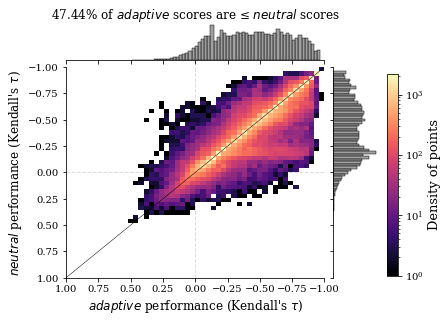

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/alldata_all_neutral_with_RONA_2dhist.pdf


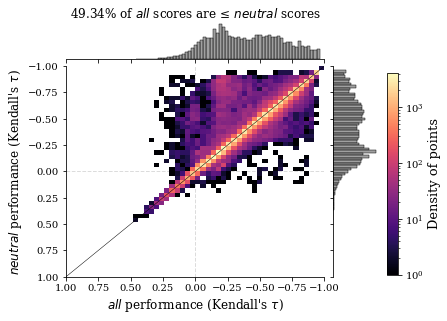

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/histo_diffs_with_RONA.pdf


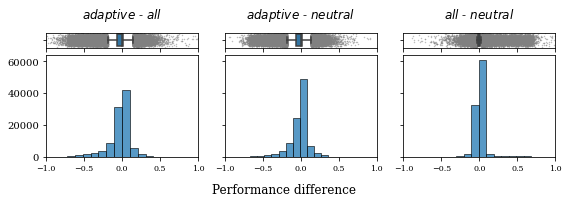

In [45]:
# programs all together
make_marker_figs()

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_adaptive_all_with_RONA_2dhist.pdf


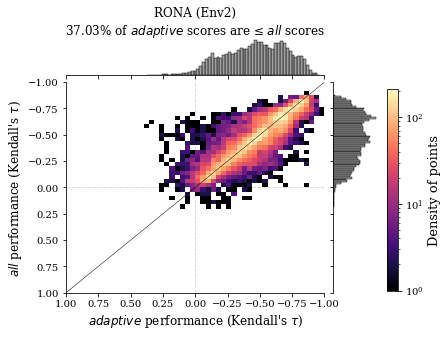

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_adaptive_all_with_RONA_2dhist.pdf


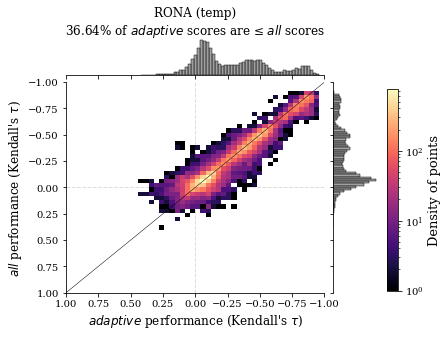

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_adaptive_all_with_RONA_2dhist.pdf


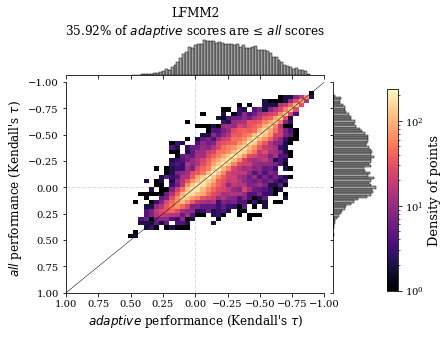

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_adaptive_all_with_RONA_2dhist.pdf


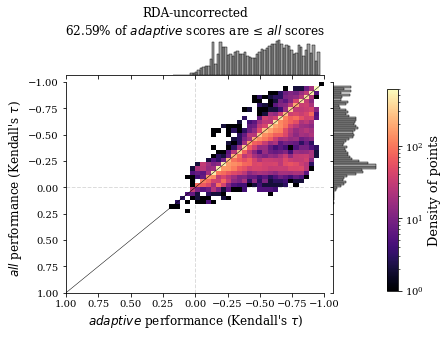

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_adaptive_all_with_RONA_2dhist.pdf


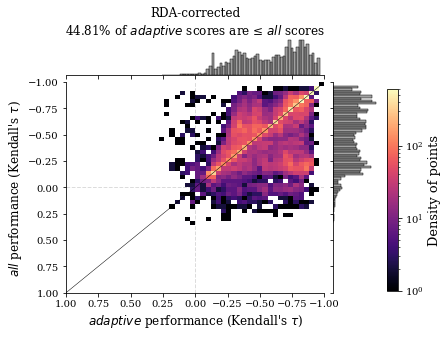

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_adaptive_all_with_RONA_2dhist.pdf


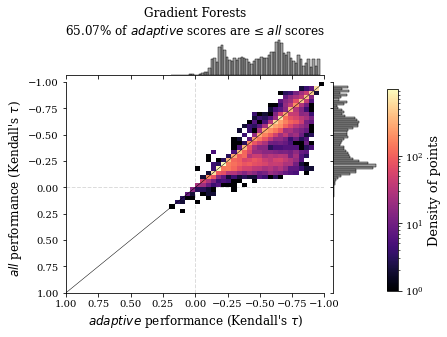

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_adaptive_neutral_with_RONA_2dhist.pdf


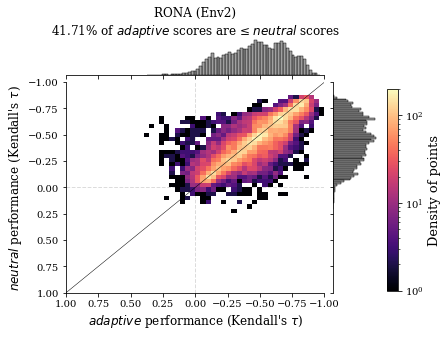

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_adaptive_neutral_with_RONA_2dhist.pdf


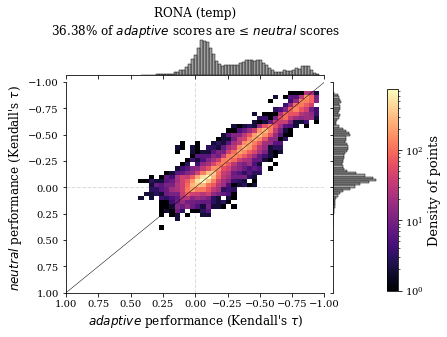

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_adaptive_neutral_with_RONA_2dhist.pdf


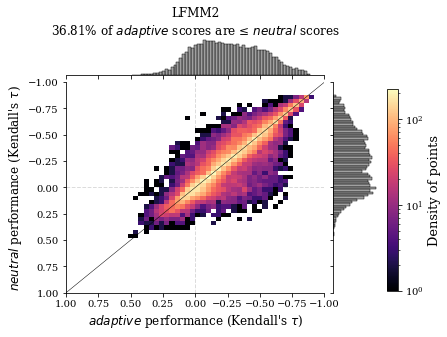

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_adaptive_neutral_with_RONA_2dhist.pdf


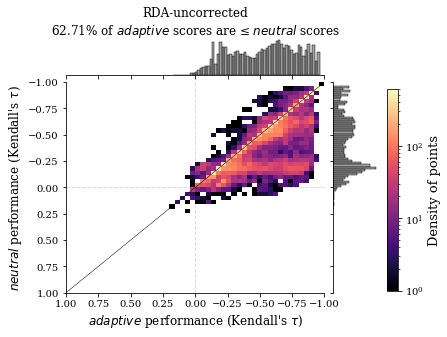

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_adaptive_neutral_with_RONA_2dhist.pdf


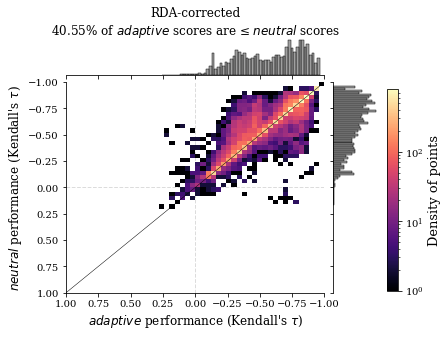

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_adaptive_neutral_with_RONA_2dhist.pdf


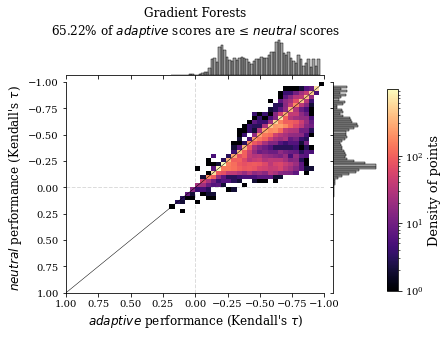

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-sal_opt_all_neutral_with_RONA_2dhist.pdf


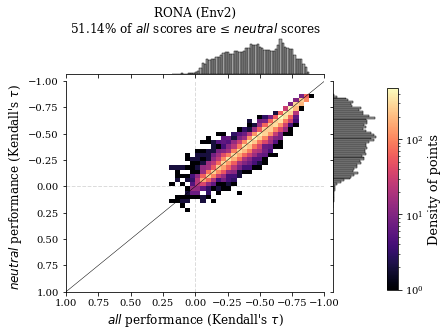

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/RONA-temp_opt_all_neutral_with_RONA_2dhist.pdf


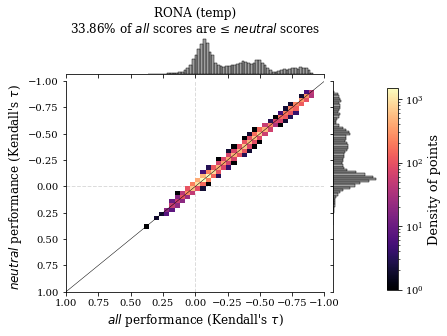

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/lfmm2_all_neutral_with_RONA_2dhist.pdf


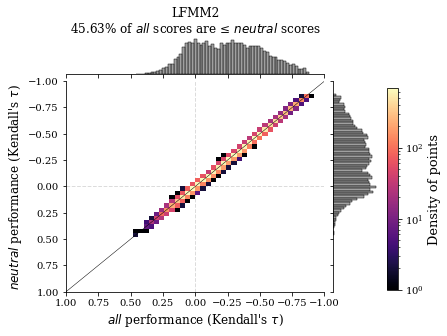

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-nocorr_all_neutral_with_RONA_2dhist.pdf


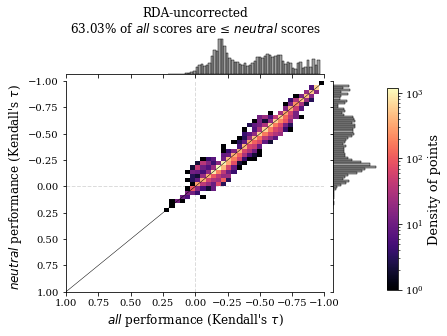

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/rda-structcorr_all_neutral_with_RONA_2dhist.pdf


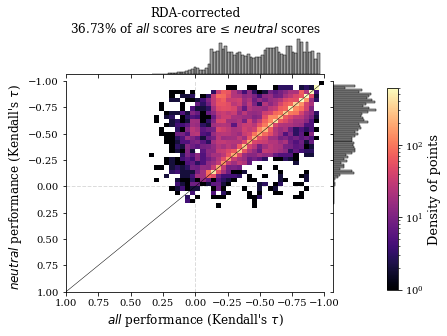

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/GF_all_neutral_with_RONA_2dhist.pdf


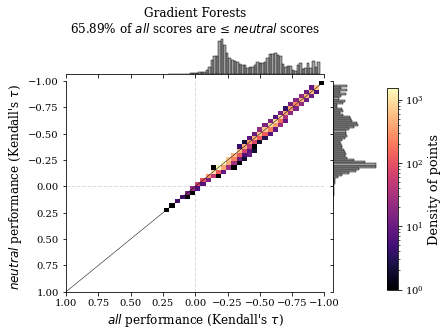

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/histo_diffs_RONA-sal_opt.pdf


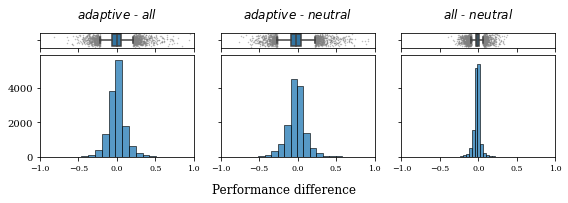

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/histo_diffs_RONA-temp_opt.pdf


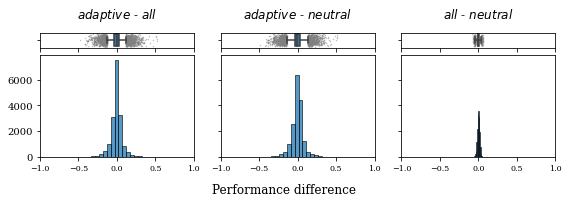

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/histo_diffs_lfmm2.pdf


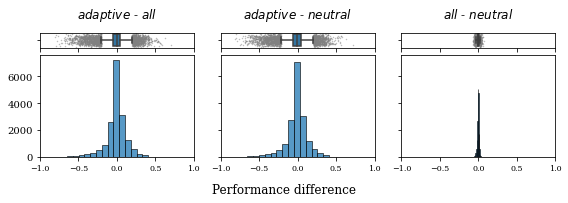

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/histo_diffs_rda-nocorr.pdf


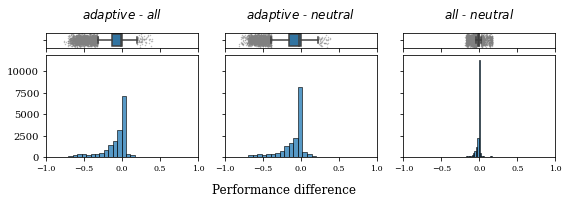

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/histo_diffs_rda-structcorr.pdf


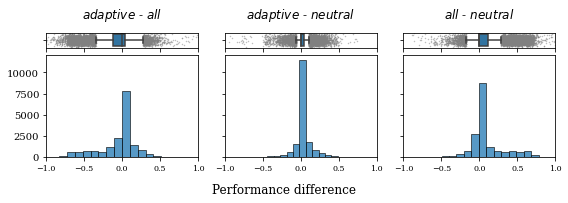

Saved to:  /work/lotterhos/MVP-Offsets/run_20220919/summaries/04_outlier_climate_runs/05_visualize_validation_of_outlier_predictions/figs/histo_diffs_GF.pdf


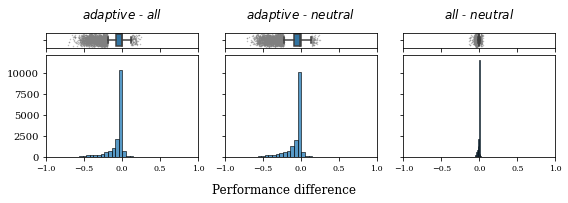

In [46]:
# by program
make_marker_figs(hue='program')

In [47]:
formatclock(dt.now() - t1)

'0-00:05:27'

In [48]:
len(fs(figdir, endswith='.pdf')), figcounter  # i forgot to count some figs

(226, 194)